## Import packages and initialize arrays 

In [32]:
import numpy as np
from numpy import loadtxt
from itertools import groupby
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns
from datetime import datetime
import datetime as dtt
from datetime import timedelta
import math
import scipy
from scipy.stats import norm
import statistics
from scipy import stats
import pymannkendall as mk
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
import warnings

from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import axes3d

from windstorms_wswd import *
from windstorms_ws import *

In [33]:
years = np.arange(2002,2023,1)        # 2002 - 2022
years_merra2 = np.arange(2002,2021,1) # 2002 - 2020
years_merra2_full = np.arange(1980,2021,1)  # 1980 - 2020

# Sensitivity testing
windstorms_lower_speed_threshold = np.zeros(len(years)) # 4m/s or 2.25m/s
windstorms_upper_speed_threshold = np.zeros(len(years)) # 6m/s or 6.75m/s
windstorms_lower_dur_threshold = np.zeros(len(years))   # 0.5h
windstorms_upper_dur_threshold = np.zeros(len(years))   # 2h
windstorms_lower_lull_threshold = np.zeros(len(years))  # 6h
windstorms_upper_lull_threshold = np.zeros(len(years))  # 18h

storm_durations_mean_ls = np.zeros(len(years))
storm_durations_median_ls = np.zeros(len(years))
storm_speeds_mean_ls = np.zeros(len(years))
storm_speeds_median_ls = np.zeros(len(years))
storm_durations_mean_us = np.zeros(len(years))
storm_durations_median_us = np.zeros(len(years))
storm_speeds_mean_us = np.zeros(len(years))
storm_speeds_median_us = np.zeros(len(years))

storm_durations_mean_ld = np.zeros(len(years))
storm_durations_median_ld = np.zeros(len(years))
storm_speeds_mean_ld = np.zeros(len(years))
storm_speeds_median_ld = np.zeros(len(years))
storm_durations_mean_ud = np.zeros(len(years))
storm_durations_median_ud = np.zeros(len(years))
storm_speeds_mean_ud = np.zeros(len(years))
storm_speeds_median_ud = np.zeros(len(years))

storm_durations_mean_ll = np.zeros(len(years))
storm_durations_median_ll = np.zeros(len(years))
storm_speeds_mean_ll = np.zeros(len(years))
storm_speeds_median_ll = np.zeros(len(years))
storm_durations_mean_ul = np.zeros(len(years))
storm_durations_median_ul = np.zeros(len(years))
storm_speeds_mean_ul = np.zeros(len(years))
storm_speeds_median_ul = np.zeros(len(years))

# Storm statistics
minutes_over_threshold = np.zeros(len(years))
windstorms_1min = np.zeros(len(years))
windstorms_monthly = np.zeros(len(years))
windstorms_merra2 = np.zeros(len(years)-2)
windstorms_merra2_full = np.zeros(len(years_merra2_full))
windstorms_hourly = np.zeros(len(years)-2)
storm_durations_mean = np.zeros(len(years))
storm_durations_median = np.zeros(len(years))
storm_speeds_mean= np.zeros(len(years))
storm_speeds_median = np.zeros(len(years))
storm_times = []

# Lull statistics
lulls = np.zeros(len(years))
lull_durations_mean = np.zeros(len(years))
lull_durations_median = np.zeros(len(years))
lulls_perstorm_mean = np.zeros(len(years))
lulls_perstorm_median = np.zeros(len(years))

## Functions

In [34]:
def storm_details(storm_number):
    lull_durations = [lull.duration for lull in storms_with_lulls[storm_number].lulls]
    print(f'The storm lasted {storms_with_lulls[storm_number].duration} minutes with {len(lull_durations)} lulls which lasted {np.median(lull_durations)} minutes on average, totaling {sum(lull_durations)} minutes.')

def doy_to_date(day_of_year, year):
    day_of_year = str(day_of_year) 
    year = str(year)
    day_of_year.rjust(3 + len(day_of_year), '0') # adjusting day number
    res = datetime.strptime(year + "/" + day_of_year, "%Y/%j").strftime("%m/%d/%Y") # converting to date
    return str(res) 

def mod1440_start(input_list):
    return [storm.start_index % 1440 for storm in input_list]

def mod1440_stop(input_list):
    return [storm.stop_index % 1440 for storm in input_list]

def count_over_thresholds(speeds: pd.Series, speed_threshold: float, directions: pd.Series, direction_thresholds: list):
    count = 0
    for index, (speed, direction) in enumerate(zip(speeds, directions)):
        if (speed >= speed_threshold) and (direction_thresholds[0] <= direction <= direction_thresholds[1]):
            count += 1
    return count

## Classify windstorms with 1-minute data

In [1394]:
# storm_starttimes_mod1440 = []
# storm_stoptimes_mod1440 = []
storm_times_mod1440 = []
windstorms_monthly = [] # timeseries of windstorms computed monthly from 2002-2022

height='10m'
subset = ['Year', 'DOY', 'MST', f'Avg Wind Speed @ {height} [m/s]', f'Avg Wind Direction @ {height} [deg]', 'Temperature @ 2m [deg C]', 'Relative Humidity [%]']

for i in np.arange(2002,2023,1): 
    year = i
    df = pd.read_csv(f'/Users/serena/Documents/Research/Data/{year}_data.csv', usecols=lambda x: x in subset)
    df.insert(2, 'Date', df['DOY'].apply(doy_to_date, args=(year,))) 
    df = df.replace(-99999.0, np.nan)
    df['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%Y') # convert date column to DateTime
    df.set_index('Date')
    
    storms_with_lulls = [storm                                                       
                     for storm in                                                
                     WindstormWithLulls.storms_by_threshold(df, 4.5, 12*60, [240, 330])         
                     if storm.duration >= 60 and np.median(storm.speed) >= 4.5 and np.mean(storm.speed) >= 4.5] 
    
    # storm_starttimes_mod1440.append(mod1440_start(storms_with_lulls))
    # storm_stoptimes_mod1440.append(mod1440_stop(storms_with_lulls))
    storm_times_mod1440.append(storm.time for storm in storms_with_lulls)
    # storm_times = [storm.time for storm in storms_with_lulls]
    # storm_durations = [storm.duration for storm in storms_with_lulls]   
    # storm_speeds = [np.mean(storm.speed) for storm in storms_with_lulls]   
    # lull_durations = [] 
    # lulls_per_storm = []
    
    # with warnings.catch_warnings():
    #     warnings.simplefilter("ignore", category=RuntimeWarning) # Suppresses "Mean of empty slice." Runtime error warning
    #     for j in range(len(storms_with_lulls)):
    #         lull_durations.append(np.nanmean([lull.duration for lull in storms_with_lulls[j].lulls]))
    # for j in range(len(storms_with_lulls)):
    #     lulls_per_storm.append(len(storms_with_lulls[j].lulls))
                
#     windstorms_1min[int(year)-2002] = len(storms_with_lulls)
#     storm_durations_mean[int(year)-2002] = np.mean(storm_durations)/60      # hours
#     storm_durations_median[int(year)-2002] = np.median(storm_durations)/60  # hours
#     storm_speeds_mean[int(year)-2002] = np.mean(storm_speeds)
#     storm_speeds_median[int(year)-2002] = np.median(storm_speeds)
#     lull_durations_mean[int(year)-2002] = np.nanmean(lull_durations)     # minutes
#     lull_durations_median[int(year)-2002] = np.nanmedian(lull_durations) # minutes
#     lulls_perstorm_mean[int(year)-2002] = np.mean(lulls_per_storm)
#     lulls_perstorm_median[int(year)-2002] = np.median(lulls_per_storm)
    
    print(f'Total windstorms in {year}: {len(storms_with_lulls)}')

Total windstorms in 2002: 78
Total windstorms in 2003: 53
Total windstorms in 2004: 56
Total windstorms in 2005: 46
Total windstorms in 2006: 54
Total windstorms in 2007: 53
Total windstorms in 2008: 69
Total windstorms in 2009: 51
Total windstorms in 2010: 55
Total windstorms in 2011: 62
Total windstorms in 2012: 67
Total windstorms in 2013: 59
Total windstorms in 2014: 52
Total windstorms in 2015: 44
Total windstorms in 2016: 65
Total windstorms in 2017: 47
Total windstorms in 2018: 49
Total windstorms in 2019: 60
Total windstorms in 2020: 49
Total windstorms in 2021: 53
Total windstorms in 2022: 55


In [1396]:
[len(e) for e in storm_starttimes_mod1440]

[78,
 53,
 56,
 46,
 54,
 53,
 69,
 51,
 55,
 62,
 67,
 59,
 52,
 44,
 65,
 47,
 49,
 60,
 49,
 53,
 55]

In [1412]:
storm_times_mod1440

[<generator object <genexpr> at 0x7ff0a8afab30>,
 <generator object <genexpr> at 0x7ff1918c06d0>,
 <generator object <genexpr> at 0x7ff0a868c970>,
 <generator object <genexpr> at 0x7ff1c3bf0200>,
 <generator object <genexpr> at 0x7ff1c3bf0740>,
 <generator object <genexpr> at 0x7ff1c3bf06d0>,
 <generator object <genexpr> at 0x7ff1d29bcf20>,
 <generator object <genexpr> at 0x7ff1c3c0b2e0>,
 <generator object <genexpr> at 0x7ff1d29a8040>,
 <generator object <genexpr> at 0x7ff1d29a8120>,
 <generator object <genexpr> at 0x7ff1d29bccf0>,
 <generator object <genexpr> at 0x7ff1c3bf0820>,
 <generator object <genexpr> at 0x7ff1c3bf0350>,
 <generator object <genexpr> at 0x7ff0a868cc80>,
 <generator object <genexpr> at 0x7ff1d29a8200>,
 <generator object <genexpr> at 0x7ff1d29a82e0>,
 <generator object <genexpr> at 0x7ff1d29a83c0>,
 <generator object <genexpr> at 0x7ff1d29a84a0>,
 <generator object <genexpr> at 0x7ff1d29a8580>,
 <generator object <genexpr> at 0x7ff1d29a8660>,
 <generator object <

In [1413]:
storm_times_daily = [item for sublist in storm_times for item in sublist]

In [1353]:
np.sum(windstorms_1min)

1170.0

In [53]:
d_d = {'Year': years, 'Windstorms': windstorms_1min, 'Windstorm mean wind speed (m/s)': storm_speeds_mean, 'Windstorm median wind speed (m/s)': storm_speeds_median, 'Windstorm mean duration (hours)': storm_durations_mean, 'Windstorm median duration (hours)': storm_durations_median, 'Average lulls per storm': lulls_perstorm_mean, 'Average lull duration (min)': lull_durations_mean}

df_d = pd.DataFrame(data=d_d)
df_d.to_csv(r'yearly_windstorms_full_data.csv', index=False)

df_d

,Year,Windstorms,Windstorm mean wind speed (m/s),Windstorm median wind speed (m/s),Windstorm mean duration (hours),Windstorm median duration (hours),Average lulls per storm,Average lull duration (min)
0,2002,81.0,6.159068,5.760369,29.202469,13.533333,69.765432,11.937404
1,2003,53.0,6.508934,6.098280,39.164151,26.783333,85.867925,14.031517
2,2004,60.0,6.102726,5.675198,28.161944,17.458333,63.250000,23.728454
3,2005,42.0,6.850447,6.568252,38.030952,26.775000,82.023810,13.957771
4,2006,55.0,6.652976,6.259015,42.704545,24.733333,91.890909,11.497638
5,2007,52.0,6.910308,6.461117,25.140705,13.558333,59.192308,17.777056
6,2008,68.0,6.619249,6.618375,33.707843,25.783333,72.117647,14.424989
7,2009,55.0,6.459530,5.779346,28.807273,16.533333,64.036364,14.171159
8,2010,56.0,6.266787,5.781918,23.636607,13.641667,57.357143,17.284076
9,2011,60.0,6.529966,5.994372,34.862222,20.633333,85.566667,14.764348


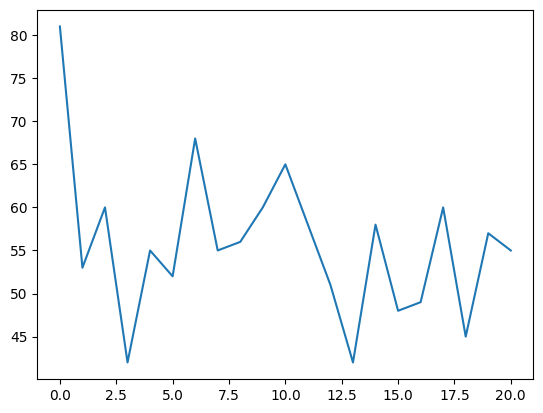

In [86]:
plt.plot(windstorms_1min)

#### Get details on an individual windstorm event

In [56]:
storm_details(0) # first storm of 2022 (last year run above)

The storm lasted 1040 minutes with 27 lulls which lasted 2.0 minutes on average, totaling 195 minutes.


In [ ]:
### idea: subtract lull mins from total mins and analyze how that's changed over time

In [59]:
storm = Windstorm(df, 10, 150) # indicates that a windstorm is defined by its start and end indices

In [58]:
storm.duration

140

In [60]:
print(f'Total windstorms in {year}:\t\t\t {len(storms_with_lulls)}')
print(f'Mean windstorm duration in {year}:\t\t {np.mean(storm_durations)/60} hours')
print(f'Median windstorm duration in {year}:\t\t {np.median(storm_durations)/60} hours\n')

print(f'Mean lull duration in {year}:\t\t\t {np.mean(lull_durations)} minutes')
print(f'Median lull duration in {year}:\t\t\t {np.median(lull_durations)} minutes')
print(f'Mean number of lulls per storm in {year}:\t\t {np.mean(lulls_per_storm)}')
print(f'Median number of lulls per storm in {year}:\t {np.median(lulls_per_storm)}')

Total windstorms in 2022:			 55
Mean windstorm duration in 2022:		 29.05878787878788 hours
Median windstorm duration in 2022:		 17.333333333333332 hours

Mean lull duration in 2022:			 19.98947231484167 minutes
Median lull duration in 2022:			 9.361702127659575 minutes
Mean number of lulls per storm in 2022:		 65.2909090909091
Median number of lulls per storm in 2022:	 36.0


### Minutely without wind direction

In [2418]:
windstorms_1min_ws = np.zeros(21)

height='10m'
subset = ['Year', 'DOY', 'MST', f'Avg Wind Speed @ {height} [m/s]']

for i in np.arange(2002,2023,1): 
    year = i
    df = pd.read_csv(f'/Users/serena/Documents/Research/Data/{year}_data.csv', usecols=lambda x: x in subset)
    df.insert(2, 'Date', df['DOY'].apply(doy_to_date, args=(year,))) 
    df = df.replace(-99999.0, np.nan)
    df['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%Y') # convert date column to DateTime
    df.set_index('Date')
    
    storms_with_lulls = [storm                                                       
                     for storm in                                                
                     WindstormWithLulls_ws.storms_by_threshold(df, 4.5, 12*60)         
                     if storm.duration >= 60 and np.median(storm.speed) >= 4.5 and np.mean(storm.speed) >= 4.5] 
    
    windstorms_1min_ws[int(year)-2002] = len(storms_with_lulls)
    print(f'Total windstorms in {year}: {len(storms_with_lulls)}')

Total windstorms in 2002: 14
Total windstorms in 2003: 15
Total windstorms in 2004: 14
Total windstorms in 2005: 7
Total windstorms in 2006: 18
Total windstorms in 2007: 16
Total windstorms in 2008: 21
Total windstorms in 2009: 13
Total windstorms in 2010: 13
Total windstorms in 2011: 18
Total windstorms in 2012: 12
Total windstorms in 2013: 16
Total windstorms in 2014: 12
Total windstorms in 2015: 12
Total windstorms in 2016: 17
Total windstorms in 2017: 10
Total windstorms in 2018: 13
Total windstorms in 2019: 13
Total windstorms in 2020: 8
Total windstorms in 2021: 11
Total windstorms in 2022: 11


In [2440]:
storm_details(0) # first storm of 2022 (last year run above)

The storm lasted 10996 minutes with 333 lulls which lasted 2.0 minutes on average, totaling 5136 minutes.


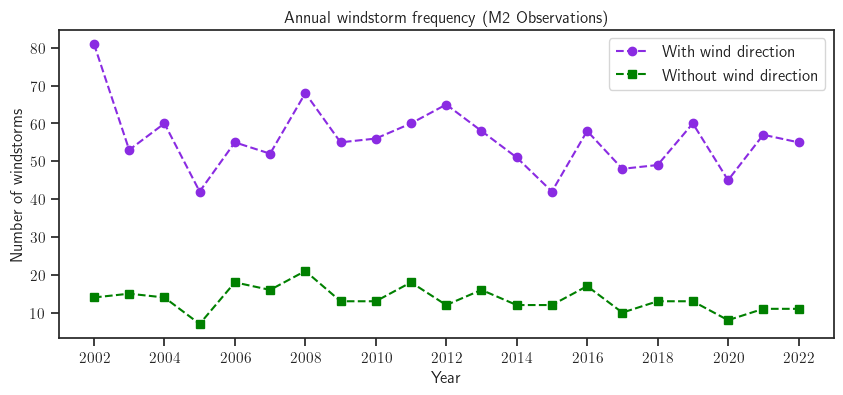

In [2424]:
plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(years, windstorms_1min,'o--', color='blueviolet', label='With wind direction')
plt.plot(years, windstorms_1min_ws,'s--', color='green', label='Without wind direction')

# plt.plot(x,trendpoly,color='blueviolet',label=f'Poisson model fit: \n${equation}, \, p={np.round(result.pvalues[1],3)}$')
# plt.plot(x,trendpoly2,color='green',label=f'Poisson model fit: \n${equation2}, \, p={np.round(result2.pvalues[1],3)}$')
plt.xlabel(f"Year")
plt.ylabel("Number of windstorms")
plt.xticks(np.arange(2002,2023,2))
plt.legend(prop={'size': 12},loc='best') 
plt.title("Annual windstorm frequency (M2 Observations)")
plt.savefig('obs_comparing_winddir.pdf',bbox_inches='tight')
plt.show()

## Classify windstorms with hourly data

In [2486]:
height='10m'
windstorm_durations_hourly = []
windstorm_hours = np.zeros(19)
storm_durations_mean_hourly = np.zeros(19)
storm_durations_median_hourly = np.zeros(19)
storm_speeds_mean_hourly = np.zeros(19)
storm_speeds_median_hourly = np.zeros(19)

for i in np.arange(2002,2021,1): 
    year = i
    df = pd.read_csv(f'/Users/serena/Documents/Research/Data/Hourly/{year}_hourly.csv')
    df = df.rename(columns={'HOUR-MST': 'MST', f'Avg Avg Wind Speed @ {height} [m/s]': f'Avg Wind Speed @ {height} [m/s]'})
    
    storms_with_lulls = [storm                                                       
                     for storm in                                                
                     WindstormWithLulls_ws.storms_by_threshold(df, 4.5, 12)         
                     if storm.duration >= 1 and np.median(storm.speed) >= 4.5 and np.mean(storm.speed) >= 4.5] 
    
    storm_durations_hourly = [storm.duration for storm in storms_with_lulls]   
    storm_speeds_hourly = [np.mean(storm.speed) for storm in storms_with_lulls]   
    lull_durations_hourly = [] 
    lulls_per_storm_hourly = []
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=RuntimeWarning) # Suppresses "Mean of empty slice." Runtime error warning (sometimes there are no lulls)
        for j in range(len(storms_with_lulls)):
            lull_durations_hourly.append(np.nanmean([lull.duration for lull in storms_with_lulls[j].lulls]))
    for j in range(len(storms_with_lulls)):
        lulls_per_storm_hourly.append(len(storms_with_lulls[j].lulls))
                
    storm_durations_mean_hourly[int(year)-2002] = np.mean(storm_durations_hourly)      # hours
    print(storm_durations_hourly)
    storm_durations_median_hourly[int(year)-2002] = np.median(storm_durations_hourly)  # hours
    storm_speeds_mean_hourly[int(year)-2002] = np.mean(storm_speeds_hourly)
    storm_speeds_median_hourly[int(year)-2002] = np.median(storm_speeds_hourly)
    
    # windstorm_durations.append([storm.duration for storm in storms_with_lulls])
    windstorm_durations_hourly.append(storm_durations_hourly)
    windstorm_hours[int(year)-2002] = np.sum(storm_durations_hourly)

    windstorms_hourly[int(year)-2002] = len(storms_with_lulls)
    print(f'Total windstorms in {year}: {len(storms_with_lulls)}')

[3, 85, 9, 100, 5, 71, 7, 46, 1, 1, 3, 9, 1, 58, 38, 1, 14, 1, 12, 4, 41, 83, 64, 87, 15, 23, 94, 6, 1, 33, 7, 1, 66, 33, 1, 9, 9, 148, 36, 106, 9, 25, 32, 20, 2, 2, 6, 1, 1, 58, 1, 7, 3, 5, 2, 3, 4, 10, 9, 5, 35, 1, 6, 12, 1, 5, 3, 10, 7, 7, 2, 6, 4, 2, 2, 2, 1, 6, 1, 1, 4, 3, 1, 82, 2, 6, 3, 4, 7, 7, 6, 16, 1, 22, 7, 1, 1, 3, 3, 9, 2, 36, 33, 2, 1, 1, 4, 1, 4, 3, 24, 71, 11, 13, 3, 6, 5, 12, 1, 44, 143, 2, 107, 1, 10, 10, 1, 9, 35, 1, 1, 42, 78, 42, 28, 33, 8, 52, 41]
Total windstorms in 2002: 139
[74, 17, 3, 1, 50, 10, 1, 113, 4, 2, 57, 1, 73, 13, 12, 4, 3, 4, 54, 1, 18, 1, 61, 3, 26, 250, 1, 31, 54, 55, 1, 11, 35, 34, 34, 3, 7, 65, 30, 6, 4, 39, 23, 2, 5, 2, 62, 1, 9, 2, 9, 16, 2, 1, 39, 10, 2, 15, 4, 5, 5, 2, 4, 1, 5, 2, 10, 1, 9, 1, 1, 4, 11, 3, 5, 54, 2, 2, 4, 13, 8, 4, 1, 3, 3, 51, 1, 1, 8, 1, 5, 8, 4, 4, 1, 4, 7, 76, 1, 4, 20, 7, 10, 30, 4, 4, 3, 6, 2, 7, 8, 4, 25, 10, 20, 42, 19, 52, 50, 65, 6, 144, 3, 22, 7, 1, 24, 11, 6, 9, 127, 34, 1, 1, 1, 103]
Total windstorms in 2003: 1

In [2487]:
windstorm_hours # total number of hours of windstorms per year
#Mann_Kendall_Test(trend='decreasing', h=True, p=0.04244167627001105, z=-2.0291631427698267, Tau=-0.34502923976608185, s=-59.0, var_s=817.0, slope=-32.214285714285715, intercept=2678.9285714285716)

array([2760., 2697., 2250., 2235., 3036., 2189., 2999., 2422., 1569.,
       2629., 2537., 2720., 2553., 1956., 2389., 2147., 1799., 1959.,
       2294.])

In [2399]:
windstorms_hourly # total number of annual windstorms (hourly data - wind speed only) 
# Mann_Kendall_Test(trend='no trend', h=False, p=0.23366612588424607, z=1.1909680549769, Tau=0.2046783625730994, s=35.0, var_s=815.0, slope=0.6, intercept=116.6)

array([139., 136., 114., 106., 107., 121., 116., 124., 108., 122., 124.,
       132., 117., 115., 130., 127., 125., 121., 137.])

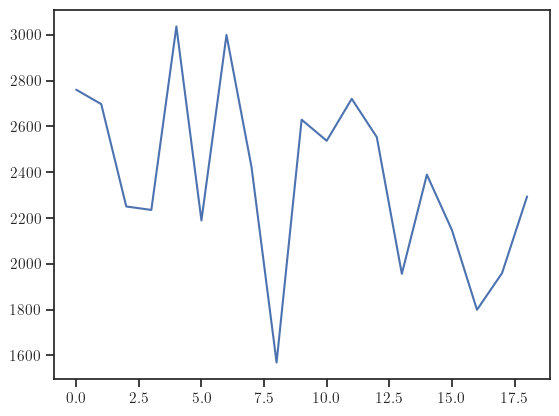

In [2482]:
plt.plot(windstorm_hours)

In [2316]:
df = pd.read_csv(f'/Users/serena/Documents/Research/Data/Hourly/MERRA2_2002.csv', skiprows=3, on_bad_lines='skip', sep=',')
df = df.drop(['electricity', 'time'], axis=1)
df

,local_time,wind_speed
0,2001-12-31 17:00,2.048
1,2001-12-31 18:00,1.716
2,2001-12-31 19:00,1.522
3,2001-12-31 20:00,1.348
4,2001-12-31 21:00,1.387
...,...,...
8755,2002-12-31 12:00,3.741
8756,2002-12-31 13:00,3.544
8757,2002-12-31 14:00,2.819
8758,2002-12-31 15:00,1.867


In [2488]:
windstorm_durations_hourly_merra2 = []
windstorm_hours_merra2 = np.zeros(19)
storm_durations_mean_hourly_merra2 = np.zeros(19)
storm_durations_median_hourly_merra2 = np.zeros(19)
storm_speeds_mean_hourly_merra2 = np.zeros(19)
storm_speeds_median_hourly_merra2 = np.zeros(19)

for i in np.arange(2002,2021,1):
    year = i
    df = pd.read_csv(f'/Users/serena/Documents/Research/Data/Hourly/MERRA2_{year}.csv', skiprows=3, on_bad_lines='skip', sep=',')
    df = df.drop(['electricity', 'time'], axis=1)
    df = df.replace(-99999.0, np.nan)
    df[['Date', 'MST']] = df['local_time'].str.split(' ', n=1, expand=True)
    del df["local_time"]  
    df = df.rename(columns={'wind_speed': 'Avg Wind Speed @ 10m [m/s]'})
    df['Date'] = pd.to_datetime(df.Date)
    df['Date'] = df['Date'].dt.strftime('%m/%d/%Y')
    
    storms_with_lulls = [storm                                                       
                     for storm in                                                
                     WindstormWithLulls_ws.storms_by_threshold(df, 4.5, 12)         
                     if storm.duration >= 1 and np.median(storm.speed) >= 4.5 and np.mean(storm.speed) >= 4.5] 
    
    lull_durations_hourly_merra2 = [] 
    lulls_per_storm_hourly_merra2 = []
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=RuntimeWarning) # Suppresses "Mean of empty slice." Runtime error warning (sometimes there are no lulls)
        for j in range(len(storms_with_lulls)):
            lull_durations_hourly_merra2.append(np.nanmean([lull.duration for lull in storms_with_lulls[j].lulls]))
    for j in range(len(storms_with_lulls)):
        lulls_per_storm_hourly_merra2.append(len(storms_with_lulls[j].lulls))
   
    storm_durations_hourly_merra2 = [storm.duration for storm in storms_with_lulls]   
    storm_speeds_hourly_merra2 = [np.mean(storm.speed) for storm in storms_with_lulls]  
    print(storm_durations_hourly_merra2)

    storm_durations_mean_hourly_merra2[int(year)-2002] = np.mean(storm_durations_hourly_merra2)      # hours
    storm_durations_median_hourly_merra2[int(year)-2002] = np.median(storm_durations_hourly_merra2)  # hours
    storm_speeds_mean_hourly_merra2[int(year)-2002] = np.mean(storm_speeds_hourly_merra2)
    storm_speeds_median_hourly_merra2[int(year)-2002] = np.median(storm_speeds_hourly_merra2)
    
    windstorm_durations_hourly_merra2.append(storm_durations_hourly_merra2)
    windstorm_hours_merra2[int(year)-2002] = np.sum(storm_durations_hourly_merra2)
    
    windstorms_merra2[int(year)-2002] = len(storms_with_lulls)
    print(f'Total windstorms in {year}: {len(storms_with_lulls)}')

[31, 94, 19, 30, 19, 55, 85, 13, 24, 18, 140, 7, 110, 37, 51, 88, 19, 51, 34, 9, 17, 11, 40, 28, 4, 2, 88, 18, 4, 9, 35, 42, 9, 8, 3, 1, 9, 5, 1, 34, 7, 1, 3, 1, 2, 4, 1, 3, 22, 2, 2, 3, 4, 4, 3, 2, 3, 2, 2, 3, 4, 1, 1, 4, 1, 2, 1, 6, 1, 1, 1, 3, 1, 5, 12, 11, 2, 3, 3, 2, 6, 3, 8, 9, 2, 75, 53, 31, 2, 31, 33, 7, 14, 50, 14, 11, 76, 22, 5, 2, 101]
Total windstorms in 2002: 101
[72, 10, 39, 37, 16, 6, 64, 4, 41, 101, 5, 3, 2, 53, 9, 3, 18, 8, 32, 192, 7, 12, 55, 10, 15, 1, 211, 8, 3, 9, 6, 2, 11, 1, 6, 10, 39, 12, 10, 40, 7, 1, 15, 5, 1, 3, 1, 3, 13, 2, 5, 1, 3, 3, 6, 7, 2, 7, 1, 1, 3, 5, 7, 1, 2, 2, 1, 2, 2, 18, 5, 4, 1, 3, 8, 23, 7, 5, 6, 1, 4, 7, 13, 6, 8, 2, 9, 9, 1, 40, 27, 4, 5, 5, 19, 7, 8, 76, 9, 40, 3, 65, 18, 2, 113, 8, 101]
Total windstorms in 2003: 107
[2, 20, 7, 7, 107, 29, 18, 9, 42, 7, 104, 47, 8, 3, 4, 1, 14, 5, 8, 28, 62, 8, 77, 27, 2, 2, 3, 48, 17, 9, 3, 9, 1, 3, 3, 8, 10, 5, 42, 32, 2, 9, 6, 50, 5, 12, 2, 10, 11, 5, 5, 3, 33, 3, 5, 2, 4, 3, 2, 11, 1, 3, 3, 38, 4, 8, 3,

In [2489]:
windstorm_hours_merra2 # total number of hours of windstorms per year
# Mann_Kendall_Test(trend='no trend', h=False, p=0.1417259538064679, z=-1.4693939999367711, Tau=-0.25146198830409355, s=-43.0, var_s=817.0, slope=-11.0, intercept=2088.0)

array([1996., 1985., 1847., 2029., 2462., 2076., 2622., 2215., 1646.,
       2276., 1975., 2023., 2292., 1445., 1879., 1989., 1832., 1533.,
       1959.])

In [2491]:
windstorms_merra2 # total number of annual windstorms (hourly data - wind speed only) 
# Mann_Kendall_Test(trend='no trend', h=False, p=0.12325527712889861, z=1.5412527770289293, Tau=0.2631578947368421, s=45.0, var_s=815.0, slope=0.75, intercept=110.25)

array([101., 107., 122., 115., 116., 132., 117.,  91., 112., 125., 117.,
       124., 101., 108., 118., 121., 127., 111., 144.])

In [2320]:
df

,Avg Wind Speed @ 10m [m/s],Date,MST
0,4.876,12/31/2019,17:00
1,5.750,12/31/2019,18:00
2,6.369,12/31/2019,19:00
3,7.163,12/31/2019,20:00
4,7.728,12/31/2019,21:00
...,...,...,...
8779,1.620,12/31/2020,12:00
8780,2.373,12/31/2020,13:00
8781,2.505,12/31/2020,14:00
8782,2.340,12/31/2020,15:00


In [25]:
for i in np.arange(1980,2021,1):
    year = i
    df = pd.read_csv(f'/Users/serena/Documents/Research/Data/Hourly/MERRA2_{year}.csv', skiprows=3, on_bad_lines='skip', sep=',')
    df = df.replace(-99999.0, np.nan)
    df = df.loc[:, df.columns.isin(['local_time', 'wind_speed'])]
    df[['Date', 'MST']] = df['local_time'].str.split(' ', n=1, expand=True)
    del df["local_time"]  
    df = df.rename(columns={'wind_speed': 'Avg Wind Speed @ 10m [m/s]', 'Date': 'Date'})
    df['Date'] = pd.to_datetime(df.Date)
    df['Date'] = df['Date'].dt.strftime('%m/%d/%Y')
    
    storms_with_lulls = [storm                                                       
                     for storm in                                                
                     WindstormWithLulls_ws.storms_by_threshold(df, 4.5, 12)         
                     if storm.duration >= 1 and np.median(storm.speed) >= 4.5 and np.mean(storm.speed) >= 4.5] 
    
    storm_durations = [storm.duration for storm in storms_with_lulls]
    windstorms_merra2_full[int(year)-2002] = len(storms_with_lulls)
    print(f'Total windstorms in {year}: {len(storms_with_lulls)}')

Total windstorms in 1980: 133
Total windstorms in 1981: 108
Total windstorms in 1982: 106
Total windstorms in 1983: 112
Total windstorms in 1984: 114
Total windstorms in 1985: 125
Total windstorms in 1986: 111
Total windstorms in 1987: 113
Total windstorms in 1988: 125
Total windstorms in 1989: 127
Total windstorms in 1990: 121
Total windstorms in 1991: 124
Total windstorms in 1992: 108
Total windstorms in 1993: 99
Total windstorms in 1994: 114
Total windstorms in 1995: 109
Total windstorms in 1996: 101
Total windstorms in 1997: 104
Total windstorms in 1998: 101
Total windstorms in 1999: 125
Total windstorms in 2000: 128
Total windstorms in 2001: 119
Total windstorms in 2002: 101
Total windstorms in 2003: 107
Total windstorms in 2004: 122
Total windstorms in 2005: 115
Total windstorms in 2006: 116
Total windstorms in 2007: 132
Total windstorms in 2008: 117
Total windstorms in 2009: 91
Total windstorms in 2010: 112
Total windstorms in 2011: 125
Total windstorms in 2012: 117
Total windst

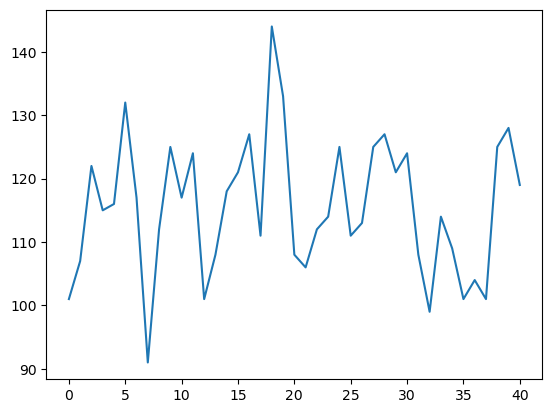

In [26]:
plt.plot(windstorms_merra2_full)

#### 1-min windstorms vs hourly merra2 windstorms

In [2393]:
y = windstorms_1min[0:-2]
x = np.arange(len(y))
mod = sm.GLS(y, sm.add_constant(x))
result = mod.fit()
trendpoly = result.params[1]*x+result.params[0]
# obs_gls_params = [result.params[0],result.params[1]]
x = x.reshape(-1, 1)
equation = f'y = {result.params[0]:.3f} + {result.params[1]:.3f}x'
print(equation)

y = windstorms_merra2
x = np.arange(len(y))
mod = sm.GLS(y, sm.add_constant(x))
result2 = mod.fit()
trendpoly2 = result2.params[1]*x+result2.params[0]
# merra2_gls_params = [result2.params[0],result2.params[1]]
x = x.reshape(-1, 1)
equation2 = f'y = {result2.params[0]:.3f} + {result2.params[1]:.3f}x'
print(equation2)

y = 61.526 + -0.649x
y = 109.521 + 0.749x


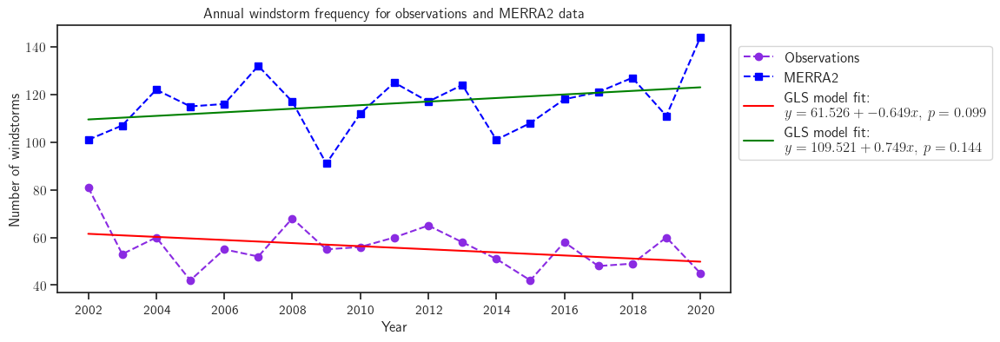

In [2394]:
# apples to oranges sort of, 1min windstorms with wind direction vs hourly windstorms without wind direction

plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(x, windstorms_1min[0:-2],'o--', color='blueviolet', label='Observations')
plt.plot(x, windstorms_merra2,'s--', color='blue', label='MERRA2')


plt.plot(x,trendpoly,color='red',label=f'GLS model fit: \n${equation}, \, p={np.round(result.pvalues[1],3)}$')
plt.plot(x,trendpoly2,color='green',label=f'GLS model fit: \n${equation2}, \, p={np.round(result2.pvalues[1],3)}$')
plt.xlabel(f"Year")
plt.ylabel("Number of windstorms")
plt.xticks(np.arange(0,20,2),np.arange(2002,2021,2))
plt.legend(prop={'size': 12},bbox_to_anchor=(1., 0.95)) 
plt.title("Annual windstorm frequency for observations and MERRA2 data")
plt.savefig('obs_vs_merra2_gls.pdf',bbox_inches='tight')
plt.show()

In [2395]:
# apples to oranges sort of, 1min windstorms with wind direction vs hourly windstorms without wind direction

y = windstorms_1min[0:-2]
x = np.arange(len(y))

poisson_model = sm.GLM(y, sm.add_constant(x), family=sm.families.Poisson())
result = poisson_model.fit()
obs_pois_params = [result.params[0],result.params[1]]
pois_eq = np.exp(result.params[0]+result.params[1]*x)
x = x.reshape(-1, 1)
equation = f'y = exp({result.params[0]:.3f} + {result.params[1]:.3f}x)'
print(equation)

y = windstorms_merra2
x = np.arange(len(y))
poisson_model = sm.GLM(y, sm.add_constant(x), family=sm.families.Poisson())
result2 = poisson_model.fit()
merra2_pois_params = [result2.params[0],result2.params[1]]
pois_eq2 = np.exp(result2.params[0]+result2.params[1]*x)
x = x.reshape(-1, 1)
equation2 = f'y = exp({merra2_pois_params[0]:.3f} + {merra2_pois_params[1]:.3f}x)'
print(equation2)

y = exp(4.123 + -0.012x)
y = exp(4.697 + 0.006x)


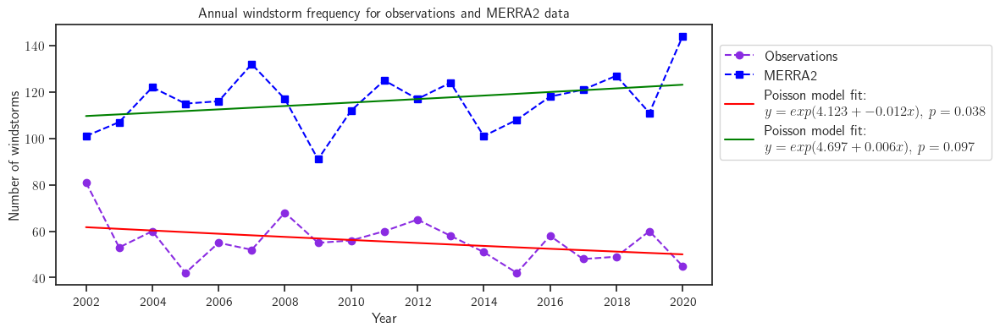

In [2396]:
# apples to oranges sort of, 1min windstorms with wind direction vs hourly windstorms without wind direction

plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(x, windstorms_1min[0:-2],'o--', color='blueviolet', label='Observations')
plt.plot(x, windstorms_merra2,'s--', color='blue', label='MERRA2')

plt.plot(x,pois_eq,color='red',label=f'Poisson model fit: \n${equation}, \, p={np.round(result.pvalues[1],3)}$')
plt.plot(x,pois_eq2,color='green',label=f'Poisson model fit: \n${equation2}, \, p={np.round(result2.pvalues[1],3)}$')
plt.xlabel(f"Year")
plt.ylabel("Number of windstorms")
plt.xticks(np.arange(0,20,2),np.arange(2002,2021,2))
plt.legend(prop={'size': 12},bbox_to_anchor=(1., 0.95)) 
plt.title("Annual windstorm frequency for observations and MERRA2 data")
plt.savefig('obs_vs_merra2_poisson.pdf',bbox_inches='tight')
plt.show()

#### Without wind direction

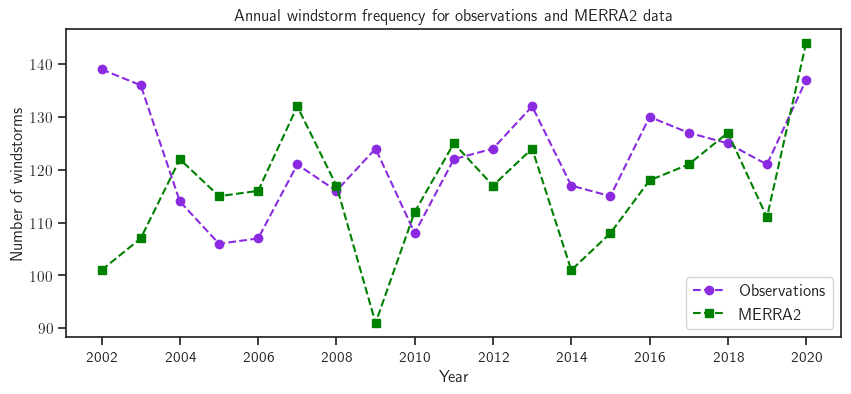

In [2506]:
# apples to apples! hourly windstorms with only wind speed

plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(x, windstorms_hourly,'o--', color='blueviolet', label='Observations')
plt.plot(x, windstorms_merra2,'s--', color='green', label='MERRA2')

plt.xlabel(f"Year")
plt.ylabel("Number of windstorms")
plt.xticks(np.arange(0,20,2),np.arange(2002,2021,2))
# plt.legend(prop={'size': 12},bbox_to_anchor=(1., 0.95)) 
plt.legend(prop={'size': 12},loc='lower right') 
plt.title("Annual windstorm frequency for observations and MERRA2 data")
plt.savefig('obs_vs_merra2_ws.pdf',bbox_inches='tight')
plt.show()

In [2499]:
scipy.stats.spearmanr(windstorms_hourly, windstorms_merra2) 

SignificanceResult(statistic=0.14982425307557118, pvalue=0.5404026850690969)

ShapiroResult(statistic=0.9651187062263489, pvalue=0.6763383746147156)

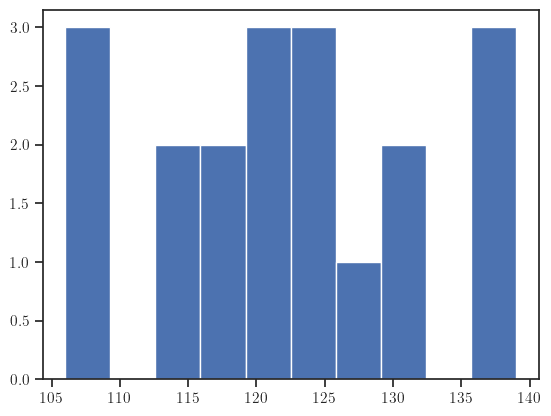

In [2515]:
plt.hist(windstorms_hourly)
shapiro(windstorms_hourly)

In [2500]:
scipy.stats.pearsonr(windstorms_hourly, windstorms_merra2) 

PearsonRResult(statistic=0.13076321668809004, pvalue=0.5936263656096694)

y = 119.142 + 0.335x
y = 109.521 + 0.749x


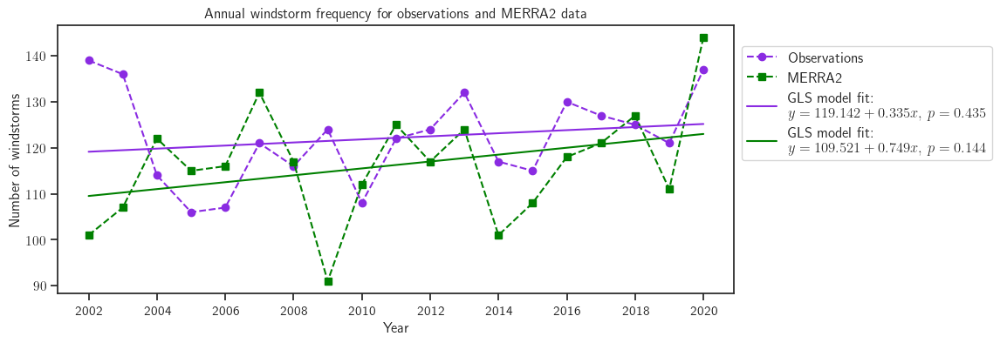

In [2518]:
y = windstorms_hourly
x = np.arange(len(y))
mod = sm.GLS(y, sm.add_constant(x))
result = mod.fit()
trendpoly = result.params[1]*x+result.params[0]
# obs_gls_params = [result.params[0],result.params[1]]
x = x.reshape(-1, 1)
equation = f'y = {result.params[0]:.3f} + {result.params[1]:.3f}x'
print(equation)

y = windstorms_merra2
x = np.arange(len(y))
mod = sm.GLS(y, sm.add_constant(x))
result2 = mod.fit()
trendpoly2 = result2.params[1]*x+result2.params[0]
# merra2_gls_params = [result2.params[0],result2.params[1]]
x = x.reshape(-1, 1)
equation2 = f'y = {result2.params[0]:.3f} + {result2.params[1]:.3f}x'
print(equation2)

plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(x, windstorms_hourly,'o--', color='blueviolet', label='Observations')
plt.plot(x, windstorms_merra2,'s--', color='green', label='MERRA2')

plt.plot(x,trendpoly,color='blueviolet',label=f'GLS model fit: \n${equation}, \, p={np.round(result.pvalues[1],3)}$')
plt.plot(x,trendpoly2,color='green',label=f'GLS model fit: \n${equation2}, \, p={np.round(result2.pvalues[1],3)}$')
plt.xlabel(f"Year")
plt.ylabel("Number of windstorms")
plt.xticks(np.arange(0,20,2),np.arange(2002,2021,2))
plt.legend(prop={'size': 12},bbox_to_anchor=(1., 0.95)) 
plt.title("Annual windstorm frequency for observations and MERRA2 data")
plt.savefig('obs_vs_merra2_gls_ws.pdf',bbox_inches='tight')
plt.show()

y = exp(4.781 + 0.003x)
y = exp(4.697 + 0.006x)


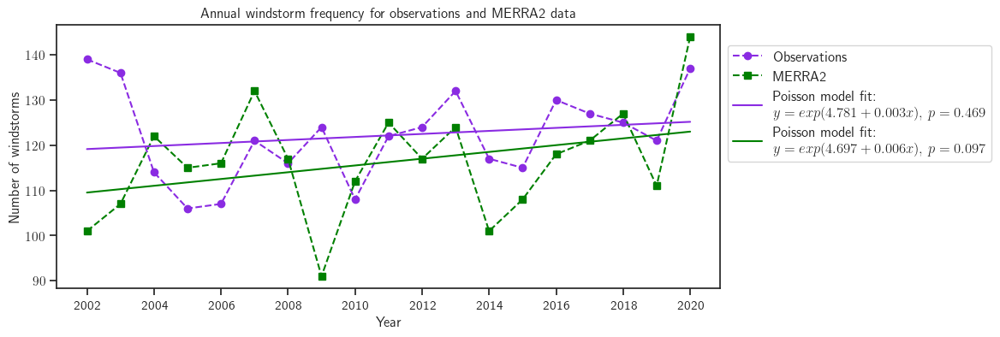

In [2519]:
y = windstorms_hourly
x = np.arange(len(y))

poisson_model = sm.GLM(y, sm.add_constant(x), family=sm.families.Poisson())
result = poisson_model.fit()
obs_pois_params = [result.params[0],result.params[1]]
pois_eq = np.exp(result.params[0]+result.params[1]*x)
x = x.reshape(-1, 1)
equation = f'y = exp({result.params[0]:.3f} + {result.params[1]:.3f}x)'
print(equation)

y = windstorms_merra2
x = np.arange(len(y))
poisson_model = sm.GLM(y, sm.add_constant(x), family=sm.families.Poisson())
result2 = poisson_model.fit()
merra2_pois_params = [result2.params[0],result2.params[1]]
pois_eq2 = np.exp(result2.params[0]+result2.params[1]*x)
x = x.reshape(-1, 1)
equation2 = f'y = exp({merra2_pois_params[0]:.3f} + {merra2_pois_params[1]:.3f}x)'
print(equation2)

plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(x, windstorms_hourly,'o--', color='blueviolet', label='Observations')
plt.plot(x, windstorms_merra2,'s--', color='green', label='MERRA2')

plt.plot(x,trendpoly,color='blueviolet',label=f'Poisson model fit: \n${equation}, \, p={np.round(result.pvalues[1],3)}$')
plt.plot(x,trendpoly2,color='green',label=f'Poisson model fit: \n${equation2}, \, p={np.round(result2.pvalues[1],3)}$')
plt.xlabel(f"Year")
plt.ylabel("Number of windstorms")
plt.xticks(np.arange(0,20,2),np.arange(2002,2021,2))
plt.legend(prop={'size': 12},bbox_to_anchor=(1., 0.95)) 
plt.title("Annual windstorm frequency for observations and MERRA2 data")
plt.savefig('obs_vs_merra2_poisson_ws.pdf',bbox_inches='tight')
plt.show()

#### Windstorm hours

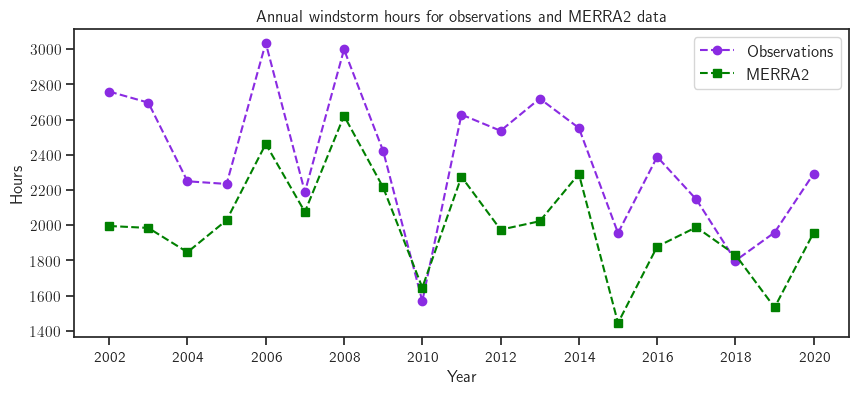

In [2504]:
# apples to apples! hourly windstorms with only wind speed

plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(x, windstorm_hours,'o--', color='blueviolet', label='Observations')
plt.plot(x, windstorm_hours_merra2,'s--', color='green', label='MERRA2')

plt.xlabel(f"Year")
plt.ylabel("Hours")
plt.xticks(np.arange(0,20,2),np.arange(2002,2021,2))
# plt.legend(prop={'size': 12},bbox_to_anchor=(1., 0.95)) 
plt.legend(prop={'size': 12},loc='best') 
plt.title("Annual windstorm hours for observations and MERRA2 data")
plt.savefig('obs_vs_merra2_ws_hours.pdf',bbox_inches='tight')
plt.show()

In [2502]:
scipy.stats.spearmanr(windstorm_hours, windstorm_hours_merra2) 

SignificanceResult(statistic=0.7263157894736841, pvalue=0.0004292336928359065)

ShapiroResult(statistic=0.9666807651519775, pvalue=0.7086724638938904)

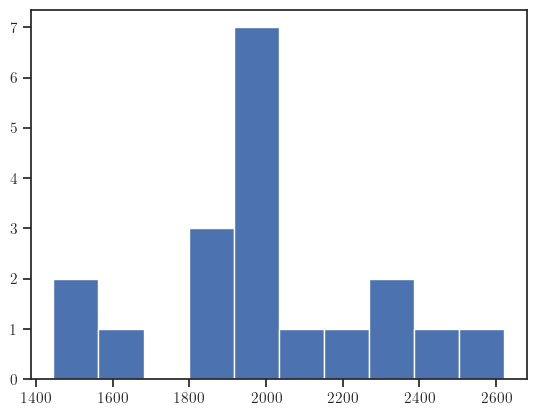

In [2516]:
plt.hist(windstorm_hours_merra2)
shapiro(windstorm_hours_merra2)

In [2503]:
scipy.stats.pearsonr(windstorm_hours, windstorm_hours_merra2) 

PearsonRResult(statistic=0.792399263787884, pvalue=5.239852533341581e-05)

y = 2655.642 + -31.095x
y = 2174.442 + -18.909x


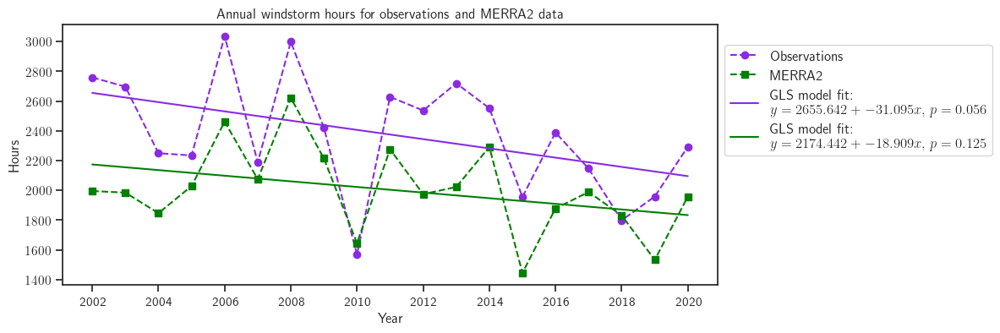

In [2520]:
y = windstorm_hours
x = np.arange(len(y))
mod = sm.GLS(y, sm.add_constant(x))
result = mod.fit()
trendpoly = result.params[1]*x+result.params[0]
# obs_gls_params = [result.params[0],result.params[1]]
x = x.reshape(-1, 1)
equation = f'y = {result.params[0]:.3f} + {result.params[1]:.3f}x'
print(equation)

y = windstorm_hours_merra2
x = np.arange(len(y))
mod = sm.GLS(y, sm.add_constant(x))
result2 = mod.fit()
trendpoly2 = result2.params[1]*x+result2.params[0]
# merra2_gls_params = [result2.params[0],result2.params[1]]
x = x.reshape(-1, 1)
equation2 = f'y = {result2.params[0]:.3f} + {result2.params[1]:.3f}x'
print(equation2)

plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(x, windstorm_hours,'o--', color='blueviolet', label='Observations')
plt.plot(x, windstorm_hours_merra2,'s--', color='green', label='MERRA2')

plt.plot(x,trendpoly,color='blueviolet',label=f'GLS model fit: \n${equation}, \, p={np.round(result.pvalues[1],3)}$')
plt.plot(x,trendpoly2,color='green',label=f'GLS model fit: \n${equation2}, \, p={np.round(result2.pvalues[1],3)}$')
plt.xlabel(f"Year")
plt.ylabel("Hours")
plt.xticks(np.arange(0,20,2),np.arange(2002,2021,2))
plt.legend(prop={'size': 12},bbox_to_anchor=(1., 0.95)) 
plt.title("Annual windstorm hours for observations and MERRA2 data")
plt.savefig('obs_vs_merra2_gls_ws_h.pdf',bbox_inches='tight')
plt.show()

y = exp(7.888 + -0.013x)
y = exp(7.687 + -0.009x)


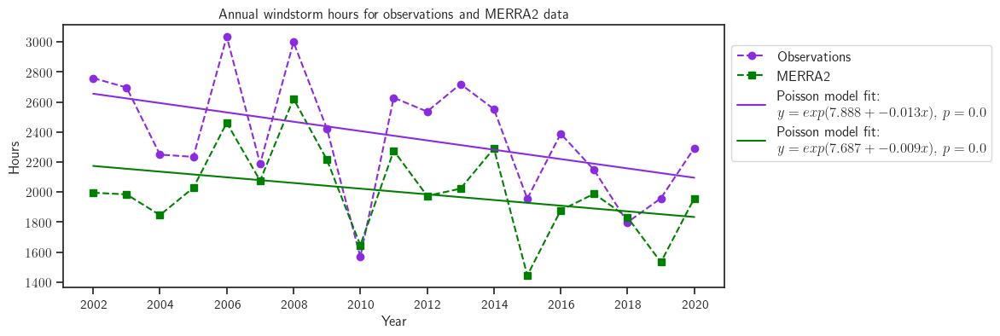

In [2521]:
y = windstorm_hours
x = np.arange(len(y))

poisson_model = sm.GLM(y, sm.add_constant(x), family=sm.families.Poisson())
result = poisson_model.fit()
obs_pois_params = [result.params[0],result.params[1]]
pois_eq = np.exp(result.params[0]+result.params[1]*x)
x = x.reshape(-1, 1)
equation = f'y = exp({result.params[0]:.3f} + {result.params[1]:.3f}x)'
print(equation)

y = windstorm_hours_merra2
x = np.arange(len(y))
poisson_model = sm.GLM(y, sm.add_constant(x), family=sm.families.Poisson())
result2 = poisson_model.fit()
merra2_pois_params = [result2.params[0],result2.params[1]]
pois_eq2 = np.exp(result2.params[0]+result2.params[1]*x)
x = x.reshape(-1, 1)
equation2 = f'y = exp({merra2_pois_params[0]:.3f} + {merra2_pois_params[1]:.3f}x)'
print(equation2)

plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(x, windstorm_hours,'o--', color='blueviolet', label='Observations')
plt.plot(x, windstorm_hours_merra2,'s--', color='green', label='MERRA2')

plt.plot(x,trendpoly,color='blueviolet',label=f'Poisson model fit: \n${equation}, \, p={np.round(result.pvalues[1],3)}$')
plt.plot(x,trendpoly2,color='green',label=f'Poisson model fit: \n${equation2}, \, p={np.round(result2.pvalues[1],3)}$')
plt.xlabel(f"Year")
plt.ylabel("Hours")
plt.xticks(np.arange(0,20,2),np.arange(2002,2021,2))
plt.legend(prop={'size': 12},bbox_to_anchor=(1., 0.95)) 
plt.title("Annual windstorm hours for observations and MERRA2 data")
plt.savefig('obs_vs_merra2_poisson_ws_h.pdf',bbox_inches='tight')
plt.show()

#### Properties

In [ ]:
storm_durations_mean_hourly_merra2
storm_durations_median_hourly_merra2
storm_speeds_mean_hourly_merra2
storm_speeds_median_hourly_merra2

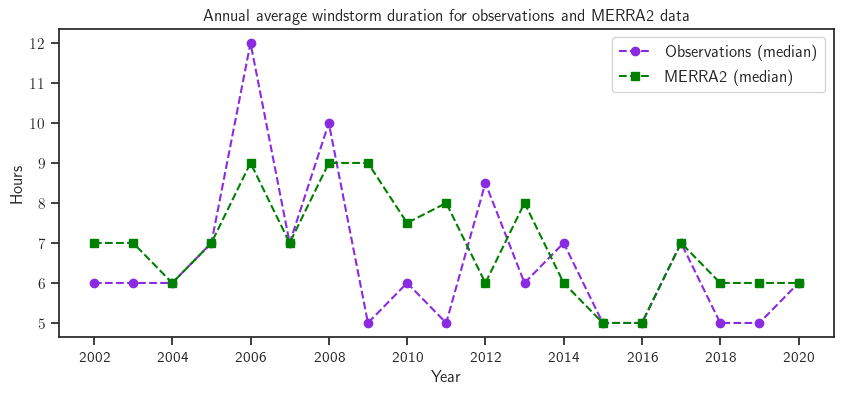

In [2532]:
plt.figure(figsize=(10,4))
sns.set_style("ticks")
# plt.plot(x, storm_durations_mean_hourly,'o--', color='blueviolet', label='Observations (mean)')
# plt.plot(x, storm_durations_mean_hourly_merra2,'s--', color='green', label='MERRA2 (mean)')
plt.plot(x, storm_durations_median_hourly,'o--', color='blueviolet', label='Observations (median)')
plt.plot(x, storm_durations_median_hourly_merra2,'s--', color='green', label='MERRA2 (median)')

plt.xlabel("Year")
plt.ylabel("Hours")
plt.xticks(np.arange(0,20,2),np.arange(2002,2021,2))
# plt.legend(prop={'size': 12},bbox_to_anchor=(1., 0.95)) 
plt.legend(prop={'size': 12},loc='best') 
plt.title("Annual average windstorm duration for observations and MERRA2 data")
# plt.savefig('obs_vs_merra2_ws.pdf',bbox_inches='tight')
plt.show()

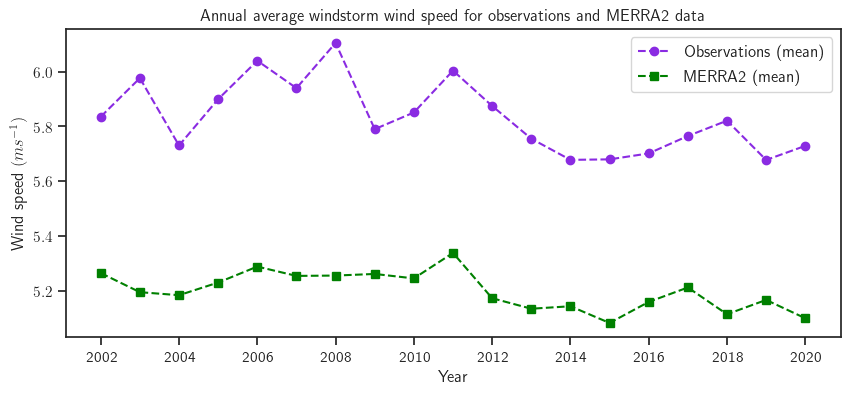

In [2530]:
plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(x, storm_speeds_mean_hourly,'o--', color='blueviolet', label='Observations (mean)')
plt.plot(x, storm_speeds_mean_hourly_merra2,'s--', color='green', label='MERRA2 (mean)')
# plt.plot(x, storm_durations_median_hourly,'o--', color='blueviolet', label='Observations (median)')
# plt.plot(x, storm_durations_median_hourly_merra2,'s--', color='green', label='MERRA2 (median)')

plt.xlabel("Year")
plt.ylabel(r"Wind speed $(m s^{-1})$")
plt.xticks(np.arange(0,20,2),np.arange(2002,2021,2))
# plt.legend(prop={'size': 12},bbox_to_anchor=(1., 0.95)) 
plt.legend(prop={'size': 12},loc='best') 
plt.title("Annual average windstorm wind speed for observations and MERRA2 data")
# plt.savefig('obs_vs_merra2_ws.pdf',bbox_inches='tight')
plt.show()

## Sensitivity testing

In [2277]:
height='10m'
subset = ['Year', 'DOY', 'MST', f'Avg Wind Speed @ {height} [m/s]', f'Avg Wind Direction @ {height} [deg]', 'Temperature @ 2m [deg C]', 'Relative Humidity [%]']

for i in np.arange(2002,2023,1): 
    year = i
    df = pd.read_csv(f'/Users/serena/Documents/Research/Data/{year}_data.csv', usecols=lambda x: x in subset)
    df.insert(2, 'Date', df['DOY'].apply(doy_to_date, args=(year,))) 
    df = df.replace(-99999.0, np.nan)
    df['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%Y') # convert date column to DateTime
    df.set_index('Date')
    
    storms_with_lulls = [storm                                                       
                     for storm in                                                
                     WindstormWithLulls.storms_by_threshold(df, 2.25, 12*60, [240, 330])
                     if storm.duration >= 60 and np.median(storm.speed) >= 2.25 and np.mean(storm.speed) >= 2.25] 
    
    storm_durations = [storm.duration for storm in storms_with_lulls]   
    storm_speeds = [np.mean(storm.speed) for storm in storms_with_lulls]   
                
    windstorms_lower_speed_threshold[int(year)-2002] = len(storms_with_lulls)
    storm_durations_mean_ls[int(year)-2002] = np.mean(storm_durations)/60      # hours
    storm_durations_median_ls[int(year)-2002] = np.median(storm_durations)/60  # hours
    storm_speeds_mean_ls[int(year)-2002] = np.mean(storm_speeds)
    storm_speeds_median_ls[int(year)-2002] = np.median(storm_speeds)

    print(f'Total windstorms in {year}: {len(storms_with_lulls)}')

Total windstorms in 2002: 84
Total windstorms in 2003: 81
Total windstorms in 2004: 71
Total windstorms in 2005: 75
Total windstorms in 2006: 84
Total windstorms in 2007: 73
Total windstorms in 2008: 66
Total windstorms in 2009: 74
Total windstorms in 2010: 78
Total windstorms in 2011: 70
Total windstorms in 2012: 73
Total windstorms in 2013: 70
Total windstorms in 2014: 63
Total windstorms in 2015: 60
Total windstorms in 2016: 74
Total windstorms in 2017: 60
Total windstorms in 2018: 76
Total windstorms in 2019: 60
Total windstorms in 2020: 73
Total windstorms in 2021: 62
Total windstorms in 2022: 56


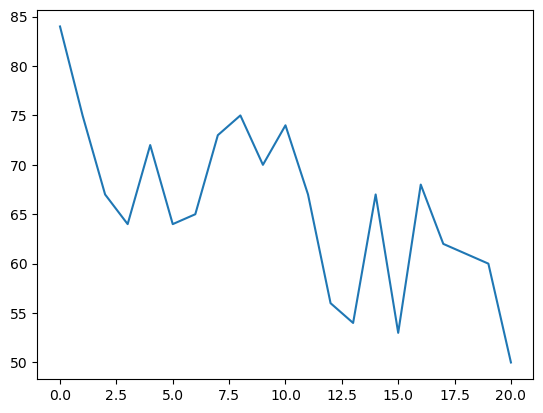

In [31]:
plt.plot(windstorms_lower_speed_threshold)

In [2279]:
height='10m'
subset = ['Year', 'DOY', 'MST', f'Avg Wind Speed @ {height} [m/s]', f'Avg Wind Direction @ {height} [deg]', 'Temperature @ 2m [deg C]', 'Relative Humidity [%]']

for i in np.arange(2002,2023,1): 
    year = i
    df = pd.read_csv(f'/Users/serena/Documents/Research/Data/{year}_data.csv', usecols=lambda x: x in subset)
    df.insert(2, 'Date', df['DOY'].apply(doy_to_date, args=(year,))) 
    df = df.replace(-99999.0, np.nan)
    df['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%Y') # convert date column to DateTime
    df.set_index('Date')
    
    storms_with_lulls = [storm                                                       
                     for storm in                                                
                     WindstormWithLulls.storms_by_threshold(df, 6.75, 12*60, [240, 330])  
                     if storm.duration >= 60 and np.median(storm.speed) >= 6.75 and np.mean(storm.speed) >= 6.75] 
    
    storm_durations = [storm.duration for storm in storms_with_lulls]   
    storm_speeds = [np.mean(storm.speed) for storm in storms_with_lulls]   
                
    windstorms_upper_speed_threshold[int(year)-2002] = len(storms_with_lulls)
    storm_durations_mean_us[int(year)-2002] = np.mean(storm_durations)/60      # hours
    storm_durations_median_us[int(year)-2002] = np.median(storm_durations)/60  # hours
    storm_speeds_mean_us[int(year)-2002] = np.mean(storm_speeds)
    storm_speeds_median_us[int(year)-2002] = np.median(storm_speeds)

    print(f'Total windstorms in {year}: {len(storms_with_lulls)}')

Total windstorms in 2002: 36
Total windstorms in 2003: 28
Total windstorms in 2004: 32
Total windstorms in 2005: 26
Total windstorms in 2006: 28
Total windstorms in 2007: 27
Total windstorms in 2008: 37
Total windstorms in 2009: 26
Total windstorms in 2010: 24
Total windstorms in 2011: 37
Total windstorms in 2012: 35
Total windstorms in 2013: 27
Total windstorms in 2014: 24
Total windstorms in 2015: 20
Total windstorms in 2016: 25
Total windstorms in 2017: 26
Total windstorms in 2018: 22
Total windstorms in 2019: 20
Total windstorms in 2020: 25
Total windstorms in 2021: 24
Total windstorms in 2022: 27


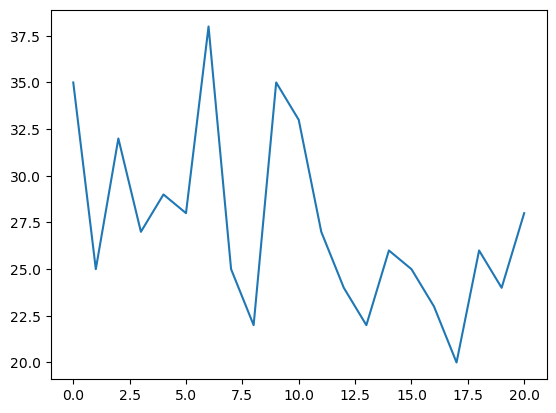

In [33]:
plt.plot(windstorms_upper_speed_threshold)

In [2280]:
height='10m'
subset = ['Year', 'DOY', 'MST', f'Avg Wind Speed @ {height} [m/s]', f'Avg Wind Direction @ {height} [deg]', 'Temperature @ 2m [deg C]', 'Relative Humidity [%]']

for i in np.arange(2002,2023,1): 
    year = i
    df = pd.read_csv(f'/Users/serena/Documents/Research/Data/{year}_data.csv', usecols=lambda x: x in subset)
    df.insert(2, 'Date', df['DOY'].apply(doy_to_date, args=(year,))) 
    df = df.replace(-99999.0, np.nan)
    df['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%Y') # convert date column to DateTime
    df.set_index('Date')
    
    storms_with_lulls = [storm                                                       
                     for storm in                                                
                     WindstormWithLulls.storms_by_threshold(df, 4.5, 12*60, [240, 330])
                     if storm.duration >= 30 and np.median(storm.speed) >= 4.5 and np.mean(storm.speed) >= 4.5] 
    
    storm_durations = [storm.duration for storm in storms_with_lulls]   
    storm_speeds = [np.mean(storm.speed) for storm in storms_with_lulls]   
                
    windstorms_lower_dur_threshold[int(year)-2002] = len(storms_with_lulls)
    storm_durations_mean_ld[int(year)-2002] = np.mean(storm_durations)/60      # hours
    storm_durations_median_ld[int(year)-2002] = np.median(storm_durations)/60  # hours
    storm_speeds_mean_ld[int(year)-2002] = np.mean(storm_speeds)
    storm_speeds_median_ld[int(year)-2002] = np.median(storm_speeds)

    print(f'Total windstorms in {year}: {len(storms_with_lulls)}')

Total windstorms in 2002: 84
Total windstorms in 2003: 54
Total windstorms in 2004: 62
Total windstorms in 2005: 50
Total windstorms in 2006: 59
Total windstorms in 2007: 61
Total windstorms in 2008: 70
Total windstorms in 2009: 57
Total windstorms in 2010: 57
Total windstorms in 2011: 69
Total windstorms in 2012: 67
Total windstorms in 2013: 62
Total windstorms in 2014: 52
Total windstorms in 2015: 47
Total windstorms in 2016: 69
Total windstorms in 2017: 51
Total windstorms in 2018: 50
Total windstorms in 2019: 68
Total windstorms in 2020: 51
Total windstorms in 2021: 56
Total windstorms in 2022: 57


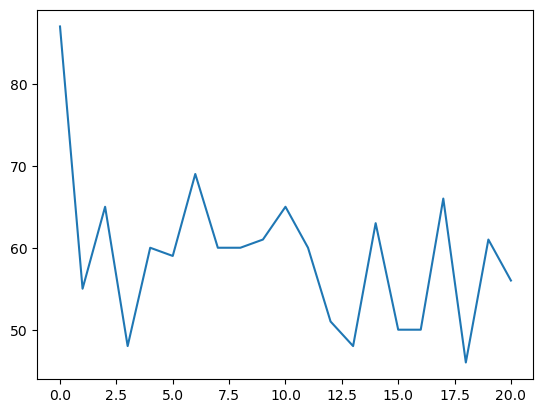

In [36]:
plt.plot(windstorms_lower_dur_threshold)

In [2281]:
height='10m'
subset = ['Year', 'DOY', 'MST', f'Avg Wind Speed @ {height} [m/s]', f'Avg Wind Direction @ {height} [deg]', 'Temperature @ 2m [deg C]', 'Relative Humidity [%]']

for i in np.arange(2002,2023,1): 
    year = i
    df = pd.read_csv(f'/Users/serena/Documents/Research/Data/{year}_data.csv', usecols=lambda x: x in subset)
    df.insert(2, 'Date', df['DOY'].apply(doy_to_date, args=(year,))) 
    df = df.replace(-99999.0, np.nan)
    df['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%Y') # convert date column to DateTime
    df.set_index('Date')
    
    storms_with_lulls = [storm                                                       
                     for storm in                                                
                     WindstormWithLulls.storms_by_threshold(df, 4.5, 12*60, [240, 330])
                     if storm.duration >= 90 and np.median(storm.speed) >= 4.5 and np.mean(storm.speed) >= 4.5] 
    
    storm_durations = [storm.duration for storm in storms_with_lulls]   
    storm_speeds = [np.mean(storm.speed) for storm in storms_with_lulls]   
                
    windstorms_upper_dur_threshold[int(year)-2002] = len(storms_with_lulls)
    storm_durations_mean_ud[int(year)-2002] = np.mean(storm_durations)/60      # hours
    storm_durations_median_ud[int(year)-2002] = np.median(storm_durations)/60  # hours
    storm_speeds_mean_ud[int(year)-2002] = np.mean(storm_speeds)
    storm_speeds_median_ud[int(year)-2002] = np.median(storm_speeds)

    print(f'Total windstorms in {year}: {len(storms_with_lulls)}')

Total windstorms in 2002: 76
Total windstorms in 2003: 51
Total windstorms in 2004: 55
Total windstorms in 2005: 44
Total windstorms in 2006: 52
Total windstorms in 2007: 50
Total windstorms in 2008: 66
Total windstorms in 2009: 50
Total windstorms in 2010: 48
Total windstorms in 2011: 58
Total windstorms in 2012: 65
Total windstorms in 2013: 58
Total windstorms in 2014: 51
Total windstorms in 2015: 43
Total windstorms in 2016: 62
Total windstorms in 2017: 46
Total windstorms in 2018: 45
Total windstorms in 2019: 59
Total windstorms in 2020: 49
Total windstorms in 2021: 50
Total windstorms in 2022: 52


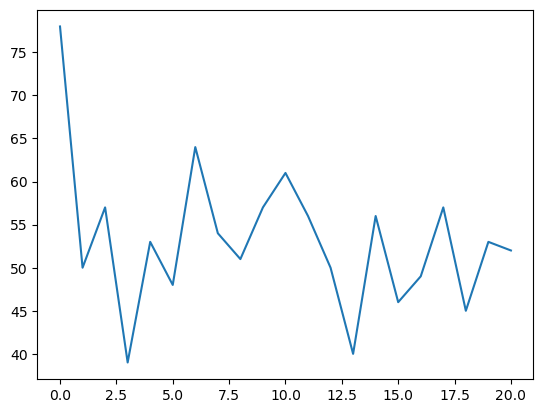

In [38]:
plt.plot(windstorms_upper_dur_threshold)

In [2282]:
height='10m'
subset = ['Year', 'DOY', 'MST', f'Avg Wind Speed @ {height} [m/s]', f'Avg Wind Direction @ {height} [deg]', 'Temperature @ 2m [deg C]', 'Relative Humidity [%]']

for i in np.arange(2002,2023,1): 
    year = i
    df = pd.read_csv(f'/Users/serena/Documents/Research/Data/{year}_data.csv', usecols=lambda x: x in subset)
    df.insert(2, 'Date', df['DOY'].apply(doy_to_date, args=(year,))) 
    df = df.replace(-99999.0, np.nan)
    df['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%Y') # convert date column to DateTime
    df.set_index('Date')
    
    storms_with_lulls = [storm                                                       
                     for storm in                                                
                     WindstormWithLulls.storms_by_threshold(df, 4.5, 6*60, [240, 330])
                     if storm.duration >= 60 and np.median(storm.speed) >= 4.5 and np.mean(storm.speed) >= 4.5] 
    
    storm_durations = [storm.duration for storm in storms_with_lulls]   
    storm_speeds = [np.mean(storm.speed) for storm in storms_with_lulls]   
                
    windstorms_lower_lull_threshold[int(year)-2002] = len(storms_with_lulls)
    storm_durations_mean_ll[int(year)-2002] = np.mean(storm_durations)/60      # hours
    storm_durations_median_ll[int(year)-2002] = np.median(storm_durations)/60  # hours
    storm_speeds_mean_ll[int(year)-2002] = np.mean(storm_speeds)
    storm_speeds_median_ll[int(year)-2002] = np.median(storm_speeds)

    print(f'Total windstorms in {year}: {len(storms_with_lulls)}')

Total windstorms in 2002: 107
Total windstorms in 2003: 91
Total windstorms in 2004: 91
Total windstorms in 2005: 95
Total windstorms in 2006: 94
Total windstorms in 2007: 107
Total windstorms in 2008: 111
Total windstorms in 2009: 86
Total windstorms in 2010: 84
Total windstorms in 2011: 118
Total windstorms in 2012: 113
Total windstorms in 2013: 101
Total windstorms in 2014: 87
Total windstorms in 2015: 81
Total windstorms in 2016: 99
Total windstorms in 2017: 94
Total windstorms in 2018: 95
Total windstorms in 2019: 93
Total windstorms in 2020: 100
Total windstorms in 2021: 85
Total windstorms in 2022: 93


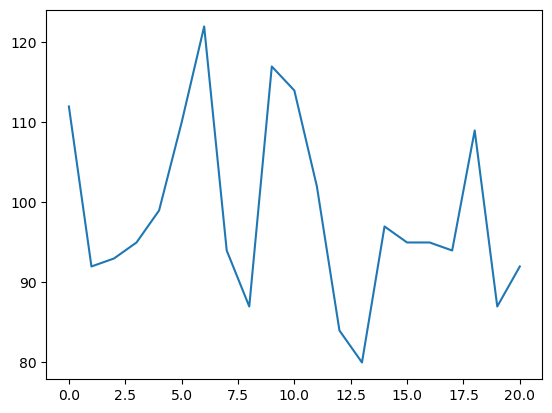

In [40]:
plt.plot(windstorms_lower_lull_threshold)

In [2283]:
height='10m'
subset = ['Year', 'DOY', 'MST', f'Avg Wind Speed @ {height} [m/s]', f'Avg Wind Direction @ {height} [deg]', 'Temperature @ 2m [deg C]', 'Relative Humidity [%]']

for i in np.arange(2002,2023,1): 
    year = i
    df = pd.read_csv(f'/Users/serena/Documents/Research/Data/{year}_data.csv', usecols=lambda x: x in subset)
    df.insert(2, 'Date', df['DOY'].apply(doy_to_date, args=(year,))) 
    df = df.replace(-99999.0, np.nan)
    df['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%Y') # convert date column to DateTime
    df.set_index('Date')
    
    storms_with_lulls = [storm                                                       
                     for storm in                                                
                     WindstormWithLulls.storms_by_threshold(df, 4.5, 18*60, [240, 330])
                     if storm.duration >= 60 and np.median(storm.speed) >= 4.5 and np.mean(storm.speed) >= 4.5] 
    
    storm_durations = [storm.duration for storm in storms_with_lulls]   
    storm_speeds = [np.mean(storm.speed) for storm in storms_with_lulls]   
                
    windstorms_upper_lull_threshold[int(year)-2002] = len(storms_with_lulls)
    storm_durations_mean_ul[int(year)-2002] = np.mean(storm_durations)/60      # hours
    storm_durations_median_ul[int(year)-2002] = np.median(storm_durations)/60  # hours
    storm_speeds_mean_ul[int(year)-2002] = np.mean(storm_speeds)
    storm_speeds_median_ul[int(year)-2002] = np.median(storm_speeds)

    print(f'Total windstorms in {year}: {len(storms_with_lulls)}')

Total windstorms in 2002: 54
Total windstorms in 2003: 41
Total windstorms in 2004: 38
Total windstorms in 2005: 29
Total windstorms in 2006: 38
Total windstorms in 2007: 33
Total windstorms in 2008: 46
Total windstorms in 2009: 37
Total windstorms in 2010: 34
Total windstorms in 2011: 41
Total windstorms in 2012: 33
Total windstorms in 2013: 36
Total windstorms in 2014: 29
Total windstorms in 2015: 33
Total windstorms in 2016: 33
Total windstorms in 2017: 22
Total windstorms in 2018: 29
Total windstorms in 2019: 32
Total windstorms in 2020: 30
Total windstorms in 2021: 28
Total windstorms in 2022: 35


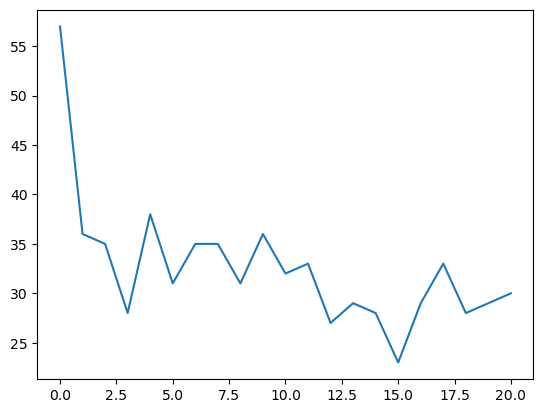

In [42]:
plt.plot(windstorms_upper_lull_threshold)

In [2284]:
import scipy.stats
scipy.stats.spearmanr(windstorms_lower_speed_threshold, windstorms_1min) 

PearsonRResult(statistic=0.24783607274790967, pvalue=0.27872190288787524)

In [2285]:
scipy.stats.spearmanr(windstorms_upper_speed_threshold, windstorms_1min) 

SignificanceResult(statistic=0.5500992934638671, pvalue=0.009775266306204719)

In [783]:
scipy.stats.kendalltau(years, windstorms_1min) 

KendalltauResult(correlation=-0.16507966730711343, pvalue=0.3024975133776905)

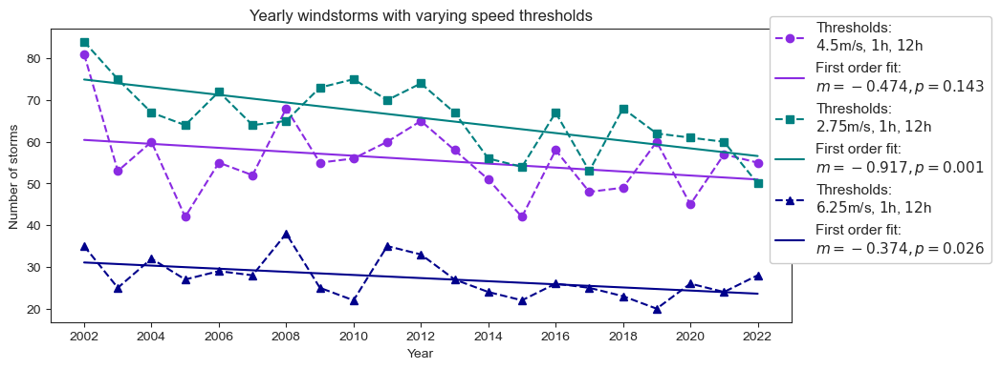

In [582]:
plt.figure(figsize=(10,4))

y = windstorms_1min
x = np.arange(len(y))
x = sm.add_constant(x)
mod = sm.OLS(y, x)
result = mod.fit()
plt.plot(years, windstorms_1min,'o--', color='blueviolet', label=f'Thresholds:\n$4.5$m/s, $1$h, $12$h')
trend = np.polyfit(years,windstorms_1min, 1)
trendpoly = np.poly1d(trend) 
plt.plot(years,trendpoly(years), color='blueviolet',label=f'First order fit: \n$m={np.round(trend[0],3)}, p={np.round(result.pvalues[1],3)}$')

y = windstorms_lower_speed_threshold
x = np.arange(len(y))
x = sm.add_constant(x)
mod = sm.OLS(y, x)
result = mod.fit()
plt.plot(years, windstorms_lower_speed_threshold,'s--', color='teal', label='Thresholds:\n$2.75$m/s, $1$h, $12$h')
trend = np.polyfit(years,windstorms_lower_speed_threshold, 1)
trendpoly = np.poly1d(trend) 
plt.plot(years,trendpoly(years), color='teal', label=f'First order fit: \n$m={np.round(trend[0],3)}, p={np.round(result.pvalues[1],3)}$')

y = windstorms_upper_speed_threshold
x = np.arange(len(y))
x = sm.add_constant(x)
mod = sm.OLS(y, x)
result = mod.fit()
plt.plot(years, windstorms_upper_speed_threshold,'^--', color='darkblue', label='Thresholds:\n$6.25$m/s, $1$h, $12$h')
trend = np.polyfit(years,windstorms_upper_speed_threshold, 1)
trendpoly = np.poly1d(trend) 
plt.plot(years,trendpoly(years), color='darkblue', label=f'First order fit: \n$m={np.round(trend[0],3)}, p={np.round(result.pvalues[1],3)}$')

plt.xlabel(f"Year")
plt.ylabel("Number of storms")
plt.xticks(years[::2])
plt.legend(prop={'size': 11},loc=(0.97, 0.20),fancybox=True, framealpha=1) 
plt.title(f"Yearly windstorms with varying speed thresholds")
plt.savefig(f'sens_windstorms_speed.pdf',bbox_inches='tight')
plt.show()

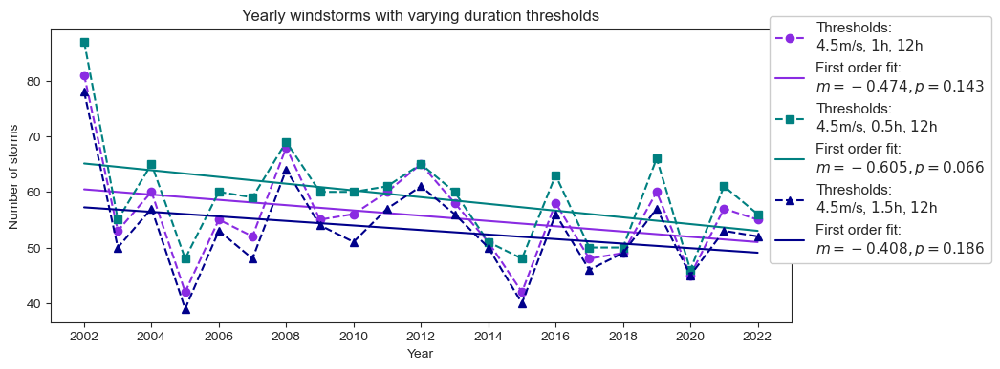

In [583]:
plt.figure(figsize=(10,4))

y = windstorms_1min
x = np.arange(len(y))
x = sm.add_constant(x)
mod = sm.OLS(y, x)
result = mod.fit()
plt.plot(years, windstorms_1min,'o--', color='blueviolet', label=f'Thresholds:\n$4.5$m/s, $1$h, $12$h')
trend = np.polyfit(years,windstorms_1min, 1)
trendpoly = np.poly1d(trend) 
plt.plot(years,trendpoly(years), color='blueviolet',label=f'First order fit: \n$m={np.round(trend[0],3)}, p={np.round(result.pvalues[1],3)}$')

y = windstorms_lower_dur_threshold
x = np.arange(len(y))
x = sm.add_constant(x)
mod = sm.OLS(y, x)
result = mod.fit()
plt.plot(years, windstorms_lower_dur_threshold,'s--', color='teal', label='Thresholds:\n$4.5$m/s, $0.5$h, $12$h')
trend = np.polyfit(years,windstorms_lower_dur_threshold, 1)
trendpoly = np.poly1d(trend) 
plt.plot(years,trendpoly(years), color='teal', label=f'First order fit: \n$m={np.round(trend[0],3)}, p={np.round(result.pvalues[1],3)}$')

y = windstorms_upper_dur_threshold
x = np.arange(len(y))
x = sm.add_constant(x)
mod = sm.OLS(y, x)
result = mod.fit()
plt.plot(years, windstorms_upper_dur_threshold,'^--', color='darkblue', label='Thresholds:\n$4.5$m/s, $1.5$h, $12$h')
trend = np.polyfit(years,windstorms_upper_dur_threshold, 1)
trendpoly = np.poly1d(trend) 
plt.plot(years,trendpoly(years), color='darkblue', label=f'First order fit: \n$m={np.round(trend[0],3)}, p={np.round(result.pvalues[1],3)}$')

plt.xlabel(f"Year")
plt.ylabel("Number of storms")
plt.xticks(years[::2])
plt.legend(prop={'size': 11},loc=(0.97, 0.20),fancybox=True, framealpha=1) 
plt.title(f"Yearly windstorms with varying duration thresholds")
plt.savefig(f'sens_windstorms_duration.pdf',bbox_inches='tight')
plt.show()

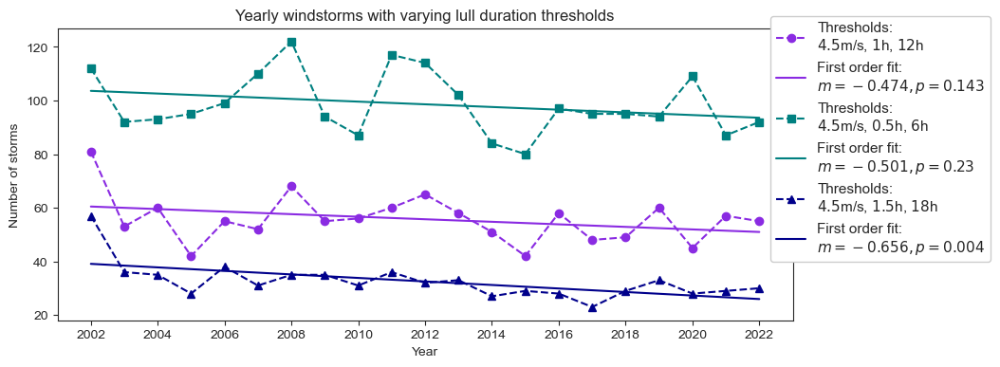

In [584]:
plt.figure(figsize=(10,4))

y = windstorms_1min
x = np.arange(len(y))
x = sm.add_constant(x)
mod = sm.OLS(y, x)
result = mod.fit()
plt.plot(years, windstorms_1min,'o--', color='blueviolet', label=f'Thresholds:\n$4.5$m/s, $1$h, $12$h')
trend = np.polyfit(years,windstorms_1min, 1)
trendpoly = np.poly1d(trend) 
plt.plot(years,trendpoly(years), color='blueviolet',label=f'First order fit: \n$m={np.round(trend[0],3)}, p={np.round(result.pvalues[1],3)}$')

y = windstorms_lower_lull_threshold
x = np.arange(len(y))
x = sm.add_constant(x)
mod = sm.OLS(y, x)
result = mod.fit()
plt.plot(years, windstorms_lower_lull_threshold,'s--', color='teal', label='Thresholds:\n$4.5$m/s, $0.5$h, $6$h')
trend = np.polyfit(years,windstorms_lower_lull_threshold, 1)
trendpoly = np.poly1d(trend) 
plt.plot(years,trendpoly(years), color='teal', label=f'First order fit: \n$m={np.round(trend[0],3)}, p={np.round(result.pvalues[1],3)}$')

y = windstorms_upper_lull_threshold
x = np.arange(len(y))
x = sm.add_constant(x)
mod = sm.OLS(y, x)
result = mod.fit()
plt.plot(years, windstorms_upper_lull_threshold,'^--', color='darkblue', label='Thresholds:\n$4.5$m/s, $1.5$h, $18$h')
trend = np.polyfit(years,windstorms_upper_lull_threshold, 1)
trendpoly = np.poly1d(trend) 
plt.plot(years,trendpoly(years), color='darkblue', label=f'First order fit: \n$m={np.round(trend[0],3)}, p={np.round(result.pvalues[1],3)}$')

plt.xlabel(f"Year")
plt.ylabel("Number of storms")
plt.xticks(years[::2])
plt.legend(prop={'size': 11},loc=(0.97, 0.20),fancybox=True, framealpha=1) 
plt.title(f"Yearly windstorms with varying lull duration thresholds")
plt.savefig(f'sens_windstorms_lulldur.pdf',bbox_inches='tight')
plt.show()

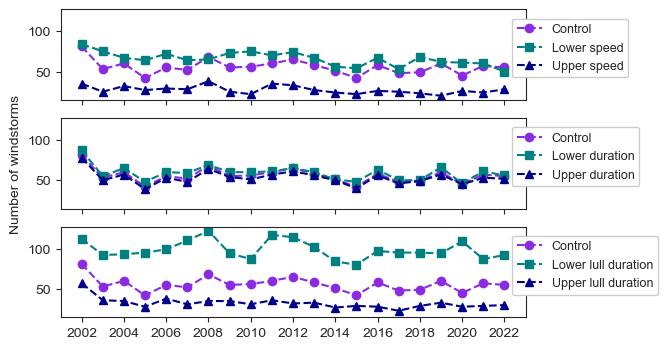

In [1016]:
fig, ax = plt.subplots(3, sharex=True, sharey=True, figsize=(6,4))

ax[0].plot(windstorms_1min, 'o--', color='blueviolet', label=f'Control')
ax[0].plot(windstorms_lower_speed_threshold,'s--', color='teal', label='Lower speed')
ax[0].plot(windstorms_upper_speed_threshold,'^--', color='darkblue', label='Upper speed')
ax[0].set_xticks(ticks = np.arange(0,22,2), labels = np.arange(2002,2023,2))
# ax[0].set_ylabel("Number of storms")
ax[0].tick_params(axis="y")
ax[0].legend(prop={'size': 9},loc=(0.97, 0.25),fancybox=True, framealpha=1) 

ax[1].plot(windstorms_1min, 'o--', color='blueviolet', label=f'Control')
ax[1].plot(windstorms_lower_dur_threshold,'s--', color='teal', label='Lower duration')
ax[1].plot(windstorms_upper_dur_threshold,'^--', color='darkblue', label='Upper duration')
ax[1].set_ylabel("Number of windstorms")
ax[1].tick_params(axis="y")
ax[1].legend(prop={'size': 9},loc=(0.97, 0.25),fancybox=True, framealpha=1) 

ax[2].plot(windstorms_1min, 'o--', color='blueviolet', label=f'Control')
ax[2].plot(windstorms_lower_lull_threshold,'s--', color='teal', label='Lower lull duration')
ax[2].plot(windstorms_upper_lull_threshold,'^--', color='darkblue', label='Upper lull duration')
# ax[2].set_ylabel("Number of storms")
ax[2].tick_params(axis="y")
ax[2].legend(prop={'size': 9},loc=(0.97, 0.25),fancybox=True, framealpha=1) 

# fig.suptitle("Sensitibity analysis")
fig.savefig('f_sensitivity_comparison.pdf',bbox_inches='tight')

## Annual windstorm trends and modeling

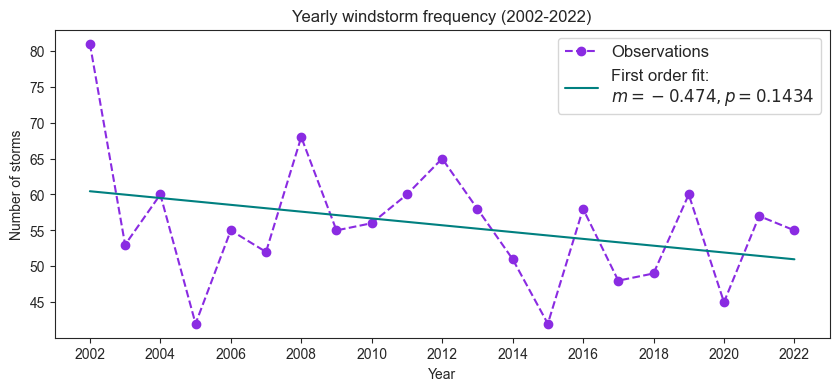

Slope of best fit: -0.47402597402593316


In [136]:
y = windstorms_1min
x = np.arange(len(y))
x = sm.add_constant(x)

mod = sm.GLS(y, x)
result = mod.fit()

plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(years, windstorms_1min,'o--', color='blueviolet', label='Observations')

trend = np.polyfit(years,windstorms_1min, 1)
trendpoly = np.poly1d(trend) 

plt.plot(years,trendpoly(years), color='teal',label=f'First order fit: \n$m={np.round(trend[0],4)}, p={np.round(result.pvalues[1],4)}$')
plt.xlabel(f"Year")
plt.ylabel("Number of storms")
plt.xticks(years[::2])
plt.legend(loc="best",prop={'size': 12}) 
plt.title(f"Yearly windstorm frequency (2002-2022)")
# plt.savefig(f'{height}_windstorms.pdf')
plt.show()
print(f'Slope of best fit: {trend[0]}')

In [159]:
x = years
y = windstorms_1min
mod = sm.GLS(y, sm.add_constant(x))
result = mod.fit()
gls_params = result.params
print(result.summary())

                            GLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.109
Model:                            GLS   Adj. R-squared:                  0.062
Method:                 Least Squares   F-statistic:                     2.329
Date:                Fri, 03 Mar 2023   Prob (F-statistic):              0.143
Time:                        18:18:15   Log-Likelihood:                -73.979
No. Observations:                  21   AIC:                             152.0
Df Residuals:                      19   BIC:                             154.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1009.4545    624.902      1.615      0.1

In [1654]:
x = years
y = windstorms_1min
mod = sm.OLS(y, sm.add_constant(x))
result = mod.fit()
ols_params = result.params
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.109
Model:                            OLS   Adj. R-squared:                  0.062
Method:                 Least Squares   F-statistic:                     2.329
Date:                Wed, 22 Mar 2023   Prob (F-statistic):              0.143
Time:                        01:15:06   Log-Likelihood:                -73.979
No. Observations:                  21   AIC:                             152.0
Df Residuals:                      19   BIC:                             154.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1009.4545    624.902      1.615      0.1

In [1655]:
from statsmodels.stats.diagnostic import het_white

#perform White's test
white_test = het_white(result.resid,  result.model.exog)

#define labels to use for output of White's test
labels = ['Test Statistic', 'Test Statistic p-value', 'F-Statistic', 'F-Test p-value']

#print results of White's test
print(dict(zip(labels, white_test)))

{'Test Statistic': 6.165177200507934, 'Test Statistic p-value': 0.04584044035590118, 'F-Statistic': 3.7402937368737037, 'F-Test p-value': 0.04380943125581337}


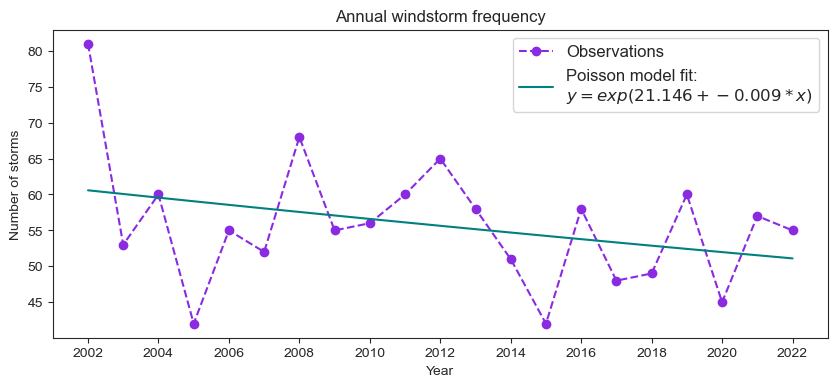

In [228]:
plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(years, windstorms_1min,'o--', color='blueviolet', label='Observations')

X = years
trendpoly = np.exp(results.params[1]*X+results.params[0])

plt.plot(years,trendpoly, color='teal',label=f'Poisson model fit: \n$y=exp(21.146 + -0.009 * x)$')
plt.xlabel(f"Year")
plt.ylabel("Number of storms")
plt.xticks(years[::2])
plt.legend(loc="best",prop={'size': 12}) 
plt.title(f"Annual windstorm frequency")
# plt.savefig(f'MFA_figures/{height}_windstorms.pdf')
plt.show()

In [2080]:
y = windstorms_1min
x = years

poisson_model = sm.GLM(y, sm.add_constant(x), family=sm.families.Poisson())

results = poisson_model.fit()

print(results.summary())

# extract model parameters
intercept = results.params[0]
slope = results.params[1]

# reshape x to be a two-dimensional numpy array with one column
x = x.reshape(-1, 1)

# get model equation
equation = f'y = exp({intercept:.3f} + {slope:.3f}x)'
print(equation)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                   21
Model:                            GLM   Df Residuals:                       19
Model Family:                 Poisson   Df Model:                            1
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -73.674
Date:                Sat, 01 Apr 2023   Deviance:                       24.507
Time:                        17:06:21   Pearson chi2:                     24.5
No. Iterations:                     4   Pseudo R-squ. (CS):             0.1375
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         21.1465      9.720      2.175      0.0

In [2081]:
y = adj_windstorms_1min
x = adj_years

adj_poisson_model = sm.GLM(y, sm.add_constant(x), family=sm.families.Poisson())

adj_results = adj_poisson_model.fit()

print(adj_results.summary())

# extract model parameters
adj_intercept = adj_results.params[0]
adj_slope = adj_results.params[1]

# reshape x to be a two-dimensional numpy array with one column
x = x.reshape(-1, 1)

# get model equation
adj_equation = f'y = exp({adj_intercept:.3f} + {adj_slope:.3f}x)'
print(adj_equation)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                   20
Model:                            GLM   Df Residuals:                       18
Model Family:                 Poisson   Df Model:                            1
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -66.658
Date:                Sat, 01 Apr 2023   Deviance:                       16.710
Time:                        17:06:24   Pearson chi2:                     16.5
No. Iterations:                     3   Pseudo R-squ. (CS):            0.01358
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.5276     10.576      0.901      0.3

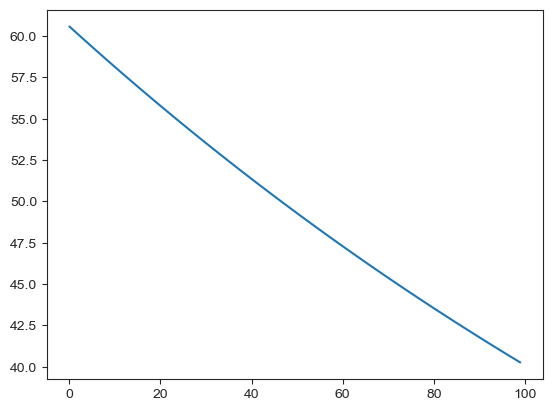

In [126]:
X = np.linspace(2002,2050,100)
trendpoly = np.exp(results.params[1]*X+results.params[0])

plt.plot(trendpoly)

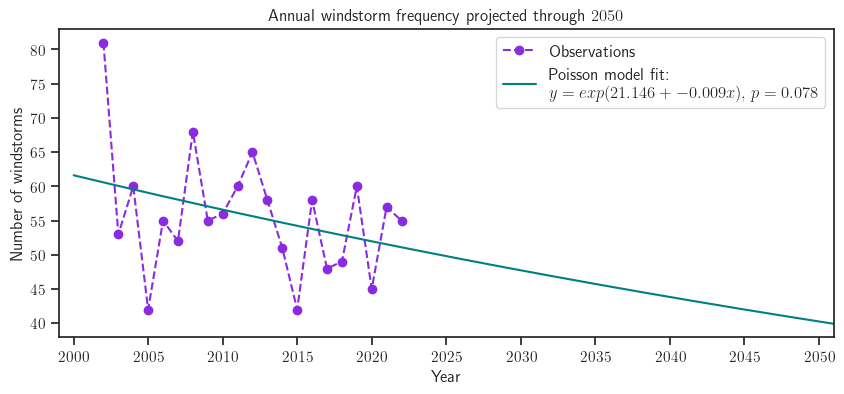

In [2135]:
plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(years, windstorms_1min,'o--', color='blueviolet', label='Observations')

X = np.linspace(2000,2060,300)
trendpoly = np.exp(slope*X+intercept)

plt.plot(X,trendpoly, color='teal',label=f'Poisson model fit: \n${equation}, \, p={np.round(results.pvalues[1],3)}$')
plt.xlabel(f"Year")
plt.ylabel("Number of windstorms")
plt.xticks(X[::25].astype(int)[0:-1])
plt.ylim(38,83)
plt.xlim(1999,2051)
plt.legend(loc="best",prop={'size': 12}) 
plt.title(r"Annual windstorm frequency projected through $2050$")
plt.savefig(f'poisson_proj.pdf',bbox_inches='tight')
plt.show()

In [180]:
np.var(windstorms_1min)

75.44217687074831

In [181]:
np.mean(windstorms_1min)

55.714285714285715

In [165]:
windstorms_1min

array([81., 53., 60., 42., 55., 52., 68., 55., 56., 60., 65., 58., 51.,
       42., 58., 48., 49., 60., 45., 57., 55.])

In [2076]:
adj_windstorms_1min = np.delete(windstorms_1min, 0)
adj_windstorms_1min

array([53., 60., 42., 55., 52., 68., 55., 56., 60., 65., 58., 51., 42.,
       58., 48., 49., 60., 45., 57., 55.])

In [2074]:
adj_years = np.delete(years, 0)
adj_years

array([2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013,
       2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022])

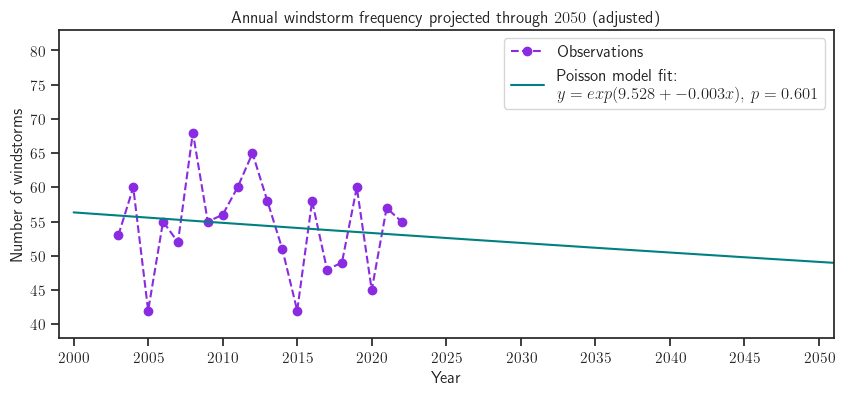

In [2138]:
plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(adj_years, adj_windstorms_1min,'o--', color='blueviolet', label='Observations')

# X = np.linspace(2000,2050,500)
X = np.linspace(2000,2060,300)
trendpoly = np.exp(adj_slope*X+adj_intercept)

plt.plot(X,trendpoly, color='teal',label=f'Poisson model fit: \n${adj_equation}, \, p={np.round(adj_results.pvalues[1],3)}$')
plt.xlabel(f"Year")
plt.ylabel("Number of windstorms")
# plt.xticks((X[::50]).astype(int))
# plt.ylim(38,75)
plt.ylim(38,83)
plt.xticks(X[::25].astype(int)[0:-1])
plt.xlim(1999,2051)
plt.legend(loc="best",prop={'size': 12}) 
plt.title(r"Annual windstorm frequency projected through $2050$ (adjusted)")
plt.savefig(f'poisson_proj_adj.pdf',bbox_inches='tight')
plt.show()

In [213]:
np.var(adj_windstorms_1min)

45.647499999999994

In [214]:
np.mean(adj_windstorms_1min)

54.45

In [91]:
y = windstorms_1min
x = np.arange(len(y))
x = sm.add_constant(x)

# fit the OLS model
model = sm.OLS(y, x).fit()

# print the model summary (optional)
print(model.summary())

# extract the coefficients
params = model.params

params

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.109
Model:                            OLS   Adj. R-squared:                  0.062
Method:                 Least Squares   F-statistic:                     2.329
Date:                Fri, 24 Feb 2023   Prob (F-statistic):              0.143
Time:                        20:31:25   Log-Likelihood:                -73.979
No. Observations:                  21   AIC:                             152.0
Df Residuals:                      19   BIC:                             154.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         60.4545      3.631     16.650      0.0

array([60.45454545, -0.47402597])

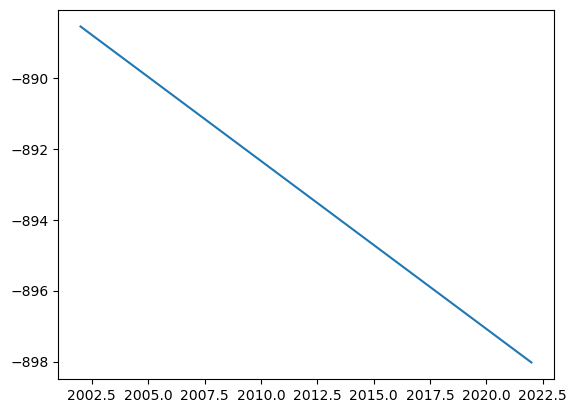

In [99]:
x = np.linspace(2002,2022,210)
y = params[1]*x+params[0]
plt.plot(x,y)

In [100]:
# y = windstorms_1min
# x = np.arange(len(y))
# x = sm.add_constant(x)

# mod = sm.GLS(y, x)
# result = mod.fit()
# print(result.summary())

y = windstorms_1min
x = np.arange(len(y))
x = sm.add_constant(x)

# fit the GLS model
model = sm.GLS(y, x).fit()

# print the model summary (optional)
print(model.summary())

# extract the coefficients
params = model.params

params

                            GLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.109
Model:                            GLS   Adj. R-squared:                  0.062
Method:                 Least Squares   F-statistic:                     2.329
Date:                Fri, 24 Feb 2023   Prob (F-statistic):              0.143
Time:                        20:35:52   Log-Likelihood:                -73.979
No. Observations:                  21   AIC:                             152.0
Df Residuals:                      19   BIC:                             154.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         60.4545      3.631     16.650      0.0

array([60.45454545, -0.47402597])

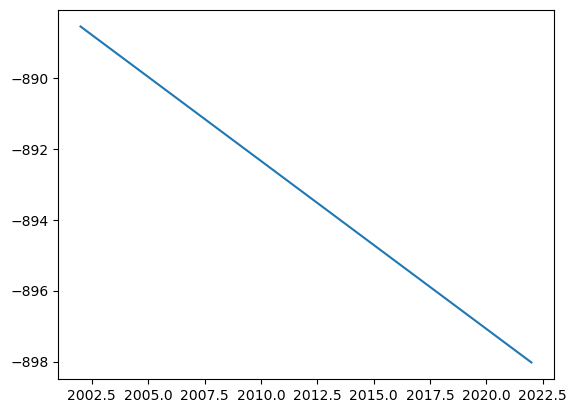

In [101]:
x = np.linspace(2002,2022,210)
y = params[1]*x+params[0]
plt.plot(x,y)

In [1139]:
results.pearson_chi2 / results.df_resid

1.2903946423911297

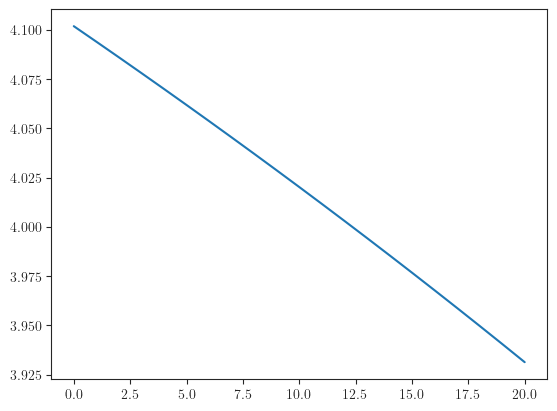

In [1146]:
plt.plot(np.log(trendpoly2))

In [194]:
y = adj_windstorms_1min
x = adj_years
x = sm.add_constant(x)

poisson_model = sm.GLM(y, x, family=sm.families.Poisson())

results = poisson_model.fit()

print(results.summary())

# extract model parameters
adj_intercept = results.params[0]
adj_slope = results.params[1]

# reshape x to be a two-dimensional numpy array with one column
x = x.reshape(-1, 1)

# get model equation
adj_equation = f'y = exp({adj_intercept:.3f} + {adj_slope:.3f} * x)'
print(adj_equation)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                   20
Model:                            GLM   Df Residuals:                       18
Model Family:                 Poisson   Df Model:                            1
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -66.658
Date:                Fri, 24 Feb 2023   Deviance:                       16.710
Time:                        21:20:56   Pearson chi2:                     16.5
No. Iterations:                     3   Pseudo R-squ. (CS):            0.01358
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.5276     10.576      0.901      0.3

In [1603]:
y = windstorms_1min
x = years

# Fit the Negative Binomial Regression model
nb_model = sm.GLM(y, sm.add_constant(x), family=sm.families.NegativeBinomial())
nb_results = nb_model.fit()

# Extract the model parameters
nb_params = nb_results.params

# Print the model equation
print("y = exp({:.3f} + {:.3f}*x)".format(nb_params[0], nb_params[1]))

# Print the summary of the model
print(nb_results.summary())

y = exp(20.781 + -0.008*x)
                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                   21
Model:                            GLM   Df Residuals:                       19
Model Family:        NegativeBinomial   Df Model:                            1
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -105.59
Date:                Tue, 21 Mar 2023   Deviance:                      0.42563
Time:                        23:52:34   Pearson chi2:                    0.421
No. Iterations:                     4   Pseudo R-squ. (CS):           0.002550
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         20.7814    

In [1607]:
np.round(nb_params[1],3)

-0.008

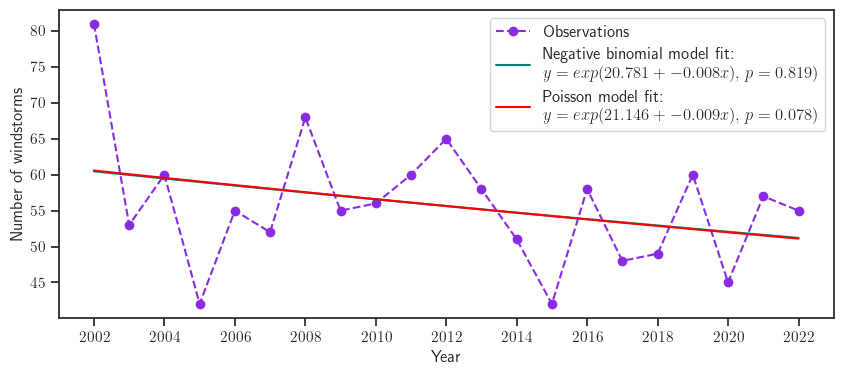

In [1617]:
y = windstorms_1min
x = years

nb_model = sm.GLM(y, sm.add_constant(x), family=sm.families.NegativeBinomial())
nb_results = nb_model.fit()
nb_params = nb_results.params

poisson_model = sm.GLM(y, sm.add_constant(x), family=sm.families.Poisson())
poisson_results = poisson_model.fit()
poisson_params = poisson_results.params

plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(years, windstorms_1min,'o--', color='blueviolet', label='Observations')

X = years
trendpoly = np.exp(nb_params[1]*X+nb_params[0])
trendpoly2 = np.exp(poisson_params[1]*X+poisson_params[0])

plt.plot(years,trendpoly,color='teal',label=f'Negative binomial model fit: \n$y = exp({np.round(nb_params[0],3)} + {np.round(nb_params[1],3)}x), \, p={np.round(nb_results.pvalues[1],3)})$')
plt.plot(years,trendpoly2,color='red',label=f'Poisson model fit: \n$y=exp({np.round(poisson_params[0],3)} + {np.round(poisson_params[1],3)}x), \, p={np.round(poisson_results.pvalues[1],3)})$')
plt.xlabel(f"Year")
plt.ylabel("Number of windstorms")
plt.xticks(years[::2])
plt.legend(loc="best",prop={'size': 12}) 
# plt.title(f"Annual windstorm frequency")
plt.savefig(f'windstorms_GLM_fits.pdf',bbox_inches='tight')
plt.show()

In [1144]:
x = years
y = windstorms_1min

gls_model = sm.GLS(y, sm.add_constant(x))
gls_results = gls_model.fit()
gls_params = gls_results.params
print(gls_results.summary())

nb_model = sm.GLM(y, sm.add_constant(x), family=sm.families.NegativeBinomial())
nb_results = nb_model.fit()
nb_params = nb_results.params
print(nb_results.summary())

                            GLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.109
Model:                            GLS   Adj. R-squared:                  0.062
Method:                 Least Squares   F-statistic:                     2.329
Date:                Tue, 21 Mar 2023   Prob (F-statistic):              0.143
Time:                        11:42:05   Log-Likelihood:                -73.979
No. Observations:                  21   AIC:                             152.0
Df Residuals:                      19   BIC:                             154.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1009.4545    624.902      1.615      0.1

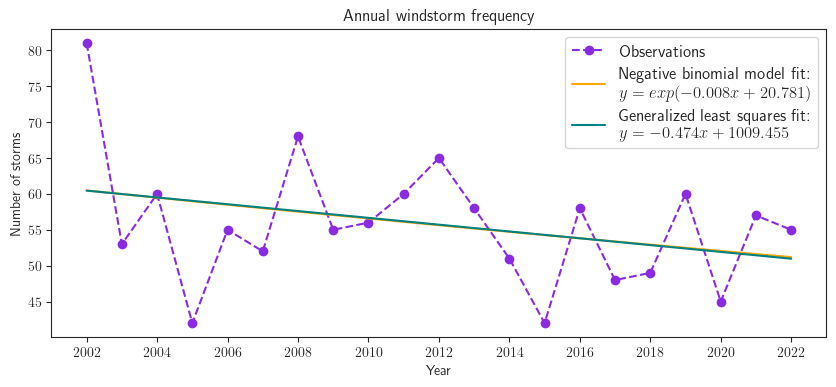

In [1145]:
plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(years, windstorms_1min,'o--', color='blueviolet', label='Observations')

X = years
trendpoly = np.exp(nb_params[1]*X+nb_params[0])
trendpoly2 = gls_params[0]+X*gls_params[1]

plt.plot(years,trendpoly,'-',color='orange',label=f'Negative binomial model fit: \n$y = exp({np.round(nb_params[1],3)}x +{np.round(nb_params[0],3)})$')
plt.plot(years,trendpoly2,'-',color='teal',label=f'Generalized least squares fit: \n$y = {np.round(gls_params[1],3)}x +{np.round(gls_params[0],3)}$')
plt.xlabel(f"Year")
plt.ylabel("Number of storms")
plt.xticks(years[::2])
plt.legend(loc="best",prop={'size': 12}) 
plt.title(f"Annual windstorm frequency")
# plt.savefig(f'{height}_windstorms_new.pdf')
plt.show()

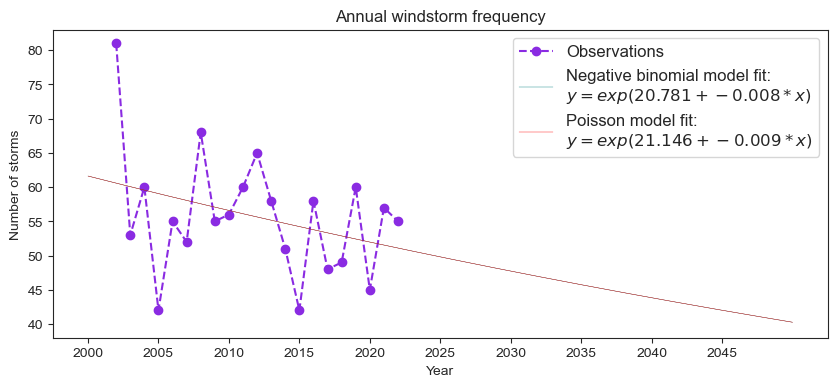

In [243]:
plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(years, windstorms_1min,'o--', color='blueviolet', label='Observations')

X = np.linspace(2000,2050,500)
trendpoly = np.exp(slope*X+intercept)
trendpoly2 = np.exp(results.params[1]*X+results.params[0])

plt.plot(X,trendpoly,linewidth=0.3,color='teal',label=f'Negative binomial model fit: \n$y = exp(20.781 + -0.008*x)$')
plt.plot(X,trendpoly2,linewidth=0.3,color='red',label=f'Poisson model fit: \n$y=exp(21.146 + -0.009 * x)$')
plt.xlabel(f"Year")
plt.ylabel("Number of storms")
plt.xticks((X[::50]).astype(int))
plt.ylim(38,83)
plt.legend(loc="best",prop={'size': 12}) 
plt.title(f"Annual windstorm frequency")
# plt.savefig(f'MFA_figures/{height}_windstorms_pois1.pdf')
plt.show()

In [ ]:
plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(adj_years, adj_windstorms_1min,'o--', color='blueviolet', label='Observations')

X = np.linspace(2000,2050,500)
trendpoly = np.exp(adj_slope*X+adj_intercept)
trendpoly2 = np.exp(results.params[1]*X+results.params[0])

plt.plot(X,trendpoly, color='teal',label=f'Poisson model fit: \n${adj_equation}$')
plt.plot(X,trendpoly2,color='red',label=f'Poisson model fit: \n$y=exp(21.146 + -0.009 * x)$')
plt.xlabel(f"Year")
plt.ylabel("Number of storms")
plt.xticks((X[::50]).astype(int))
plt.ylim(38,75)
plt.legend(loc="best",prop={'size': 12}) 
plt.title(f"Adjusted annual windstorm frequency")
plt.savefig(f'MFA_figures/{height}_windstorms_pois2.pdf')
plt.show()

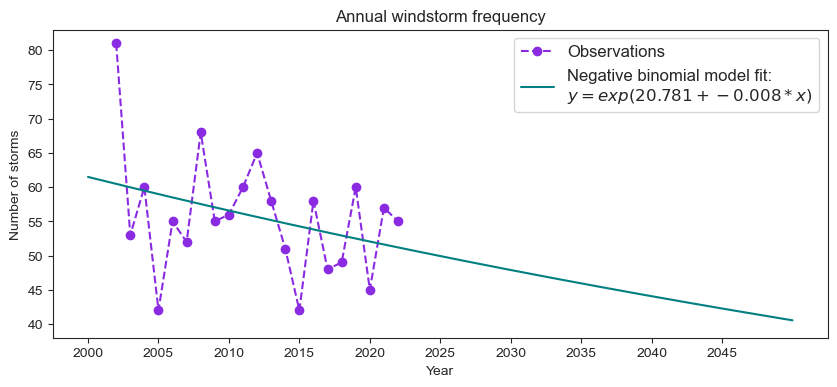

In [253]:
plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(years, windstorms_1min,'o--', color='blueviolet', label='Observations')

X = np.linspace(2000,2050,500)
trendpoly = np.exp(nb_params[1]*X+nb_params[0])

plt.plot(X,trendpoly, color='teal',label=f'Negative binomial model fit: \n$y = exp(20.781 + -0.008*x)$')
plt.xlabel(f"Year")
plt.ylabel("Number of storms")
plt.xticks((X[::50]).astype(int))
plt.ylim(38,83)
plt.legend(loc="best",prop={'size': 12}) 
plt.title(f"Annual windstorm frequency")
plt.savefig(f'MFA_figures/{height}_windstorms_bin1.pdf')
plt.show()

In [249]:
y = adj_windstorms_1min
x = adj_years

# Fit the Negative Binomial Regression model
adj_nb_model = sm.GLM(y, sm.add_constant(x), family=sm.families.NegativeBinomial())
adj_nb_results = adj_nb_model.fit()

# Print the summary of the model
print(adj_nb_results.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                   20
Model:                            GLM   Df Residuals:                       18
Model Family:        NegativeBinomial   Df Model:                            1
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -100.13
Date:                Fri, 24 Feb 2023   Deviance:                      0.30721
Time:                        22:08:19   Pearson chi2:                    0.296
No. Iterations:                     3   Pseudo R-squ. (CS):          0.0002504
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.6145     78.755      0.122      0.9

In [250]:
# Extract the model parameters
adj_nb_params = adj_nb_results.params

# Print the model equation
print("y = exp({:.3f} + {:.3f}*x)".format(adj_nb_params[0], adj_nb_params[1]))

y = exp(9.615 + -0.003*x)


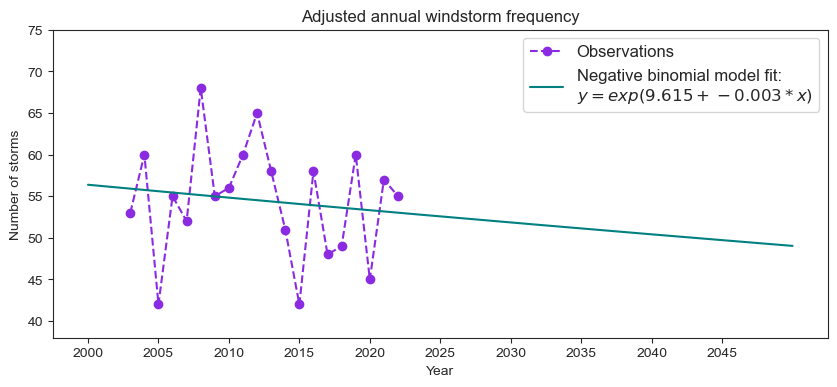

In [255]:
plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(adj_years, adj_windstorms_1min,'o--', color='blueviolet', label='Observations')

X = np.linspace(2000,2050,500)
trendpoly = np.exp(adj_nb_params[1]*X+adj_nb_params[0])

plt.plot(X,trendpoly, color='teal',label=f'Negative binomial model fit: \n$y = exp(9.615 + -0.003*x)$')
plt.xlabel(f"Year")
plt.ylabel("Number of storms")
plt.xticks((X[::50]).astype(int))
plt.ylim(38,75)
plt.legend(loc="best",prop={'size': 12}) 
plt.title(f"Adjusted annual windstorm frequency")
plt.savefig(f'MFA_figures/{height}_windstorms_bin2.pdf')
plt.show()

## Windstorm properties (yearly)

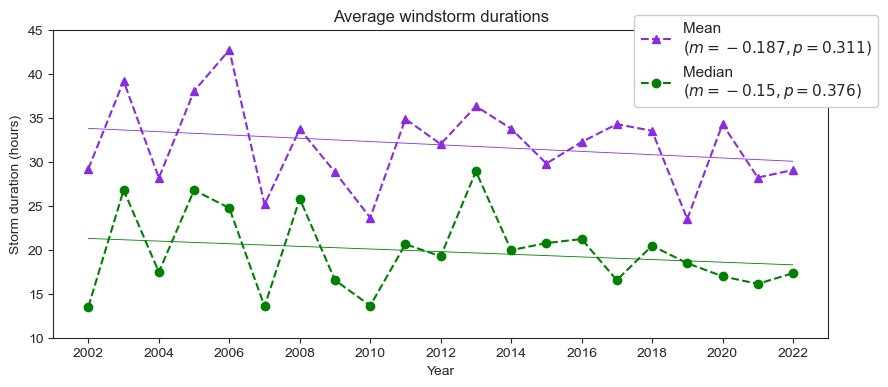

Slope of best fit (mean): -0.18676917246268548
Slope of best fit (median): -0.14992424242424834


In [273]:
y = storm_durations_mean
x = np.arange(len(y))
x = sm.add_constant(x)
mod = sm.GLS(y, x)
result = mod.fit()

y2 = storm_durations_median
x2 = np.arange(len(y2))
x2 = sm.add_constant(x2)
mod2 = sm.GLS(y2, x2)
result2 = mod2.fit()

plt.figure(figsize=(10,4))

trend = np.polyfit(years,storm_durations_mean, 1)
trendpoly = np.poly1d(trend) 
trend2 = np.polyfit(years,storm_durations_median, 1)
trendpoly2 = np.poly1d(trend2) 

plt.plot(years, storm_durations_mean,'^--', color='blueviolet', label=f'Mean \n$(m={np.round(trend[0],3)}, p={np.round(result.pvalues[1],3)})$')
plt.plot(years, storm_durations_median,'o--', color='green', label=f'Median \n$(m={np.round(trend2[0],3)}, p={np.round(result2.pvalues[1],3)})$')

plt.plot(years,trendpoly(years), linewidth=0.6, color='blueviolet')
plt.plot(years,trendpoly2(years), linewidth=0.6, color='green')

plt.xlabel(f"Year")
plt.ylabel("Storm duration (hours)")
plt.xticks(ticks=years[::2])
plt.yticks(ticks=plt.yticks()[0], labels=plt.yticks()[0].astype(int))
plt.legend(prop={'size': 11},loc=(.75, .75),fancybox=True, framealpha=1) 
plt.title(f"Average windstorm durations")
plt.savefig(f'windstorm_durations.pdf',bbox_inches='tight')
plt.show()
print(f'Slope of best fit (mean): {trend[0]}')
print(f'Slope of best fit (median): {trend2[0]}')

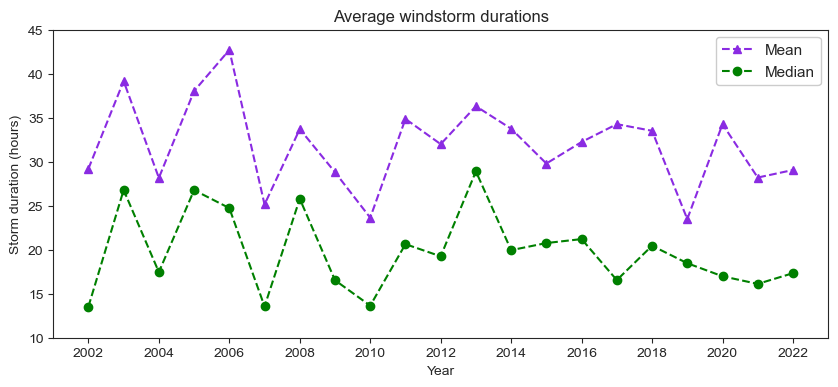

In [261]:
plt.figure(figsize=(10,4))

plt.plot(years, storm_durations_mean,'^--', color='blueviolet', label=f'Mean')
plt.plot(years, storm_durations_median,'o--', color='green', label=f'Median')

plt.xlabel(f"Year")
plt.ylabel("Storm duration (hours)")
plt.xticks(ticks=years[::2])
plt.yticks(ticks=plt.yticks()[0], labels=plt.yticks()[0].astype(int))
plt.legend(prop={'size': 11},loc='upper right',fancybox=True, framealpha=1) 
plt.title(f"Average windstorm durations")
plt.savefig(f'MFA_figures/windstorm_durations.pdf',bbox_inches='tight')
plt.show()

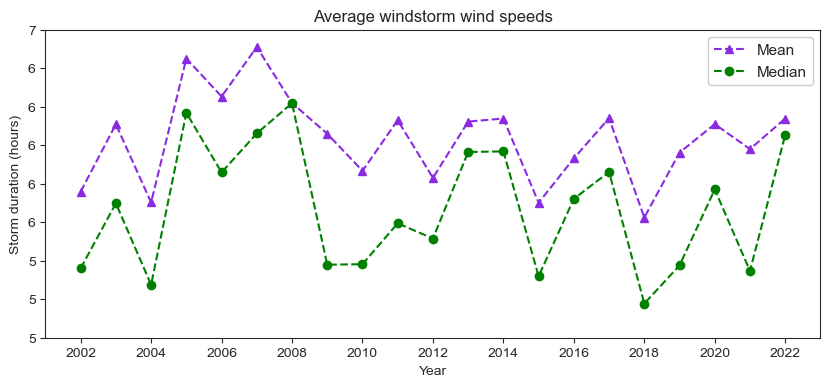

In [263]:
plt.figure(figsize=(10,4))

plt.plot(years, storm_speeds_mean,'^--', color='blueviolet', label=f'Mean')
plt.plot(years, storm_speeds_median,'o--', color='green', label=f'Median')

plt.xlabel(f"Year")
plt.ylabel("Storm duration (hours)")
plt.xticks(ticks=years[::2])
plt.yticks(ticks=plt.yticks()[0], labels=plt.yticks()[0].astype(int))
plt.legend(prop={'size': 11},loc='upper right',fancybox=True, framealpha=1) 
plt.title(f"Average windstorm wind speeds")
plt.savefig(f'MFA_figures/windstorm_speeds.pdf',bbox_inches='tight')
plt.show()

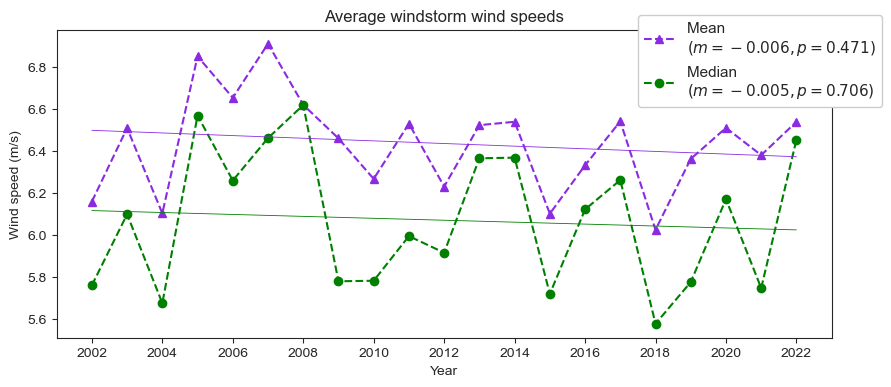

Slope of best fit (mean): -0.0062811008460911194
Slope of best fit (median): -0.004594645818772456


In [272]:
y = storm_speeds_mean
x = np.arange(len(y))
x = sm.add_constant(x)
mod = sm.GLS(y, x)
result = mod.fit()

y2 = storm_speeds_median
x2 = np.arange(len(y2))
x2 = sm.add_constant(x2)
mod2 = sm.GLS(y2, x2)
result2 = mod2.fit()

plt.figure(figsize=(10,4))

trend = np.polyfit(years,storm_speeds_mean, 1)
trendpoly = np.poly1d(trend) 
trend2 = np.polyfit(years,storm_speeds_median, 1)
trendpoly2 = np.poly1d(trend2) 

plt.plot(years, storm_speeds_mean,'^--', color='blueviolet', label=f'Mean \n$(m={np.round(trend[0],3)}, p={np.round(result.pvalues[1],3)})$')
plt.plot(years, storm_speeds_median,'o--', color='green', label=f'Median \n$(m={np.round(trend2[0],3)}, p={np.round(result2.pvalues[1],3)})$')

plt.plot(years,trendpoly(years), linewidth=0.6, color='blueviolet')
plt.plot(years,trendpoly2(years), linewidth=0.6, color='green')

# plt.plot(years,trendpoly(years), color='teal',label='First order fit')
plt.xlabel(f"Year")
plt.ylabel("Wind speed (m/s)")
plt.xticks(ticks=years[::2])
plt.legend(prop={'size': 11},loc=(.75, .75),fancybox=True, framealpha=1) 
plt.title(f"Average windstorm wind speeds")
plt.savefig(f'MFA_figures/windstorm_speeds.pdf',bbox_inches='tight')
plt.show()
print(f'Slope of best fit (mean): {trend[0]}')
print(f'Slope of best fit (median): {trend2[0]}')

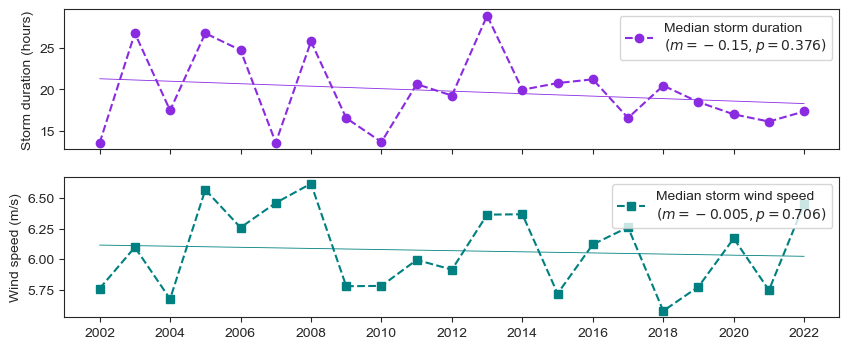

In [745]:
y = storm_durations_median
x = np.arange(len(y))
x = sm.add_constant(x)
mod = sm.OLS(y, x)
result = mod.fit()

y2 = storm_speeds_median
x2 = np.arange(len(y2))
x2 = sm.add_constant(x2)
mod2 = sm.OLS(y2, x2)
result2 = mod2.fit()

trend = np.polyfit(years,storm_durations_median, 1)
trendpoly = np.poly1d(trend) 
trend2 = np.polyfit(years,storm_speeds_median, 1)
trendpoly2 = np.poly1d(trend2) 

fig, ax = plt.subplots(2, sharex=True, figsize=(10,4))

ax[0].plot(storm_durations_median, 'o--', color='blueviolet', label=f'Median storm duration\n$(m={np.round(trend[0],3)}, p={np.round(result.pvalues[1],3)})$')
ax[1].plot(storm_speeds_median, 's--', color='teal', label=f'Median storm wind speed\n$(m={np.round(trend2[0],3)}, p={np.round(result2.pvalues[1],3)})$')
ax[0].plot(trendpoly(years), linewidth=0.6, color='blueviolet')
ax[1].plot(trendpoly2(years), linewidth=0.6, color='teal')

ax[0].set_xticks(ticks=np.arange(0,22,2),labels=years[::2])
ax[0].set_ylabel("Storm duration (hours)")
ax[0].tick_params(axis="y")
ax[0].legend(loc='upper right')

ax[1].set_ylabel("Wind speed (m/s)")
ax[1].tick_params(axis="y")
ax[1].legend(loc='upper right')

# fig.suptitle("")
fig.savefig('windstorm_property_comparison.pdf')

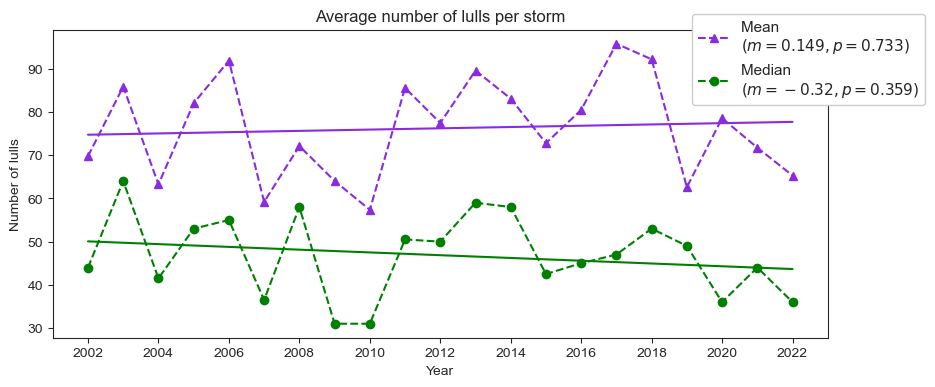

Slope of best fit (mean): 0.14867117206590755
Slope of best fit (median): -0.32012987012987676


In [729]:
y = lulls_perstorm_mean
x = np.arange(len(y))
x = sm.add_constant(x)
mod = sm.OLS(y, x)
result = mod.fit()

y2 = lulls_perstorm_median
x2 = np.arange(len(y2))
x2 = sm.add_constant(x2)
mod2 = sm.OLS(y2, x2)
result2 = mod2.fit()

plt.figure(figsize=(10,4))

trend = np.polyfit(years,lulls_perstorm_mean, 1)
trendpoly = np.poly1d(trend) 
trend2 = np.polyfit(years,lulls_perstorm_median, 1)
trendpoly2 = np.poly1d(trend2) 

plt.plot(years, lulls_perstorm_mean,'^--', color='blueviolet', label=f'Mean \n$(m={np.round(trend[0],3)}, p={np.round(result.pvalues[1],3)})$')
plt.plot(years, lulls_perstorm_median,'o--', color='green', label=f'Median \n$(m={np.round(trend2[0],3)}, p={np.round(result2.pvalues[1],3)})$')

plt.plot(years,trendpoly(years), color='blueviolet')
plt.plot(years,trendpoly2(years), color='green')

plt.xlabel(f"Year")
plt.ylabel("Number of lulls")
plt.xticks(ticks=years[::2])
plt.legend(prop={'size': 11},loc=(.825, .755),fancybox=True, framealpha=1) 
plt.title(f"Average number of lulls per storm")
# plt.savefig(f'windstorm_lulls.pdf',bbox_inches='tight')
plt.show()
print(f'Slope of best fit (mean): {trend[0]}')
print(f'Slope of best fit (median): {trend2[0]}')

0.47091259895543025


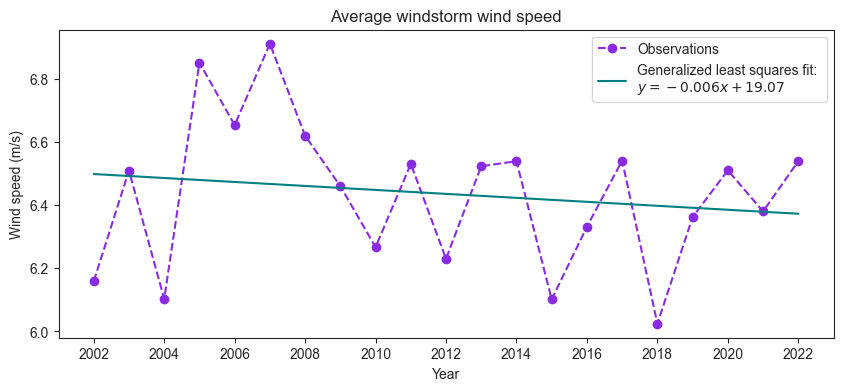

In [324]:
x = years
y = storm_speeds_mean

gls_model = sm.GLS(y, sm.add_constant(x))
gls_result = gls_model.fit()
gls_params = gls_result.params
print(gls_result.pvalues[1])

# nb_model = sm.GLM(y, sm.add_constant(x), family=sm.families.NegativeBinomial())
# nb_results = nb_model.fit()
# nb_params = nb_results.params

plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(years, storm_speeds_mean,'o--', color='blueviolet', label='Observations')

# trendpoly = np.exp(nb_params[1]*X+nb_params[0])
trendpoly2 = gls_params[0]+x*gls_params[1]

# plt.plot(years,trendpoly,'-',color='orange',label=f'Negative binomial model fit: \n$y = exp({np.round(nb_params[1],3)}x +{np.round(nb_params[0],3)})$')
plt.plot(years,trendpoly2,'-',color='teal',label=f'Generalized least squares fit: \n$y = {np.round(gls_params[1],3)}x +{np.round(gls_params[0],2)}$')
plt.xlabel(f"Year")
plt.ylabel("Wind speed (m/s)")
plt.xticks(years[::2])
plt.legend(loc="best",prop={'size': 10}) 
plt.title(f"Average windstorm wind speed")
# plt.savefig(f'wind_speeds_new.pdf')
plt.show()

0.31093294074776234


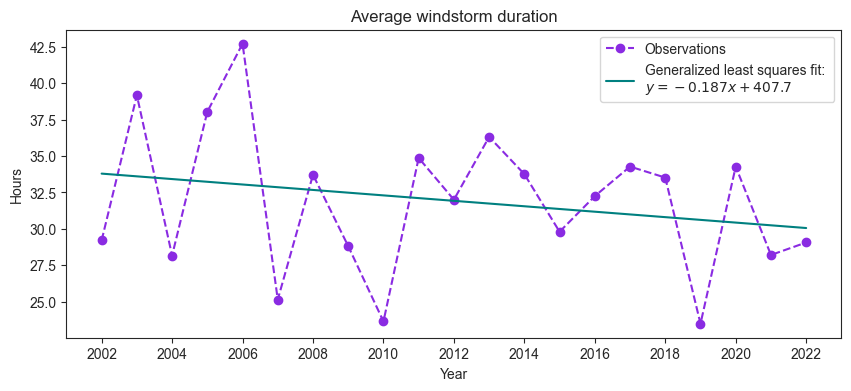

In [315]:
x = years
y = storm_durations_mean

gls_model = sm.GLS(y, sm.add_constant(x))
gls_result = gls_model.fit()
gls_params = gls_result.params
# print(gls_result.summary())
print(gls_result.pvalues[1])

# nb_model = sm.GLM(y, sm.add_constant(x), family=sm.families.NegativeBinomial())
# nb_results = nb_model.fit()
# nb_params = nb_results.params

plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(years, storm_durations_mean,'o--', color='blueviolet', label='Observations')

# trendpoly = np.exp(nb_params[1]*X+nb_params[0])
trendpoly2 = gls_params[0]+x*gls_params[1]

# plt.plot(years,trendpoly,'-',color='orange',label=f'Negative binomial model fit: \n$y = exp({np.round(nb_params[1],3)}x +{np.round(nb_params[0],3)})$')
plt.plot(years,trendpoly2,'-',color='teal',label=f'Generalized least squares fit: \n$y = {np.round(gls_params[1],3)}x +{np.round(gls_params[0],2)}$')
plt.xlabel(f"Year")
plt.ylabel("Hours")
plt.xticks(years[::2])
plt.legend(loc="best",prop={'size': 10}) 
plt.title(f"Average windstorm duration")
# plt.savefig(f'wind_durations_new.pdf')
plt.show()

## Diurnal investigation

In [65]:
hours = [(dtt.time(i).strftime('%H:%M')) for i in range(24)]
plot_hours = hours
plot_hours.append('24:00')

storm_times_daily = [item for sublist in storm_times for item in sublist]
storm_starttimes_daily = [item for sublist in storm_starttimes_mod1440 for item in sublist]
storm_stoptimes_daily = [item for sublist in storm_stoptimes_mod1440 for item in sublist]

In [28]:
d = dict(Time= storm_times_daily, StartTime= storm_starttimes_daily, EndTime= storm_stoptimes_daily) # start and end have NANs to be the same size as the storm minutes
    
pd.DataFrame({k:pd.Series(v) for k,v in d.items()})

,Time,StartTime,EndTime
0,1929,360.0,520.0
1,1930,28.0,810.0
2,1931,556.0,974.0
3,1932,1217.0,1004.0
4,1933,865.0,225.0
...,...,...,...
95889,1242,NaN,NaN
95890,1243,NaN,NaN
95891,1244,NaN,NaN
95892,1245,NaN,NaN


In [1560]:
d_d3 = {'Windstorm Times': storm_times_daily}

df_d3 = pd.DataFrame(data=d_d3)
df_d3.to_csv(r'diurnal_windstorm_data_overall.csv', index=False)

df_d3

,Windstorm Times
0,1929
1,1930
2,1931
3,1932
4,1933
...,...
98090,1242
98091,1243
98092,1244
98093,1245


In [66]:
d_d = {'Windstorm Start Times': storm_starttimes_daily,  'Windstorm End Times': storm_stoptimes_daily}

df_d = pd.DataFrame(data=d_d)
df_d.to_csv(r'diurnal_windstorm_data.csv', index=False)

df_d

,Windstorm Start Times,Windstorm End Times
0,360,520
1,28,810
2,556,974
3,1217,1004
4,865,225
...,...,...
2335,925,483
2336,448,981
2337,17,88
2338,924,773


In [1559]:
d_d2 = {'Windstorm Start Times': np.concatenate(storm_starttimes_mod1440),  'Windstorm End Times': np.concatenate(storm_stoptimes_mod1440)}

df_d2 = pd.DataFrame(data=d_d2)
df_d2.to_csv(r'diurnal_windstorm_data.csv', index=False)

df_d2

,Windstorm Start Times,Windstorm End Times
0,360,514
1,28,810
2,556,974
3,1217,1004
4,865,225
...,...,...
1172,925,483
1173,448,981
1174,17,88
1175,924,773


In [68]:
d_d = {'Windstorm Times': storm_times_daily}

df_d = pd.DataFrame(data=d_d)
df_d.to_csv(r'diurnal_windstorm_data2.csv', index=False)

df_d

,Windstorm Times
0,1929
1,1930
2,1931
3,1932
4,1933
...,...
95889,1242
95890,1243
95891,1244
95892,1245


Text(0.5, 1.0, 'Windstorm start times (2002-2022)')

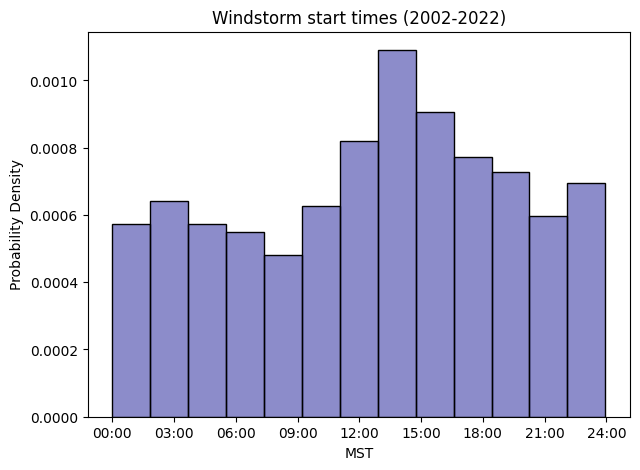

In [63]:
plt.figure(figsize=(7, 5))
sns.histplot(
    storm_starttimes_daily, kde=False, bins=13, color = 'darkblue',
    stat="density", kde_kws=dict(cut=3), label="Observations",
    alpha=.45, edgecolor='black') 
plt.xlabel(f"MST")
plt.ylabel("Probability Density")
plt.xticks(np.arange(0, 1441, 3*60), plot_hours[0::3])
plt.title(f"Windstorm start times (2002-2022)")
# plt.savefig(f'MFA_figures/diurnal_starttimes.pdf')

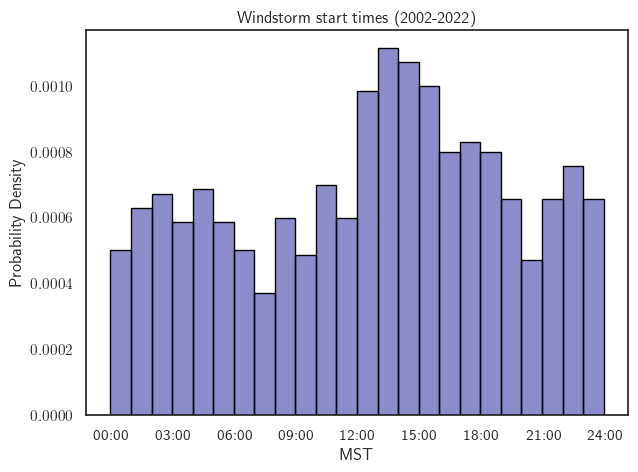

In [1388]:
plt.figure(figsize=(7, 5))
sns.set_style("white")
sns.histplot(
    storm_starttimes_daily, kde=False, bins=24, color = 'darkblue',
    stat="density", kde_kws=dict(cut=3), label="Observations",
    alpha=.45, edgecolor='black') 
plt.xlabel(f"MST")
plt.ylabel("Probability Density")
plt.xticks(np.arange(0, 1441, 3*60), plot_hours[0::3])
plt.title(f"Windstorm start times (2002-2022)")
# plt.savefig(f'MFA_figures/diurnal_starttimes.pdf')
plt.show()

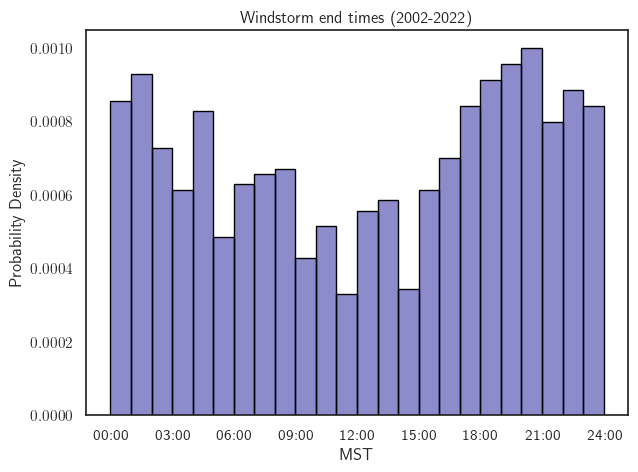

In [1390]:
plt.figure(figsize=(7, 5))
sns.histplot(
    storm_stoptimes_daily, kde=False, bins=24, color = 'darkblue',
    stat="density", kde_kws=dict(cut=3), label="Observations",
    alpha=.45, edgecolor='black') 
plt.xlabel(f"MST")
plt.ylabel("Probability Density")
plt.xticks(np.arange(0, 1441, 3*60), plot_hours[0::3])
plt.title(f"Windstorm end times (2002-2022)")
# plt.savefig(f'MFA_figures/diurnal_endtimes.pdf')
plt.show()

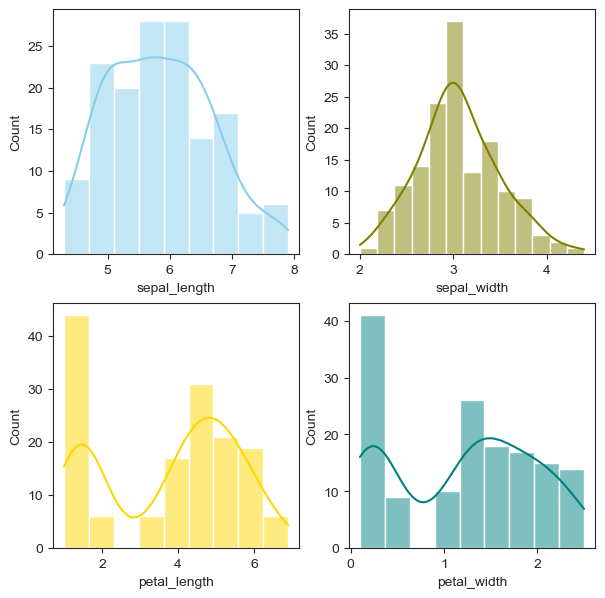

In [1011]:
df = sns.load_dataset("iris")

fig, axs = plt.subplots(2, 2, figsize=(7, 7))

sns.histplot(data=df, x="sepal_length", kde=True, color="skyblue", ax=axs[0, 0])
sns.histplot(data=df, x="sepal_width", kde=True, color="olive", ax=axs[0, 1])
sns.histplot(data=df, x="petal_length", kde=True, color="gold", ax=axs[1, 0])
sns.histplot(data=df, x="petal_width", kde=True, color="teal", ax=axs[1, 1])

plt.show()

Text(0.5, 1.0, 'Windstorm diurnal distribution (2002-2022)')

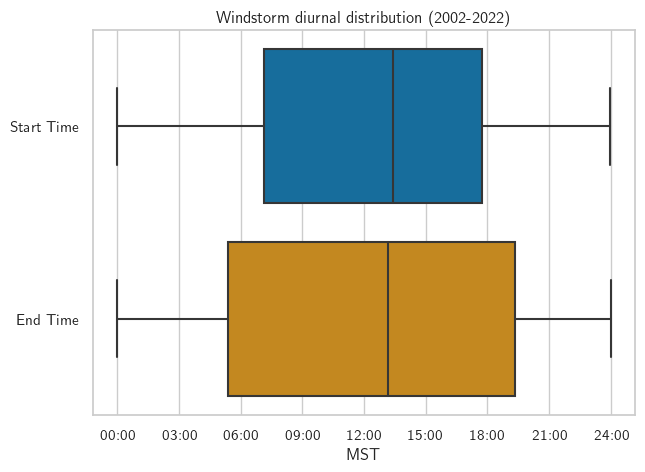

In [1338]:
d = {'Start Time': storm_starttimes_daily, 'End Time': storm_stoptimes_daily}
ddf = pd.DataFrame(data=d)

plt.figure(figsize=(7, 5))
sns.boxplot(data=ddf[["Start Time", "End Time"]], orient="h", palette='colorblind')
plt.xlabel(f"MST")
plt.xticks(np.arange(0, 1441, 3*60), plot_hours[0::3])
plt.title(f"Windstorm diurnal distribution (2002-2022)")
# data=df, x="fare", y="deck", hue="deck"
# plt.savefig(f'diurnal_boxplots.pdf')

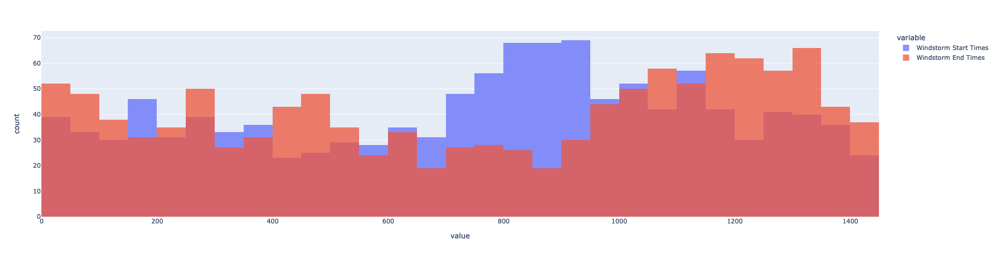

In [1433]:
fig = px.histogram(df_d2, width=1000, height=500)
fig.update_layout(
    barmode="overlay",
    bargap=0)
fig.update_traces(opacity=0.75)
fig.show()

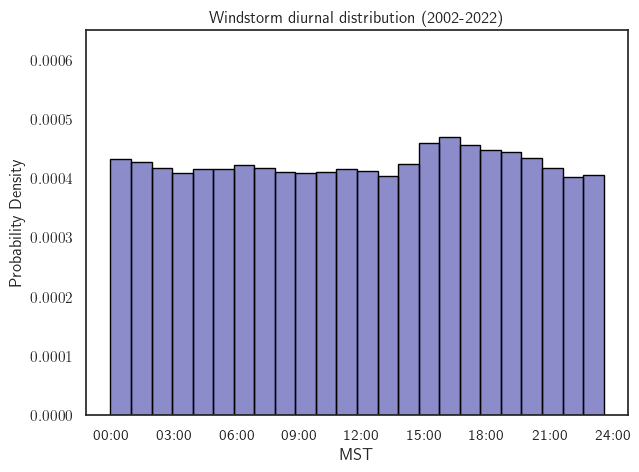

In [1541]:
plt.figure(figsize=(7, 5))
sns.histplot(
    storm_times_daily, kde=False, bins=24, color = 'darkblue',
    stat="density", kde_kws=dict(cut=3), label="Observations",
    alpha=.45, edgecolor='black') 
plt.xlabel(f"MST")
plt.ylabel("Probability Density")
plt.ylim(0,0.00065)
plt.xticks(np.arange(0, 2401, 300), plot_hours[0::3])
plt.title(f"Windstorm diurnal distribution (2002-2022)")
# plt.savefig('MFA_figures/diurnal.pdf')
plt.show()

In [1461]:
np.max(df_d2['Windstorm End Times'])

1439

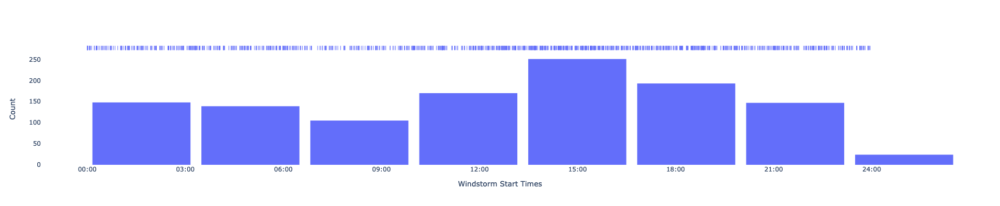

In [1495]:
fig = px.histogram(df_d2, x="Windstorm Start Times", width=800, height=400, marginal="rug",nbins=12)
fig.update_layout(bargap=0.1, 
                    xaxis = dict(
                    tickmode = 'array',
                    tickvals = np.arange(0,1441,180),
                    ticktext = plot_hours[0::3]),
                plot_bgcolor="white",
                yaxis_title="Count")
fig.show()
# fig = px.histogram(df_d2, x="Windstorm End Times", width=800, height=400, nbins=12,marginal="rug")
# fig.update_layout(bargap=0.1, 
#                     xaxis = dict(
#                     tickmode = 'array',
#                     tickvals = np.arange(0,1441,180),
#                     ticktext = plot_hours[0::3]),
#                 plot_bgcolor="white",
#                 yaxis_title="Count")
# fig.show()
# fig = px.histogram(df_d3, x="Windstorm Times", width=800, height=400, nbins=24)
# fig.update_layout(bargap=0.1, 
#                     xaxis = dict(
#                     tickmode = 'array',
#                     tickvals = np.arange(0,1441,180),
#                     ticktext = plot_hours[0::3]),
#                 plot_bgcolor="white",
#                 yaxis_title="Count")
# fig.show()

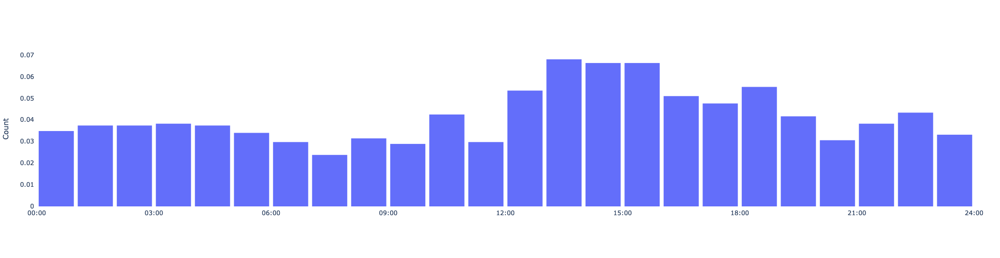

In [1511]:
fig = go.Figure(data=[go.Histogram(x=df_d2["Windstorm Start Times"], xbins=dict(
                      start=0,
                      end=1440,
                      size=60), autobinx=False, histnorm='probability')])
fig.update_layout(
    autosize=False,
    width=800,
    height=500,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4),
    plot_bgcolor="white",
    bargap=0.1, 
    xaxis = dict(
    tickmode = 'array',
    tickvals = np.arange(0,1441,180),
    ticktext = plot_hours[0::3]),
    yaxis_title="Count")

fig.show()

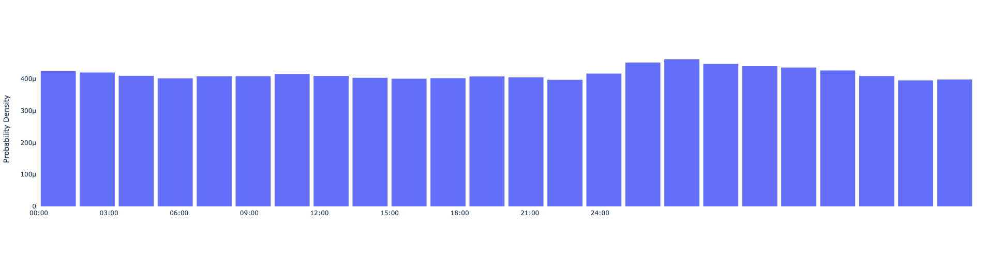

In [1552]:
fig = go.Figure(data=[go.Histogram(x=df_d3["Windstorm Times"], xbins=dict(
                      start=0,
                      end=2400,
                      size=100), autobinx=False, histnorm='probability density')])
fig.update_layout(
    autosize=False,
    width=800,
    height=500,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4),
    plot_bgcolor="white",
    bargap=0.1, 
    xaxis = dict(
    tickmode = 'array',
    tickvals = np.arange(0,1441,180),
    ticktext = plot_hours[0::3]),
    yaxis_title="Probability Density")

fig.show()

In [ ]:
error_y=dict(type='data', array=[1, 0.5, 1.5])

In [1562]:
df_d2

,Windstorm Start Times,Windstorm End Times
0,360,514
1,28,810
2,556,974
3,1217,1004
4,865,225
...,...,...
1172,925,483
1173,448,981
1174,17,88
1175,924,773


In [1564]:
# ERROR BARS FOR DIURNAL : try following methodology from months, group by hour and stddev and CIs

# hour1 = []

# for item in df_d2['Windstorm Start Times']: 
#     hour1.append()

# monthly_storm_CIs = []
# for i in range(12):
#     data = storms_by_month[i]
#     monthly_storm_CIs.append(stats.t.interval(0.95, df=len(data)-1, loc=np.mean(data), scale=stats.sem(data)))

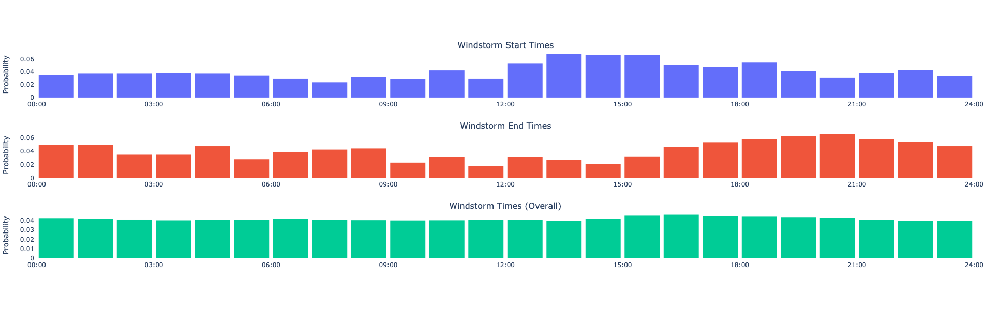

In [1558]:
from plotly.subplots import make_subplots

fig = make_subplots(rows=3, cols=1, subplot_titles=[
        'Windstorm Start Times', 
        'Windstorm End Times', 
        'Windstorm Times (Overall)'
    ])

fig.update_layout(
    showlegend=False,
    autosize=False,
    width=800,
    height=600,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4),
    plot_bgcolor="white",
    bargap=0.1, 
    yaxis_title="Probability",
    yaxis2_title="Probability",
    yaxis3_title="Probability",
    xaxis = dict(
        tickmode = 'array',
        tickvals = np.arange(0,1441,180),
        ticktext = plot_hours[0::3]),
    xaxis2 = dict(
        tickmode = 'array',
        tickvals = np.arange(0,1441,180),
        ticktext = plot_hours[0::3]),
    xaxis3 = dict(
        tickmode = 'array',
        tickvals = np.arange(0,2401,300),
        ticktext = plot_hours[0::3]))

trace0 = go.Histogram(x=df_d2["Windstorm Start Times"], xbins=dict(
                      start=0,
                      end=1440,
                      size=60), autobinx=False, histnorm='probability')
trace1 = go.Histogram(x=df_d2["Windstorm End Times"], xbins=dict(
                      start=0,
                      end=1440,
                      size=60), autobinx=False, histnorm='probability')
trace2 = go.Histogram(x=df_d3["Windstorm Times"], xbins=dict(
                      start=0,
                      end=2400,
                      size=100), autobinx=False, histnorm='probability')

fig.append_trace(trace0, 1,1)
fig.append_trace(trace1, 2,1)
fig.append_trace(trace2, 3,1)

fig.show()

In [1431]:
from scipy.stats import chisquare

# observed frequencies
observed_frequencies = storm_times_daily

# number of observations
n = sum(observed_frequencies)
N = len(observed_frequencies)

# expected frequencies under the null hypothesis of a uniform distribution
expected_frequencies = [n/N for i in range(N)]

# compute the chi-squared statistic
chi_squared_statistic, p_value = chisquare(observed_frequencies, f_exp=expected_frequencies)

# if the p-value is less than the significance level (e.g. 0.05),
# we can reject the null hypothesis and conclude that the distribution is not uniform
if p_value < 0.05:
    print("The distribution is not uniform")
else:
    print("The distribution is uniform")

The distribution is not uniform


## Seasonal analysis

### Generate the data

In [239]:
yearly_data = [] # np.zeros(len(years))
height='10m'
subset = ['Year', 'DOY', 'MST', f'Avg Wind Speed @ {height} [m/s]', f'Avg Wind Direction @ {height} [deg]', 'Temperature @ 2m [deg C]', 'Relative Humidity [%]']

for i in np.arange(2002,2023,1): 
    year = i

    df = pd.read_csv(f'/Users/serena/Documents/Research/Data/{year}_data.csv', usecols=lambda x: x in subset)
    df.insert(2, 'Date (MM/DD/YYYY)', df['DOY'].apply(doy_to_date, args=(year,))) 
    df = df.replace(-99999.0, np.nan)
    df['Date (MM/DD/YYYY)'] = pd.to_datetime(df['Date (MM/DD/YYYY)'], format='%m/%d/%Y') # convert date column to DateTime
    df.set_index('Date (MM/DD/YYYY)')
    
    yearly_data.append(df)

    print(f'Finished {year}')

Finished 2002
Finished 2003
Finished 2004
Finished 2005
Finished 2006
Finished 2007
Finished 2008
Finished 2009
Finished 2010
Finished 2011
Finished 2012
Finished 2013
Finished 2014
Finished 2015
Finished 2016
Finished 2017
Finished 2018
Finished 2019
Finished 2020
Finished 2021
Finished 2022


In [70]:
# file with all data from all years
full_data = pd.concat(yearly_data)
full_data['Date (MM/DD/YYYY)'] = pd.to_datetime(full_data['Date (MM/DD/YYYY)'], format='%m/%d/%Y') # convert date column to DateTime
full_data.set_index('Date (MM/DD/YYYY)')
full_data

,Year,DOY,Date (MM/DD/YYYY),MST,Avg Wind Speed @ 10m [m/s],Avg Wind Direction @ 10m [deg],Temperature @ 2m [deg C],Relative Humidity [%]
0,2002,1,2002-01-01,0.0,2.7312,30.179,-6.8633,92.937
1,2002,1,2002-01-01,1.0,2.7907,23.560,-6.8634,93.702
2,2002,1,2002-01-01,2.0,3.5522,19.807,-6.8996,92.355
3,2002,1,2002-01-01,3.0,3.4231,18.708,-6.9496,91.033
4,2002,1,2002-01-01,4.0,3.5745,20.513,-6.9630,91.161
...,...,...,...,...,...,...,...,...
525595,2022,365,2022-12-31,2355.0,6.1440,173.100,0.3750,70.500
525596,2022,365,2022-12-31,2356.0,6.3160,172.200,0.2460,70.800
525597,2022,365,2022-12-31,2357.0,6.1080,170.900,0.1410,71.000
525598,2022,365,2022-12-31,2358.0,5.9460,173.100,0.0210,71.350


In [242]:
storm_durations_monthly = np.zeros(12)
storm_speeds_monthly = np.zeros(12)

# group the data by month
sort = list(full_data.groupby(full_data['Date (MM/DD/YYYY)'].dt.month))

monthly_data = []
for i in range(len(sort)):
    monthly_data.append(sort[i][1])
    
monthly_storms = np.zeros(12)
for i in range(len(monthly_data)): 
    monthly_data[i] = monthly_data[i].reset_index()
    monthly_data[i] = monthly_data[i].rename(columns={'index': 'Overall index'})
    storms_with_lulls = [storm                                                       
                     for storm in                                                
                     WindstormWithLulls.storms_by_threshold(monthly_data[i], 4.5, 12*60, [240, 330])         
                     if storm.duration >= 60 and np.median(storm.speed) >= 4.5 and np.mean(storm.speed) >= 4.5]  
    
    storm_durations = [storm.duration for storm in storms_with_lulls]
    storm_speeds = [np.median(storm.speed) for storm in storms_with_lulls]  
    monthly_storms[i] = len(storms_with_lulls) # cumulative
    storm_durations_monthly[i] = np.median(storm_durations)/60
    storm_speeds_monthly[i] = np.median(storm_speeds)

    print(f'Total windstorms in month {i+1}: {len(storms_with_lulls)}')

Total windstorms in month 1: 134
Total windstorms in month 2: 105
Total windstorms in month 3: 120
Total windstorms in month 4: 108
Total windstorms in month 5: 91
Total windstorms in month 6: 90
Total windstorms in month 7: 57
Total windstorms in month 8: 65
Total windstorms in month 9: 78
Total windstorms in month 10: 90
Total windstorms in month 11: 118
Total windstorms in month 12: 133


#### Getting variance for error bars for monthly storms

In [738]:
monthly_data[0]

,Overall index,Year,DOY,Date (MM/DD/YYYY),MST,Avg Wind Speed @ 10m [m/s],Avg Wind Direction @ 10m [deg],Temperature @ 2m [deg C],Relative Humidity [%]
0,0,2002,1,2002-01-01,0.0,2.7312,30.179,-6.8633,92.937
1,1,2002,1,2002-01-01,1.0,2.7907,23.560,-6.8634,93.702
2,2,2002,1,2002-01-01,2.0,3.5522,19.807,-6.8996,92.355
3,3,2002,1,2002-01-01,3.0,3.4231,18.708,-6.9496,91.033
4,4,2002,1,2002-01-01,4.0,3.5745,20.513,-6.9630,91.161
...,...,...,...,...,...,...,...,...,...
937437,44635,2022,31,2022-01-31,2355.0,5.8480,180.400,-0.7790,49.510
937438,44636,2022,31,2022-01-31,2356.0,5.1610,177.700,-0.7480,49.730
937439,44637,2022,31,2022-01-31,2357.0,5.4040,177.800,-0.8130,50.300
937440,44638,2022,31,2022-01-31,2358.0,5.0050,173.800,-0.8600,50.730


In [2155]:
np.max(monthly_data[11]['Avg Wind Speed @ 10m [m/s]'])

34.206

In [744]:
Jan_storms = []

for i in range(21): 
    df = monthly_data[0] # contains 21 years of data from one month
    df_one_year = df[df.Year == 2002+i]
    storms_with_lulls = [storm                                                       
                     for storm in                                                
                     WindstormWithLulls.storms_by_threshold(df_one_year, 4.5, 12*60, [240, 330])         
                     if storm.duration >= 60 and np.median(storm.speed) >= 4.5 and np.mean(storm.speed) >= 4.5] 
    Jan_storms.append(len(storms_with_lulls))
    print(f'Total windstorms in month 1 during {i+2002}: {len(storms_with_lulls)}')    

Total windstorms in month 1 during 2002: 9
Total windstorms in month 1 during 2003: 5
Total windstorms in month 1 during 2004: 6
Total windstorms in month 1 during 2005: 6
Total windstorms in month 1 during 2006: 5
Total windstorms in month 1 during 2007: 5
Total windstorms in month 1 during 2008: 10
Total windstorms in month 1 during 2009: 6
Total windstorms in month 1 during 2010: 4
Total windstorms in month 1 during 2011: 6
Total windstorms in month 1 during 2012: 9
Total windstorms in month 1 during 2013: 4
Total windstorms in month 1 during 2014: 7
Total windstorms in month 1 during 2015: 6
Total windstorms in month 1 during 2016: 7
Total windstorms in month 1 during 2017: 4
Total windstorms in month 1 during 2018: 6
Total windstorms in month 1 during 2019: 9
Total windstorms in month 1 during 2020: 7
Total windstorms in month 1 during 2021: 9
Total windstorms in month 1 during 2022: 5


In [749]:
years

array([2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012,
       2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022])

In [1053]:
np.median(durations_by_month[1]) #mean 25, std 12!!!!!!, 39 and 28

35.65833333333333

(array([3., 0., 3., 2., 2., 4., 3., 1., 1., 1.]),
 array([ 3.875     ,  8.61916667, 13.36333333, 18.1075    , 22.85166667,
        27.59583333, 32.34      , 37.08416667, 41.82833333, 46.5725    ,
        51.31666667]),
 <BarContainer object of 10 artists>)

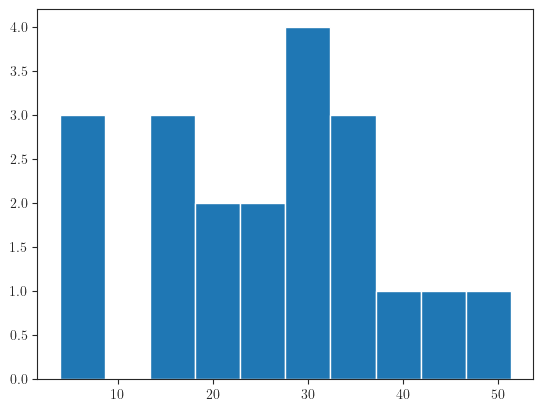

In [1048]:
plt.hist(durations_by_month[3])

In [1011]:
storms_by_month = []
speeds_by_month = []
durations_by_month = []
for month in months:
    
    storms_one_month = []
    speeds_one_month = []
    durations_one_month = []
    
    for year in years: 
        df = monthly_data[month-1] # contains 21 years of data from one month
        df_one_year = df[df.Year == year]
        
        storms_with_lulls = [storm                                                       
                         for storm in                                                
                         WindstormWithLulls.storms_by_threshold(df_one_year, 4.5, 12*60, [240, 330])         
                         if storm.duration >= 60 and np.median(storm.speed) >= 4.5 and np.mean(storm.speed) >= 4.5] 
        
        storms_one_month.append(len(storms_with_lulls))
        
        storm_speeds = [np.median(storm.speed) for storm in storms_with_lulls] 
        storm_durations = [storm.duration for storm in storms_with_lulls]
        
        speeds_one_month.append(np.median(storm_speeds))
        durations_one_month.append(np.median(storm_durations)/60)
        
    storms_by_month.append(storms_one_month)
    speeds_by_month.append(speeds_one_month)
    durations_by_month.append(durations_one_month)
    print(f'Month {month} finished!')    

Month 1 finished!
Month 2 finished!
Month 3 finished!
Month 4 finished!
Month 5 finished!
Month 6 finished!
Month 7 finished!
Month 8 finished!
Month 9 finished!
Month 10 finished!
Month 11 finished!
Month 12 finished!


In [1086]:
toth_by_month = []
for month in months:
    toth_one_month = []
    
    for year in years: 
        df = monthly_data[month-1] # contains 21 years of data from one month
        df_one_year = df[df.Year == year]
        
        toth = count_over_thresholds(df_one_year['Avg Wind Speed @ 10m [m/s]'], 4.5, df_one_year['Avg Wind Direction @ 10m [deg]'], [240, 330])
        
        toth_one_month.append(toth/60)
  
    toth_by_month.append(toth_one_month)
    print(f'Month {month} finished!')  

Month 1 finished!
Month 2 finished!
Month 3 finished!
Month 4 finished!
Month 5 finished!
Month 6 finished!
Month 7 finished!
Month 8 finished!
Month 9 finished!
Month 10 finished!
Month 11 finished!
Month 12 finished!


In [1930]:
np.shape(toth_by_month)

(12, 21)

In [1061]:
monthly_storms = np.zeros(12)
for i in range(12):
    monthly_storms[i]=np.sum(storms_by_month[i])
monthly_storms

array([135., 109., 124., 111.,  93.,  91.,  58.,  66.,  82.,  93., 122.,
       138.])

In [1929]:
np.shape(storms_by_month)

(12, 21)

In [1067]:
storm_speeds_monthly = np.zeros(12)
for i in range(12):
    storm_speeds_monthly[i]=np.nanmedian(speeds_by_month[i])
storm_speeds_monthly

array([6.5654   , 6.13535  , 5.8901   , 5.6241125, 5.52565  , 5.3033   ,
       5.37315  , 5.31765  , 5.2314   , 5.940175 , 6.046475 , 5.85475  ])

In [1068]:
storm_durations_monthly = np.zeros(12)
for i in range(12):
    storm_durations_monthly[i]=np.nanmedian(durations_by_month[i])
storm_durations_monthly

array([31.06666667, 35.65833333, 21.95833333, 26.45416667, 10.36666667,
        7.05      ,  5.46666667,  6.3       , 11.75      , 24.63333333,
       21.66666667, 26.61666667])

In [1717]:
toth_monthly = np.zeros(12)
for i in range(12):
    toth_monthly[i]=np.sum(toth_by_month[i])
toth_monthly

array([4426.28333333, 3229.85      , 3134.55      , 2419.11666667,
       1342.71666667, 1150.4       , 1039.15      , 1171.81666667,
       1341.88333333, 2442.46666667, 3337.33333333, 4068.5       ])

##### Paired t-test

In [1920]:
winter_storms = []
winter_storms.append(storms_by_month[0])
winter_storms.append(storms_by_month[1])
winter_storms.append(storms_by_month[11])
winter_storms = np.ravel(winter_storms)
winter_storms

array([ 9,  5,  6,  6,  5,  5, 10,  6,  4,  6,  9,  4,  7,  6,  7,  4,  6,
        9,  7,  9,  5,  9,  2,  3,  4,  4,  7,  6,  6,  2,  8,  4,  6,  5,
        5,  8,  6,  5,  6,  7,  3,  3,  7,  5,  6,  5,  5,  9,  7,  6,  6,
        4,  9,  9,  4,  5,  8,  7,  6,  8,  4,  9,  9])

In [1921]:
summer_storms = []
summer_storms.append(storms_by_month[5])
summer_storms.append(storms_by_month[6])
summer_storms.append(storms_by_month[7])
summer_storms = np.ravel(summer_storms)
summer_storms

array([ 6,  3,  2,  5,  1,  2,  5,  6,  1,  8, 11,  5,  7,  2,  4,  2,  4,
        3,  4,  6,  4,  4,  2,  3,  2,  5,  3,  3,  2,  4,  3,  3,  3,  1,
        4,  4,  4,  1,  3,  3,  0,  1,  7,  1,  1,  2,  1,  3,  7,  1,  4,
        5,  7,  2,  2,  4,  4,  3,  4,  3,  1,  2,  2])

In [1922]:
stats.ttest_rel(winter_storms, summer_storms)

TtestResult(statistic=9.52819037619457, pvalue=9.33297650405846e-14, df=62)

In [1941]:
winter_speeds = []
winter_speeds.append(speeds_by_month[0])
winter_speeds.append(speeds_by_month[1])
winter_speeds.append(speeds_by_month[11])
winter_speeds = np.ravel(winter_speeds)
winter_speeds = np.delete(winter_speeds, 40, None)
winter_speeds

array([5.47335 , 6.2404  , 7.49445 , 7.05675 , 6.5654  , 8.2321  ,
       6.57185 , 8.5247  , 5.172625, 7.14315 , 7.09525 , 8.356275,
       7.4024  , 5.965075, 6.1068  , 5.8439  , 4.93085 , 6.2025  ,
       5.695   , 8.91    , 5.158   , 7.1877  , 6.96695 , 5.08725 ,
       6.11755 , 6.13535 , 5.9723  , 6.9262  , 5.5986  , 8.030675,
       6.269975, 6.69595 , 5.5467  , 5.7784  , 5.3989  , 6.24595 ,
       6.21315 , 5.3692  , 6.162   , 6.023   , 6.686   , 5.43835 ,
       5.8069  , 6.792825, 6.84295 , 6.5021  , 6.3618  , 7.5123  ,
       5.788625, 5.399375, 6.171375, 5.72755 , 6.9496  , 5.796925,
       5.4251  , 6.0937  , 6.0127  , 5.563   , 5.5065  , 5.85475 ,
       5.6315  , 7.7325  ])

In [1940]:
summer_speeds = []
summer_speeds.append(speeds_by_month[5])
summer_speeds.append(speeds_by_month[6])
summer_speeds.append(speeds_by_month[7])
summer_speeds = np.ravel(summer_speeds)
summer_speeds = np.delete(summer_speeds, 40, None)
summer_speeds

array([5.3202  , 5.8119  , 5.1517  , 4.9357  , 5.8093  , 7.745675,
       5.12655 , 5.210325, 4.5872  , 4.864325, 5.3033  , 5.5084  ,
       5.5485  , 5.892   , 4.94695 , 5.534   , 5.2471  , 5.2055  ,
       6.50075 , 5.2905  , 6.42475 , 4.621325, 4.78395 , 4.9154  ,
       6.328225, 5.57645 , 5.2662  , 5.95225 , 4.5707  , 4.7897  ,
       5.14285 , 5.3768  , 6.3135  , 4.8599  , 5.51225 , 5.5857  ,
       5.2492  , 5.6714  , 5.462   , 6.2065  , 5.3695  , 5.9991  ,
       5.8762  , 4.9429  , 5.3919  , 5.3147  , 5.7771  , 4.6977  ,
       5.2249  , 4.753675, 5.34135 , 4.8914  , 5.3306  , 5.91145 ,
       5.57625 , 5.31765 , 5.2499  , 4.8297  , 5.318   , 6.0795  ,
       5.01975 , 4.59075 ])

In [1942]:
stats.ttest_rel(winter_speeds, summer_speeds)

TtestResult(statistic=6.824649293060611, pvalue=4.633594292882831e-09, df=61)

In [1970]:
winter_toth.std()

64.87353025628829

In [1971]:
summer_toth.std()

16.410156669895542

In [1946]:
winter_durations = []
winter_durations.append(durations_by_month[0])
winter_durations.append(durations_by_month[1])
winter_durations.append(durations_by_month[11])
winter_durations = np.ravel(winter_durations)
winter_durations = np.delete(winter_durations, 40, None)
winter_durations

array([23.4       , 77.16666667, 22.68333333, 30.75833333, 60.53333333,
       26.76666667, 31.11666667, 76.78333333, 20.5       , 70.35833333,
       52.03333333, 31.06666667, 53.98333333, 43.275     , 13.75      ,
       59.26666667, 47.09166667, 24.05      , 24.83333333, 20.43333333,
       25.15      , 13.08333333, 37.90833333,  3.38333333, 35.65833333,
       86.69166667, 22.11666667, 27.14166667, 46.03333333, 20.375     ,
       20.59166667, 38.825     , 39.2       , 54.93333333, 24.6       ,
       57.84166667, 11.425     , 43.23333333, 17.95833333, 21.83333333,
       72.48333333, 58.2       , 26.61666667, 23.875     , 68.18333333,
       55.61666667, 30.85      , 41.2       , 24.98333333, 23.64166667,
       15.50833333, 24.41666667, 37.9       , 14.05833333, 56.68333333,
       35.2       , 26.56666667, 23.16666667, 25.85833333, 25.50833333,
       27.15      , 45.48333333])

In [1945]:
summer_durations = []
summer_durations.append(durations_by_month[5])
summer_durations.append(durations_by_month[6])
summer_durations.append(durations_by_month[7])
summer_durations = np.ravel(summer_durations)
summer_durations = np.delete(summer_durations, 40, None)
summer_durations

array([ 6.        ,  4.        , 44.03333333,  6.75      , 12.18333333,
       20.10833333, 28.55      ,  6.38333333,  1.3       ,  9.05833333,
        7.05      , 12.38333333,  4.68333333,  3.8       ,  7.69166667,
       16.775     ,  6.79166667, 24.45      ,  9.06666667,  5.175     ,
        5.54166667,  5.325     , 29.41666667, 18.        , 10.825     ,
       10.8       ,  3.2       ,  2.61666667, 17.        ,  5.54166667,
        6.18333333,  8.51666667,  5.        , 63.01666667,  3.94166667,
        5.39166667,  4.30833333,  5.06666667,  6.45      ,  2.65      ,
        2.06666667,  5.18333333, 52.51666667, 13.75      , 10.78333333,
       16.45      ,  2.46666667,  4.2       ,  2.01666667,  5.325     ,
        6.95      ,  5.78333333,  4.83333333, 11.075     ,  5.65      ,
        7.625     ,  1.55      ,  2.        ,  8.96666667, 34.43333333,
        6.3       , 43.09166667])

In [1947]:
stats.ttest_rel(winter_durations, summer_durations)

TtestResult(statistic=8.718193461257691, pvalue=2.582164165966802e-12, df=61)

In [1948]:
winter_toth = []
winter_toth.append(toth_by_month[0])
winter_toth.append(toth_by_month[1])
winter_toth.append(toth_by_month[11])
winter_toth = np.ravel(winter_toth)
winter_toth

array([174.13333333, 233.73333333, 203.75      , 147.96666667,
       367.41666667, 116.65      , 281.58333333, 317.53333333,
       104.58333333, 318.81666667, 294.2       , 163.01666667,
       316.46666667, 151.13333333, 172.53333333, 155.03333333,
       173.03333333, 161.8       , 253.45      , 165.63333333,
       153.81666667, 151.25      ,  85.78333333,  63.08333333,
        91.9       , 247.78333333, 179.85      , 206.21666667,
       225.6       ,  79.33333333, 154.91666667, 135.66666667,
       170.98333333, 173.55      , 162.65      , 237.85      ,
       135.15      , 127.5       , 110.26666667, 149.28333333,
       185.63333333, 155.6       , 221.45      , 204.56666667,
       238.01666667, 315.95      , 188.16666667, 198.71666667,
       275.8       , 168.81666667, 128.01666667,  97.43333333,
       164.18333333, 249.58333333, 102.65      , 188.88333333,
       186.38333333, 153.63333333, 166.33333333, 170.51666667,
       176.9       , 209.75      , 262.75      ])

In [1951]:
summer_toth = []
summer_toth.append(toth_by_month[5])
summer_toth.append(toth_by_month[6])
summer_toth.append(toth_by_month[7])
summer_toth = np.ravel(summer_toth)
summer_toth

array([ 48.28333333,  23.5       ,  54.58333333,  74.98333333,
        72.86666667,  50.05      , 102.11666667,  35.33333333,
        24.43333333,  51.48333333,  75.06666667,  36.65      ,
        55.11666667,  20.68333333,  50.45      ,  49.61666667,
        55.61666667,  64.63333333,  84.68333333,  60.13333333,
        60.11666667,  43.18333333,  59.81666667,  49.98333333,
        60.45      ,  50.56666667,  44.8       ,  66.38333333,
        24.66666667,  51.78333333,  48.31666667,  74.3       ,
        54.41666667,  42.86666667,  62.4       ,  57.23333333,
        32.81666667,  21.36666667,  40.1       ,  52.81666667,
        36.71666667,  64.16666667,  71.25      ,  58.3       ,
        44.7       ,  69.13333333,  50.25      ,  53.8       ,
        47.31666667,  27.45      ,  64.16666667,  78.23333333,
        93.98333333,  49.05      ,  50.06666667,  65.11666667,
        47.46666667,  30.43333333,  54.05      ,  50.96666667,
        54.36666667,  48.56666667,  63.15      ])

In [1952]:
stats.ttest_rel(winter_toth, summer_toth)

TtestResult(statistic=16.400741734133387, pvalue=3.144810890563471e-24, df=62)

##### windstorms

(array([5., 5., 0., 3., 0., 4., 1., 0., 0., 3.]),
 array([1. , 1.6, 2.2, 2.8, 3.4, 4. , 4.6, 5.2, 5.8, 6.4, 7. ]),
 <BarContainer object of 10 artists>)

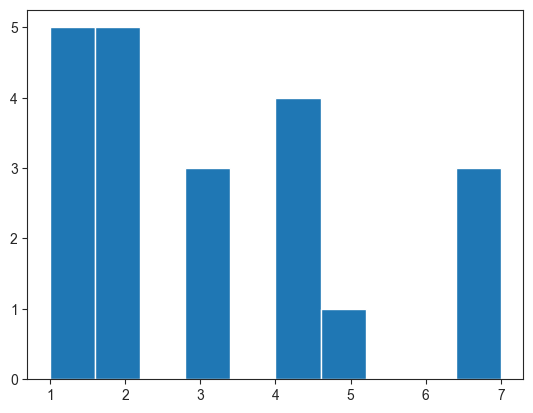

In [825]:
plt.hist(storms_by_month[7])

In [830]:
for i in range(12):
    print(shapiro(storms_by_month[i]))

ShapiroResult(statistic=0.9017806053161621, pvalue=0.03789261728525162)
ShapiroResult(statistic=0.9609250426292419, pvalue=0.5349546670913696)
ShapiroResult(statistic=0.8734889030456543, pvalue=0.011085687205195427)
ShapiroResult(statistic=0.9453176856040955, pvalue=0.27703648805618286)
ShapiroResult(statistic=0.9440444111824036, pvalue=0.2616714537143707)
ShapiroResult(statistic=0.9327433109283447, pvalue=0.15622296929359436)
ShapiroResult(statistic=0.9236847758293152, pvalue=0.10283660143613815)
ShapiroResult(statistic=0.8638839721679688, pvalue=0.007438485976308584)
ShapiroResult(statistic=0.937442421913147, pvalue=0.19388270378112793)
ShapiroResult(statistic=0.9666411280632019, pvalue=0.658170223236084)
ShapiroResult(statistic=0.9477846622467041, pvalue=0.30912235379219055)
ShapiroResult(statistic=0.896278440952301, pvalue=0.029655853286385536)


In [835]:
monthly_storm_CIs = []
for i in range(12):
    data = storms_by_month[i]
    monthly_storm_CIs.append(stats.t.interval(0.95, df=len(data)-1, loc=np.mean(data), scale=stats.sem(data)))

In [867]:
monthly_storm_CIs[0]

(5.594540880801237, 7.262601976341621)

In [774]:
np.sum(storms_by_month) #higher than total when not cutting off at each month, happens because many storms carry from one month to the next

1222

In [1103]:
storms_by_month[6]

[9, 5, 6, 6, 5, 5, 10, 6, 4, 6, 9, 4, 7, 6, 7, 4, 6, 9, 7, 9, 5]

In [1166]:
d_d_storms = {'Jan': storms_by_month[0], 'Feb': storms_by_month[1], 'Mar': storms_by_month[2], 'Apr': storms_by_month[3], 'May': storms_by_month[4], 'Jun': storms_by_month[5], 'Jul': storms_by_month[6], 'Aug': storms_by_month[7], 'Sep': storms_by_month[8], 'Oct': storms_by_month[9], 'Nov': storms_by_month[10], 'Dec': storms_by_month[11]}
# 'Year': np.arange(2002,2023), 
df_d_storms = pd.DataFrame(data=d_d_storms)
# df_d_storms.to_csv('full_monthly_windstorm_data.csv', index=False)

df_d_storms

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
0,9,9,9,8,4,6,4,7,5,5,5,7
1,5,2,7,5,7,3,2,1,7,5,4,5
2,6,3,7,5,6,2,3,1,7,5,5,6
3,6,4,4,7,3,5,2,2,2,3,5,5
4,5,4,7,5,6,1,5,1,5,4,9,5
5,5,7,4,8,4,2,3,3,2,3,6,9
6,10,6,7,8,8,5,3,7,3,2,6,7
7,6,6,5,4,4,6,2,1,5,4,4,6
8,4,2,4,6,8,1,4,4,6,5,8,6
9,6,8,9,9,2,8,3,5,2,6,4,4


In [1298]:
df_d_storms.Jun.mean()

4.333333333333333

In [1189]:
yearly_data_months = []
for i in range(len(years)):
    yearly_data_months.append(df_d_storms.iloc[i])
yearly_data_months

[Jan    9
 Feb    9
 Mar    9
 Apr    8
 May    4
 Jun    6
 Jul    4
 Aug    7
 Sep    5
 Oct    5
 Nov    5
 Dec    7
 Name: 0, dtype: int64,
 Jan    5
 Feb    2
 Mar    7
 Apr    5
 May    7
 Jun    3
 Jul    2
 Aug    1
 Sep    7
 Oct    5
 Nov    4
 Dec    5
 Name: 1, dtype: int64,
 Jan    6
 Feb    3
 Mar    7
 Apr    5
 May    6
 Jun    2
 Jul    3
 Aug    1
 Sep    7
 Oct    5
 Nov    5
 Dec    6
 Name: 2, dtype: int64,
 Jan    6
 Feb    4
 Mar    4
 Apr    7
 May    3
 Jun    5
 Jul    2
 Aug    2
 Sep    2
 Oct    3
 Nov    5
 Dec    5
 Name: 3, dtype: int64,
 Jan    5
 Feb    4
 Mar    7
 Apr    5
 May    6
 Jun    1
 Jul    5
 Aug    1
 Sep    5
 Oct    4
 Nov    9
 Dec    5
 Name: 4, dtype: int64,
 Jan    5
 Feb    7
 Mar    4
 Apr    8
 May    4
 Jun    2
 Jul    3
 Aug    3
 Sep    2
 Oct    3
 Nov    6
 Dec    9
 Name: 5, dtype: int64,
 Jan    10
 Feb     6
 Mar     7
 Apr     8
 May     8
 Jun     5
 Jul     3
 Aug     7
 Sep     3
 Oct     2
 Nov     6
 Dec     7
 Nam

In [1291]:
yearly_data_months[18]

Jan    7
Feb    7
Mar    6
Apr    3
May    6
Jun    4
Jul    3
Aug    1
Sep    4
Oct    3
Nov    6
Dec    4
Name: 18, dtype: int64

In [1194]:
d_d_storms2 = {'2002': yearly_data_months[0], '2003': yearly_data_months[1], '2004': yearly_data_months[2], '2005': yearly_data_months[3], '2006': yearly_data_months[4], '2007': yearly_data_months[5], '2008': yearly_data_months[6], '2009': yearly_data_months[7], '2010': yearly_data_months[8], '2011': yearly_data_months[9], '2012': yearly_data_months[10], '2013': yearly_data_months[11], '2014': yearly_data_months[12], '2015': yearly_data_months[13], '2016': yearly_data_months[14], '2017': yearly_data_months[15], '2018': yearly_data_months[16], '2019': yearly_data_months[17], '2020': yearly_data_months[18], '2021': yearly_data_months[19], '2022': yearly_data_months[20]}
    
    # 'Jan': storms_by_month[0], 'Feb': storms_by_month[1], 'Mar': storms_by_month[2], 'Apr': storms_by_month[3], 'May': storms_by_month[4], 'Jun': storms_by_month[5], 'Jul': storms_by_month[6], 'Aug': storms_by_month[7], 'Sep': storms_by_month[8], 'Oct': storms_by_month[9], 'Nov': storms_by_month[10], 'Dec': storms_by_month[11]}
df_d_storms2 = pd.DataFrame(data=d_d_storms2)

df_d_storms2

,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
Jan,9,5,6,6,5,5,10,6,4,6,...,4,7,6,7,4,6,9,7,9,5
Feb,9,2,3,4,4,7,6,6,2,8,...,6,5,5,8,6,5,6,7,3,3
Mar,9,7,7,4,7,4,7,5,4,9,...,5,10,5,7,5,5,4,6,4,6
Apr,8,5,5,7,5,8,8,4,6,9,...,5,4,4,5,2,5,8,3,0,6
May,4,7,6,3,6,4,8,4,8,2,...,4,2,1,4,4,3,2,6,6,5
Jun,6,3,2,5,1,2,5,6,1,8,...,5,7,2,4,2,4,3,4,6,4
Jul,4,2,3,2,5,3,3,2,4,3,...,3,1,4,4,4,1,3,3,0,1
Aug,7,1,1,2,1,3,7,1,4,5,...,2,2,4,4,3,4,3,1,2,2
Sep,5,7,7,2,5,2,3,5,6,2,...,5,3,2,4,1,2,4,4,4,4
Oct,5,5,5,3,4,3,2,4,5,6,...,8,5,1,7,7,3,4,3,6,4


In [1196]:
df_d_storms2['2002']

Jan    9
Feb    9
Mar    9
Apr    8
May    4
Jun    6
Jul    4
Aug    7
Sep    5
Oct    5
Nov    5
Dec    7
Name: 2002, dtype: int64

In [ ]:
d_d_storms = {'Month': month_names, 'January': storms_by_month[0], 'February': storms_by_month[1], 'March': storms_by_month[2], 'April': storms_by_month[3], 'May': storms_by_month[4], 'June': storms_by_month[5], 'July': storms_by_month[6], 'August': storms_by_month[7], 'September': storms_by_month[8], 'October': storms_by_month[9], 'November': storms_by_month[10], 'December': storms_by_month[11]}

df_d_storms = pd.DataFrame(data=d_d_storms)
# df_d_storms.to_csv('full_monthly_windstorm_data.csv', index=False)

df_d_storms

In [782]:
monthly_std = []
for i in months:
    monthly_std.append(np.std(storms_by_month[i-1]))
monthly_std

[1.788093652906532,
 1.9424836242258228,
 1.7969487870584007,
 2.1633936555429614,
 1.9166296949998196,
 2.4168719124665756,
 1.2307474269828653,
 1.958758457257441,
 1.6591667990651757,
 1.7063307492541826,
 1.5312319229346216,
 1.7612611437054215]

In [857]:
storms_by_month[0]

[9, 5, 6, 6, 5, 5, 10, 6, 4, 6, 9, 4, 7, 6, 7, 4, 6, 9, 7, 9, 5]

In [888]:
# data = (storms_by_month[0],)
# res = stats.bootstrap(data, np.mean, confidence_level=0.95, method='BCa')
# # res.confidence_interval
# res.standard_error

bootstrap_CIs = []
for i in months:
    data = (storms_by_month[i-1],)
    res = stats.bootstrap(data, np.mean, confidence_level=0.95, method='BCa')
    bootstrap_CIs.append(res.confidence_interval)
bootstrap_CIs

bootstrap_stde = []
for i in months:
    data = (storms_by_month[i-1],)
    res = stats.bootstrap(data, np.mean, confidence_level=0.95, method='BCa')
    bootstrap_stde.append(res.standard_error)
bootstrap_stde

[0.3935690096702411,
 0.42686386264835025,
 0.38883145352723214,
 0.4697262088255944,
 0.4211904746901728,
 0.5246519537540919,
 0.26793317085495955,
 0.42813038611697896,
 0.3643771509697984,
 0.37239347753573004,
 0.337446219415998,
 0.38858641231843444]

In [845]:
CI_sizes = []
for i in range(12):
    CI_sizes.append(monthly_storm_CIs[i][1]-monthly_storm_CIs[i][0])

In [846]:
CI_sizes

[1.6680610955403843,
 1.8120870554114958,
 1.6763217952808667,
 2.0181676643637996,
 1.7879686690850023,
 2.2546302334537263,
 1.148128845516271,
 1.8272693786484977,
 1.5477889449661615,
 1.591786836404569,
 1.4284421818426125,
 1.6430298201251698]

In [889]:
bootstrap_stde

[0.3935690096702411,
 0.42686386264835025,
 0.38883145352723214,
 0.4697262088255944,
 0.4211904746901728,
 0.5246519537540919,
 0.26793317085495955,
 0.42813038611697896,
 0.3643771509697984,
 0.37239347753573004,
 0.337446219415998,
 0.38858641231843444]

In [895]:
BS_CI_sizes = []
for i in range(12):
    BS_CI_sizes.append(bootstrap_CIs[i][1]-bootstrap_CIs[i][0])
BS_CI_sizes

[1.5238095238095237,
 1.666666666666666,
 1.5238095238095237,
 1.904761904761905,
 1.619047619047619,
 2.0952380952380953,
 1.0476190476190474,
 1.6666666666666665,
 1.428571428571428,
 1.4285714285714288,
 1.2857142857142856,
 1.4761904761904763]

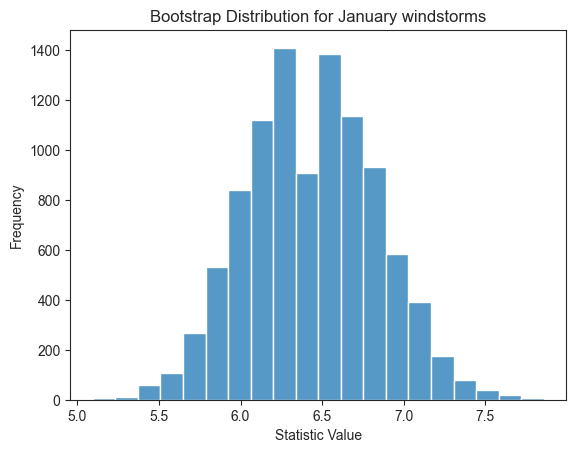

In [934]:
data = (storms_by_month[0],)
res = stats.bootstrap(data, np.mean, confidence_level=0.95, method='BCa')

fig, ax = plt.subplots()
sns.histplot(res.bootstrap_distribution, bins=20)
ax.set_title('Bootstrap Distribution for January windstorms')
ax.set_xlabel('Statistic Value')
ax.set_ylabel('Frequency')
plt.show()

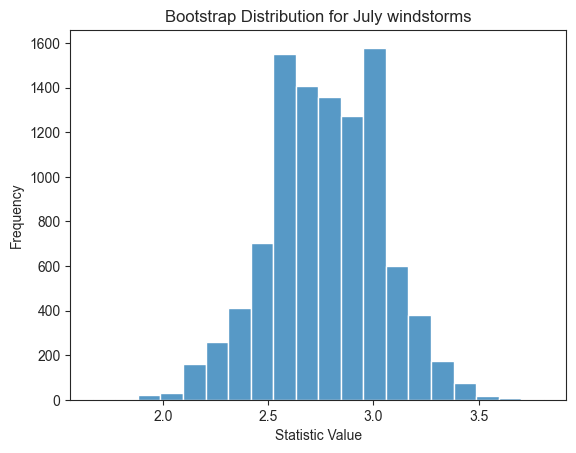

In [933]:
data = (storms_by_month[6],)
res = stats.bootstrap(data, np.mean, confidence_level=0.95, method='BCa')

fig, ax = plt.subplots()
sns.histplot(res.bootstrap_distribution, bins=20)
ax.set_title('Bootstrap Distribution for July windstorms')
ax.set_xlabel('Statistic Value')
ax.set_ylabel('Frequency')
plt.show()

##### windstorm durations

In [1018]:
for i in range(12):
    print(shapiro(durations_by_month[i]))

ShapiroResult(statistic=0.8867194652557373, pvalue=0.01950407214462757)
ShapiroResult(statistic=0.8481268286705017, pvalue=0.003944202326238155)
ShapiroResult(statistic=0.8179335594177246, pvalue=0.0012498002033680677)
ShapiroResult(statistic=nan, pvalue=1.0)
ShapiroResult(statistic=0.9079632759094238, pvalue=0.050063058733940125)
ShapiroResult(statistic=0.7700234651565552, pvalue=0.0002364434621995315)
ShapiroResult(statistic=nan, pvalue=1.0)
ShapiroResult(statistic=0.6840624809265137, pvalue=1.7542048226459883e-05)
ShapiroResult(statistic=0.9433466196060181, pvalue=0.2535831928253174)
ShapiroResult(statistic=0.9055509567260742, pvalue=0.04489107429981232)
ShapiroResult(statistic=0.8720871210098267, pvalue=0.010452456772327423)
ShapiroResult(statistic=0.87735915184021, pvalue=0.013053832575678825)


In [1030]:
monthly_duration_CIs = []
for i in range(12):
    data = durations_by_month[i]
    monthly_duration_CIs.append(stats.t.interval(0.95, df=len(data)-1, loc=np.nanmean(data), scale=stats.sem(data,nan_policy='omit')))
monthly_duration_CIs

[(30.65756942926845, 48.86624009454107),
 (25.929136318956328, 52.891498601678606),
 (19.6912551492498, 34.97620516821052),
 (19.683272442377277, 31.32256089095606),
 (8.81438690138295, 16.460216273220226),
 (6.838866002807057, 16.18732447338342),
 (4.240248675032764, 17.2914179916339),
 (5.589500256582142, 18.31049974341786),
 (10.108978936763863, 16.64102106323614),
 (19.294216530621632, 31.883561247156145),
 (20.21185726861913, 33.54052368376182),
 (27.027998600504063, 40.65454108203562)]

In [1032]:
monthly_dur_std = []
for i in months:
    monthly_dur_std.append(np.nanstd(durations_by_month[i-1]))
monthly_dur_std

[19.518954390511453,
 28.902555784075567,
 16.384844767956846,
 12.160923094931295,
 8.19601812400017,
 10.021167270424597,
 13.636079822172745,
 13.636394075643434,
 7.002083495676361,
 13.495265516395914,
 14.28778830843975,
 14.607099336726845]

In [1037]:
bootstrap_dur_CIs = []
for i in months:
    data = (durations_by_month[i-1],)
    res = stats.bootstrap(data, np.nanmean, confidence_level=0.95, method='BCa')
    bootstrap_dur_CIs.append(res.confidence_interval)
# bootstrap_dur_CIs

bootstrap_dur_stde = []
for i in months:
    data = (durations_by_month[i-1],)
    res = stats.bootstrap(data, np.nanmean, confidence_level=0.95, method='BCa')
    bootstrap_dur_stde.append(res.standard_error)
# bootstrap_dur_stde

##### windstorm wind speeds

In [1024]:
for i in range(12):
    print(shapiro(speeds_by_month[i]))

ShapiroResult(statistic=0.9555605053901672, pvalue=0.43158113956451416)
ShapiroResult(statistic=0.950498104095459, pvalue=0.3481009900569916)
ShapiroResult(statistic=0.8896957039833069, pvalue=0.02220105193555355)
ShapiroResult(statistic=nan, pvalue=1.0)
ShapiroResult(statistic=0.9652313590049744, pvalue=0.626952588558197)
ShapiroResult(statistic=0.844004213809967, pvalue=0.0033544753678143024)
ShapiroResult(statistic=nan, pvalue=1.0)
ShapiroResult(statistic=0.9504461884498596, pvalue=0.34731823205947876)
ShapiroResult(statistic=0.8907873034477234, pvalue=0.023286210373044014)
ShapiroResult(statistic=0.9836370944976807, pvalue=0.9676641225814819)
ShapiroResult(statistic=0.93231201171875, pvalue=0.15314777195453644)
ShapiroResult(statistic=0.8855189681053162, pvalue=0.018515925854444504)


In [1028]:
monthly_speed_CIs = []
for i in range(12):
    data = speeds_by_month[i]
    monthly_speed_CIs.append(stats.t.interval(0.95, df=len(data)-1, loc=np.nanmean(data), scale=stats.sem(data,nan_policy='omit')))
monthly_speed_CIs

[(6.140900826536147, 7.205844411559089),
 (5.867457502175485, 6.510428212110231),
 (5.670717436631679, 6.398511134796894),
 (5.403438541068054, 6.124761458931948),
 (5.31964073143224, 5.80671164952014),
 (5.204930774209764, 5.839319225790236),
 (5.1272346198979815, 5.628145380102021),
 (5.105811009535429, 5.506996133321714),
 (5.1544363911046736, 5.686037418419136),
 (5.740651655597544, 6.259115011069122),
 (5.9327371361663594, 6.40586286383364),
 (5.827473857356725, 6.449709475976609)]

In [1033]:
monthly_spd_std = []
for i in months:
    monthly_spd_std.append(np.nanstd(speeds_by_month[i-1]))
monthly_spd_std

[1.1415762109517689,
 0.6892384508654177,
 0.7801652444228993,
 0.7536502398327755,
 0.5221202145873358,
 0.6800386189576365,
 0.5233599338290046,
 0.4300541361468424,
 0.5698546805994787,
 0.5557716307045834,
 0.5071715376195992,
 0.6670112762902983]

In [1040]:
bootstrap_spd_CIs = []
for i in months:
    data = (speeds_by_month[i-1],)
    res = stats.bootstrap(data, np.nanmean, confidence_level=0.95, method='BCa')
    bootstrap_spd_CIs.append(res.confidence_interval)
# bootstrap_spd_CIs

bootstrap_spd_stde = []
for i in months:
    data = (speeds_by_month[i-1],)
    res = stats.bootstrap(data, np.nanmean, confidence_level=0.95, method='BCa')
    bootstrap_spd_stde.append(res.standard_error)
# bootstrap_spd_stde

##### time over threshold

In [1091]:
for i in range(12):
    print(shapiro(toth_by_month[i]))

ShapiroResult(statistic=0.8932899832725525, pvalue=0.025989895686507225)
ShapiroResult(statistic=0.9749589562416077, pvalue=0.8382530212402344)
ShapiroResult(statistic=0.9765365719795227, pvalue=0.8684002757072449)
ShapiroResult(statistic=0.9587199687957764, pvalue=0.4907248914241791)
ShapiroResult(statistic=0.9482731819152832, pvalue=0.3158504366874695)
ShapiroResult(statistic=0.9653589725494385, pvalue=0.6297638416290283)
ShapiroResult(statistic=0.981073796749115, pvalue=0.9398248791694641)
ShapiroResult(statistic=0.9498937129974365, pvalue=0.33907628059387207)
ShapiroResult(statistic=0.9802428483963013, pvalue=0.9287356734275818)
ShapiroResult(statistic=0.9095050096511841, pvalue=0.053689129650592804)
ShapiroResult(statistic=0.9523197412490845, pvalue=0.3765128552913666)
ShapiroResult(statistic=0.9758408665657043, pvalue=0.8553796410560608)


In [1093]:
monthly_toth_CIs = []
for i in range(12):
    data = toth_by_month[i]
    monthly_toth_CIs.append(stats.t.interval(0.95, df=len(data)-1, loc=np.mean(data), scale=stats.sem(data)))
monthly_toth_CIs

[(175.79864079953046, 245.75215285126325),
 (130.64036275252624, 176.96439915223567),
 (125.98515434539773, 172.54341708317367),
 (96.39504877842067, 133.9970147136428),
 (51.12806129860007, 76.7497164791777),
 (45.49310607430408, 64.06879868760069),
 (43.329632199416096, 55.63703446725057),
 (48.97240327424531, 62.62918402734199),
 (54.78555097092553, 73.01286172748718),
 (103.5187877499055, 129.0970852659675),
 (137.57203097215148, 180.2692388691184),
 (168.94052004078884, 218.5356704354017)]

In [1094]:
monthly_toth_std = []
for i in months:
    monthly_toth_std.append(np.std(toth_by_month[i-1]))
monthly_toth_std

[74.98731984855868,
 49.65748298115992,
 49.90856408937589,
 40.30777817751132,
 27.465372298314268,
 19.912386991687537,
 13.193034678237,
 14.639513534027541,
 19.538935810264377,
 27.41889464534791,
 45.76967033252696,
 53.16398414461143]

In [1096]:
bootstrap_toth_CIs = []
for i in months:
    data = (toth_by_month[i-1],)
    res = stats.bootstrap(data, np.mean, confidence_level=0.95, method='BCa')
    bootstrap_toth_CIs.append(res.confidence_interval)
# bootstrap_toth_CIs

bootstrap_toth_stde = []
for i in months:
    data = (toth_by_month[i-1],)
    res = stats.bootstrap(data, np.mean, confidence_level=0.95, method='BCa')
    bootstrap_toth_stde.append(res.standard_error)
# bootstrap_toth_stde

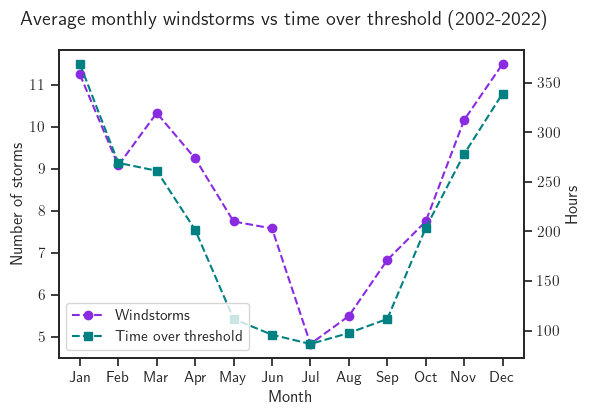

In [1719]:
fig, ax1 = plt.subplots(figsize=(6, 4))
ax2 = ax1.twinx()

ax1.plot(months, monthly_storms/12,'o--', color='blueviolet', label='Windstorms')
ax2.plot(months, toth_monthly/12,'s--', color='teal', label='Time over threshold')

ax1.set_xlabel("Month")
ax1.set_xticks(ticks = months,labels=month_names)
ax1.set_ylabel("Number of storms")
ax1.tick_params(axis="y")

ax2.set_ylabel("Hours")
ax2.tick_params(axis="y")
fig.legend(loc='lower left', bbox_to_anchor=(0.125, 0.11))

fig.suptitle("Average monthly windstorms vs time over threshold (2002-2022)")
fig.savefig('monthly_comparison.pdf')
plt.show()

### Implementing error bars on seasonal trends

In [1041]:
# Now we have monthly storm, duration and speed : monthly_std, monthly_storm_CIs, bootstrap_CIs, bootstrap_stde, monthly_spd_std, monthly_speed_CIs, bootstrap_dur_CIs, monthly_dur_std, bootstrap_toth_stde, monthly_toth_std, monthly_toth_CIs

In [243]:
storm_speeds_monthly

array([6.3756  , 6.195   , 5.6832  , 5.5466  , 5.3846  , 5.227525,
       5.3502  , 5.318   , 5.23795 , 5.969025, 6.0698  , 6.0793  ])

In [634]:
months = np.arange(1,13)
month_names = ["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"]
season = ["Winter","Winter","Spring","Spring","Spring","Summer","Summer","Summer","Fall","Fall","Fall","Winter"]

In [1689]:
np.std(storm_durations_mean)

4.868601065075555

In [1690]:
np.mean(storm_durations_mean)

31.91923212448168

In [1097]:
d_d = {'Month': months, 'Month name': month_names, 'Season': season, 'Windstorms': monthly_storms, 'Average windstorms': monthly_storms/21, 'Windstorm standard deviation': monthly_std, 'Windstorm average wind speed (m/s)': storm_speeds_monthly, 'Wind speed standard deviation': monthly_spd_std, 'Windstorm average duration (hours)': storm_durations_monthly, 'Duration standard deviation': monthly_dur_std, 'Time over threshold': toth_monthly, 'Time over threshold standard deviation': monthly_toth_std}

df_d = pd.DataFrame(data=d_d)
# df_d.to_csv(r'monthly_windstorms_data.csv', index=False)

df_d

,Month,Month name,Season,Windstorms,Average windstorms,Windstorm standard deviation,Windstorm average wind speed (m/s),Wind speed standard deviation,Windstorm average duration (hours),Duration standard deviation,Time over threshold,Time over threshold standard deviation
0,1,Jan,Winter,135.0,6.428571,1.788094,6.565400,1.141576,31.066667,19.518954,173.033333,74.987320
1,2,Feb,Winter,109.0,5.190476,1.942484,6.135350,0.689238,35.658333,28.902556,154.916667,49.657483
2,3,Mar,Spring,124.0,5.904762,1.796949,5.890100,0.780165,21.958333,16.384845,157.566667,49.908564
3,4,Apr,Spring,111.0,5.285714,2.163394,5.624112,0.753650,26.454167,12.160923,117.616667,40.307778
4,5,May,Spring,93.0,4.428571,1.916630,5.525650,0.522120,10.366667,8.196018,69.100000,27.465372
5,6,Jun,Summer,91.0,4.333333,2.416872,5.303300,0.680039,7.050000,10.021167,54.583333,19.912387
6,7,Jul,Summer,58.0,2.761905,1.230747,5.373150,0.523360,5.466667,13.636080,50.566667,13.193035
7,8,Aug,Summer,66.0,3.142857,1.958758,5.317650,0.430054,6.300000,13.636394,53.800000,14.639514
8,9,Sep,Fall,82.0,3.904762,1.659167,5.231400,0.569855,11.750000,7.002083,63.933333,19.538936
9,10,Oct,Fall,93.0,4.428571,1.706331,5.940175,0.555772,24.633333,13.495266,122.266667,27.418895


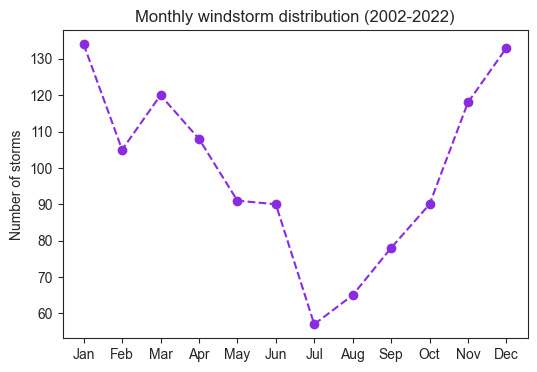

In [246]:
plt.figure(figsize=(6,4))
plt.plot(months, monthly_storms,'o--', color='blueviolet', label='Monthly observations')

# plt.xlabel(f"Month")
plt.ylabel("Number of storms")
# plt.xlim(1,12.5)
plt.xticks(ticks = months, labels=month_names)
# plt.legend(loc="best",prop={'size': 12}) 
plt.title(f"Monthly windstorm distribution (2002-2022)")
# plt.savefig(f'MFA_figures/monthly_windstorms.pdf')
plt.show()

In [247]:
storms_in_months = []

for i in range(len(months)):
    storms_in_months.append([months[i]]*int(monthly_storms[i]))
storms_in_months = np.concatenate(storms_in_months).ravel()

In [80]:
len(storms_in_months)

1183

Text(0.5, 1.0, 'Monthly windstorm distribution (2002-2022)')

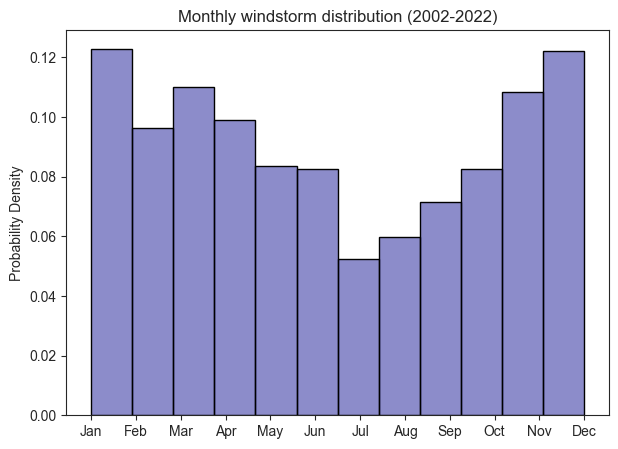

In [248]:
plt.figure(figsize=(7, 5))
sns.histplot(
    storms_in_months, kde=False, bins=12, color = 'darkblue',
    stat="density", kde_kws=dict(cut=3), label="Observations",
    alpha=.45, edgecolor='black') 
# plt.xlabel(f"Month")
# plt.axhline(storms_in_months.mean(), color='k', linestyle='dashed', linewidth=1)
plt.ylabel("Probability Density")
plt.xticks(ticks = months, labels=month_names)
plt.title(f"Monthly windstorm distribution (2002-2022)")
# plt.savefig(f'MFA_figures/monthly_windstorm_distribution.pdf')

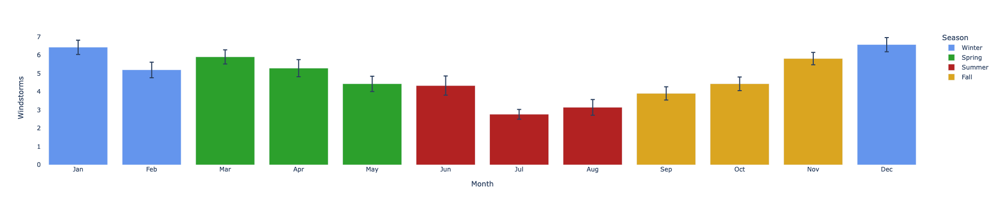

In [1334]:
import plotly.express as px
# std_error = df_d["Standard deviation"]/np.sqrt(21)
fig = px.bar(df_d, x='Month name', y='Average windstorms', color='Season', 
             color_discrete_map= {'Winter': 'cornflowerblue',
                                  'Spring': '#2CA02C',
                                  'Summer': 'firebrick',
                                  'Fall': 'goldenrod'}, 
             height=400, width=900,
             # error_y=std_error
             # error_y=CI_sizes
             # error_y=df_d["Standard deviation"]
             error_y=bootstrap_stde
             # error_y=BS_CI_sizes
            )
fig.update_layout(
    plot_bgcolor="white",
    xaxis_categoryarray=df_d['Month name'],
    xaxis_categoryorder="array",
    xaxis_title="Month",
    yaxis_title="Windstorms"
)
# margin=dict(t=10,l=10,b=10,r=10,
fig.show()

In [1645]:
from scipy.stats import chisquare

# observed frequencies
observed_frequencies = df_d['Windstorms']

# number of observations
n = sum(observed_frequencies)
N = len(observed_frequencies)

# expected frequencies under the null hypothesis of a uniform distribution
expected_frequencies = [n/N for i in range(N)]

# compute the chi-squared statistic
chi_squared_statistic, p_value = chisquare(observed_frequencies, f_exp=expected_frequencies)

# if the p-value is less than the significance level (e.g. 0.05),
# we can reject the null hypothesis and conclude that the distribution is not uniform
if p_value < 0.05:
    print("The distribution is not uniform")
else:
    print("The distribution is uniform")

The distribution is not uniform


In [1646]:
p_value

5.500522435078387e-11

In [1638]:
print(scipy.stats.kstest(df_d['Average windstorms'], stats.uniform(loc=0.0, scale=5.0).cdf))

KstestResult(statistic=0.6166666666666666, pvalue=6.362494671580185e-05, statistic_location=4.333333333333333, statistic_sign=-1)


In [1634]:
print(scipy.stats.kstest(df_d['Windstorms'], stats.uniform(loc=0.0, scale=100.0).cdf))

KstestResult(statistic=0.66, pvalue=1.1673591064158014e-05, statistic_location=91.0, statistic_sign=-1)


In [1637]:
np.mean(df_d['Average windstorms'])

4.84920634920635

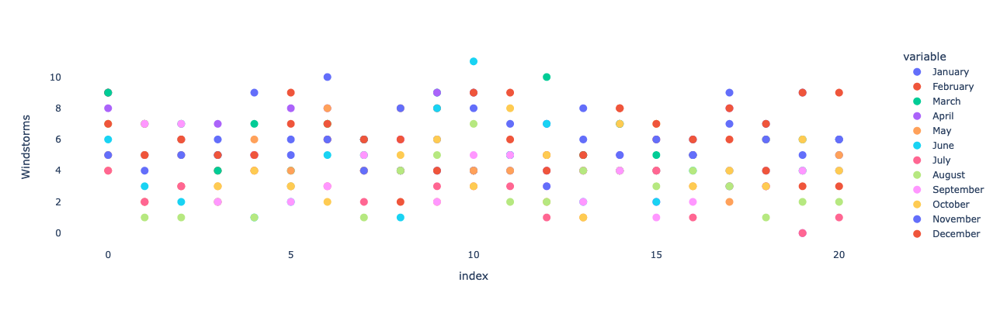

In [1131]:
#dot plot attempt, deciding against it for now
fig = px.scatter(df_d_storms, y=[df_d_storms.January,df_d_storms.February,df_d_storms.March,df_d_storms.April,df_d_storms.May,df_d_storms.June,df_d_storms.July,df_d_storms.August,df_d_storms.September,df_d_storms.October,df_d_storms.November,df_d_storms.December], height=400, width=800)
fig.update_traces(marker_size=10)

fig.update_layout(
    plot_bgcolor="white",
    xaxis_categoryarray=df_d['Month name'],
    xaxis_categoryorder="array",
    # xaxis_title="Month",
    yaxis_title="Windstorms"
)

fig.show()

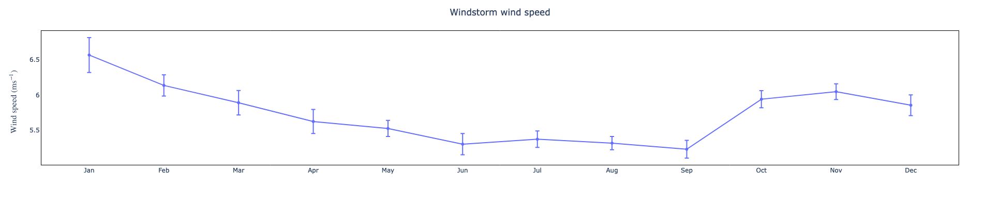

In [1337]:
plt.rcParams['text.usetex'] = True
fig = px.line(df_d, x="Month name", y="Windstorm average wind speed (m/s)", height=400, width=600, markers=True, error_y=bootstrap_spd_stde)

fig.update_layout(
    plot_bgcolor="white",
    xaxis_title=" ",
    yaxis_title=r"$\text{Wind speed (ms}^{-1})$",
    title_text='Windstorm wind speed', title_x=0.5 
)

fig.update_xaxes(
    mirror=True,
    showline=True,
    linecolor='black',
    # gridcolor='lightgrey'
)
fig.update_yaxes(
    mirror=True,
    showline=True,
    linecolor='black',
    # gridcolor='lightgrey'
)
fig.show()

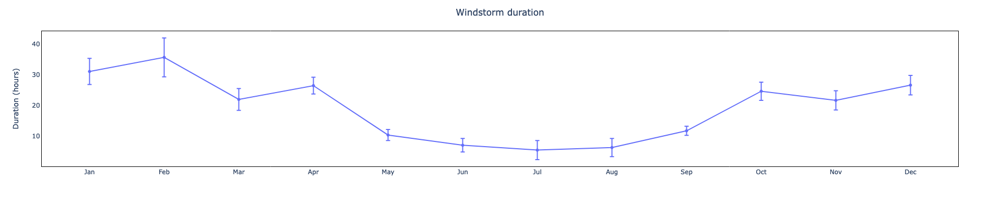

In [1079]:
fig = px.line(df_d, x="Month name", y="Windstorm average duration (hours)", height=400, width=600, markers=True, error_y=bootstrap_dur_stde)

fig.update_layout(
    plot_bgcolor="white",
    xaxis_title=" ",
    yaxis_title="Duration (hours)",
    title_text='Windstorm duration', title_x=0.5 
)

fig.update_xaxes(
    mirror=True,
    showline=True,
    linecolor='black',
)
fig.update_yaxes(
    mirror=True,
    showline=True,
    linecolor='black',
)
fig.show()

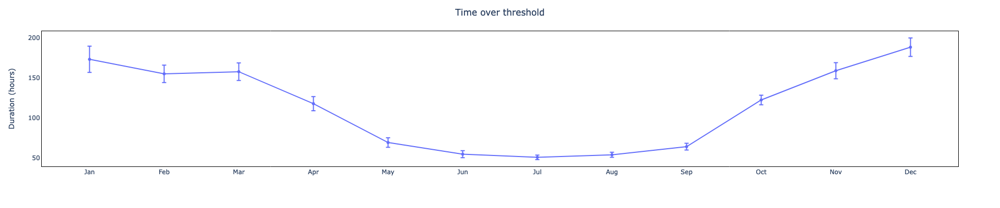

In [1100]:
fig = px.line(df_d, x="Month name", y="Time over threshold", height=400, width=600, markers=True, error_y=bootstrap_toth_stde)

fig.update_layout(
    plot_bgcolor="white",
    xaxis_title=" ",
    yaxis_title="Duration (hours)",
    title_text='Time over threshold', title_x=0.5 
)

fig.update_xaxes(
    mirror=True,
    showline=True,
    linecolor='black',
)
fig.update_yaxes(
    mirror=True,
    showline=True,
    linecolor='black',
)
fig.show()

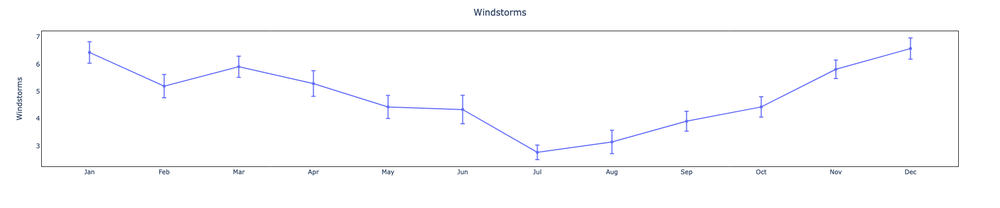

In [1102]:
fig = px.line(df_d, x="Month name", y="Average windstorms", height=400, width=600, markers=True, error_y=bootstrap_stde)

fig.update_layout(
    plot_bgcolor="white",
    xaxis_title=" ",
    yaxis_title="Windstorms",
    title_text='Windstorms', title_x=0.5 
)

fig.update_xaxes(
    mirror=True,
    showline=True,
    linecolor='black',
)
fig.update_yaxes(
    mirror=True,
    showline=True,
    linecolor='black',
)
fig.show()

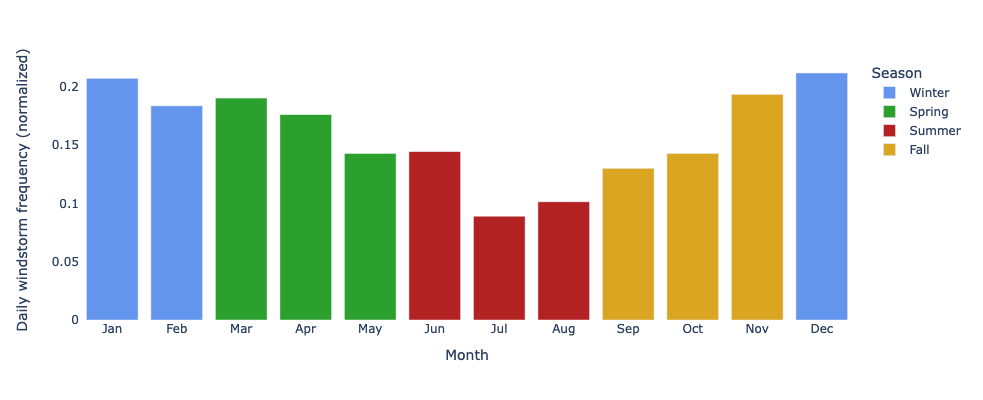

In [2543]:
# Normalized by days in the month 

average_monthly_ws = df_d.Windstorms/21

average_daily_normalized_ws = np.zeros(12)
average_daily_normalized_ws[0] = average_monthly_ws[0]/31
average_daily_normalized_ws[1] = average_monthly_ws[1]/28.25
average_daily_normalized_ws[2] = average_monthly_ws[2]/31
average_daily_normalized_ws[3] = average_monthly_ws[3]/30
average_daily_normalized_ws[4] = average_monthly_ws[4]/31
average_daily_normalized_ws[5] = average_monthly_ws[5]/30
average_daily_normalized_ws[6] = average_monthly_ws[6]/31
average_daily_normalized_ws[7] = average_monthly_ws[7]/31
average_daily_normalized_ws[8] = average_monthly_ws[8]/30
average_daily_normalized_ws[9] = average_monthly_ws[9]/31
average_daily_normalized_ws[10] = average_monthly_ws[10]/30
average_daily_normalized_ws[11] = average_monthly_ws[11]/31
average_daily_normalized_ws

fig = px.bar(df_d, x='Month name', y=average_daily_normalized_ws, color='Season', 
             color_discrete_map= {'Winter': 'cornflowerblue',
                                  'Spring': '#2CA02C',
                                  'Summer': 'firebrick',
                                  'Fall': 'goldenrod'}, 
             height=400, width=900
             # error_y=std_error
             # error_y=CI_sizes
             # error_y=df_d["Standard deviation"]
             # error_y=bootstrap_stde
             # error_y=BS_CI_sizes
            )
fig.update_layout(
    plot_bgcolor="white",
    xaxis_categoryarray=df_d['Month name'],
    xaxis_categoryorder="array",
    xaxis_title="Month",
    yaxis_title="Daily windstorm frequency (normalized)"
)
# margin=dict(t=10,l=10,b=10,r=10,
fig.show()

### Violin plots!

In [1168]:
month_names == list(df_d_storms)

# d_d_storms, x='Month name', y='Average windstorms'

True

In [1177]:
for item in list(df_d_storms):
    print(item)

Jan
Feb
Mar
Apr
May
Jun
Jul
Aug
Sep
Oct
Nov
Dec


In [1273]:
df_d_storms

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
0,9,9,9,8,4,6,4,7,5,5,5,7
1,5,2,7,5,7,3,2,1,7,5,4,5
2,6,3,7,5,6,2,3,1,7,5,5,6
3,6,4,4,7,3,5,2,2,2,3,5,5
4,5,4,7,5,6,1,5,1,5,4,9,5
5,5,7,4,8,4,2,3,3,2,3,6,9
6,10,6,7,8,8,5,3,7,3,2,6,7
7,6,6,5,4,4,6,2,1,5,4,4,6
8,4,2,4,6,8,1,4,4,6,5,8,6
9,6,8,9,9,2,8,3,5,2,6,4,4


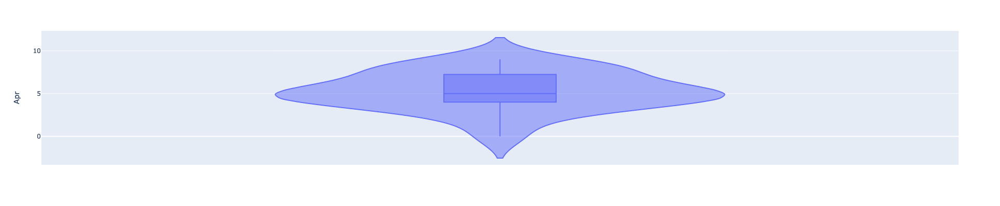

In [1268]:
fig = px.violin(df_d_storms, y='Apr',box=True, height=400, width=700)
fig.show()

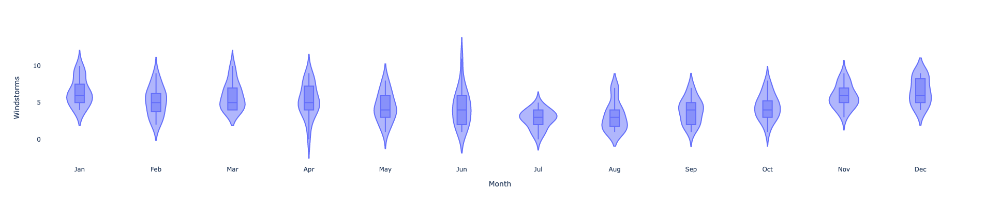

In [1330]:
# my_pal = {"Jan": "cornflowerblue", "Feb": "cornflowerblue", "Mar": "#2CA02C", "Apr": "#2CA02C", "May": "#2CA02C", "Jun": "firebrick", "Jul": "firebrick", "Aug": "firebrick", "Sep": "goldenrod", "Oct": "goldenrod", "Nov": "goldenrod", "Dec": "cornflowerblue"}
# my_pal2 = ["cornflowerblue", "cornflowerblue", "#2CA02C", "#2CA02C", "#2CA02C", "firebrick", "firebrick", "firebrick", "goldenrod", "goldenrod", "goldenrod", "cornflowerblue"]

fig = px.violin(data_frame=df_d_storms,box=True,
                  height=400, width=800)
# points='all',  to add datapoints
fig.update_layout(
    plot_bgcolor="white",
    xaxis_title="Month",
    yaxis_title="Windstorms"
    # title_text='Windstorms', title_x=0.5 
)
    
fig.show()
# fig.write_image("violin.pdf")
# fig.write_image("violin.pdf", engine="kaleido")

In [ ]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=2, cols=1)

fig.add_trace(px.violin(data_frame=df_d_storms,box=True), row=1, col=1)

fig.add_trace(px.bar(df_d, x='Month name', y='Average windstorms', color='Season', 
             color_discrete_map= {'Winter': 'cornflowerblue',
                                  'Spring': '#2CA02C',
                                  'Summer': 'firebrick',
                                  'Fall': 'goldenrod'}, 
             error_y=bootstrap_stde), row=2, col=1)


fig.update_layout(plot_bgcolor="white", height=600, width=600, title_text="Stacked Subplots")
fig.show()

<Axes: >

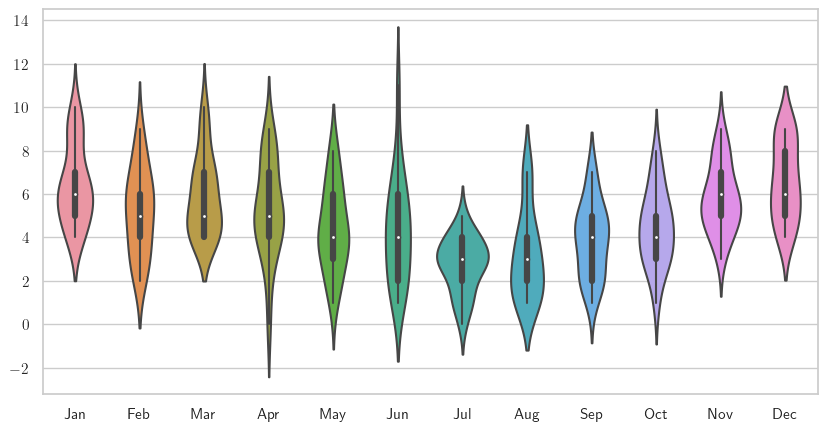

In [1262]:
fig, axes = plt.subplots(figsize=(10,5))
sns.set(style="whitegrid")
sns.violinplot(data=df_d_storms, ax = axes, orient ='v')

### Continued

In [249]:
d_d = {'Storms': storms_in_months}

df_d = pd.DataFrame(data=d_d)
df_d.to_csv(r'monthly_distributions.csv', index=False)

df_d

,Storms
0,1
1,1
2,1
3,1
4,1
...,...
1184,12
1185,12
1186,12
1187,12


In [250]:
dfm = {'Month': months, 'Number of storms': monthly_storms}
dfm = pd.DataFrame(data=dfm)
# dfm = dfm.set_index('Month')
dfm

,Month,Number of storms
0,1,134.0
1,2,105.0
2,3,120.0
3,4,108.0
4,5,91.0
5,6,90.0
6,7,57.0
7,8,65.0
8,9,78.0
9,10,90.0


In [259]:
dfm = {'Month': months, 'Number of storms': np.array(monthly_storms)/len(years)}
dfm = pd.DataFrame(data=dfm)
# dfm = dfm.set_index('Month')
dfm

,Month,Number of storms
0,1,6.380952
1,2,5.000000
2,3,5.714286
3,4,5.142857
4,5,4.333333
5,6,4.285714
6,7,2.714286
7,8,3.095238
8,9,3.714286
9,10,4.285714


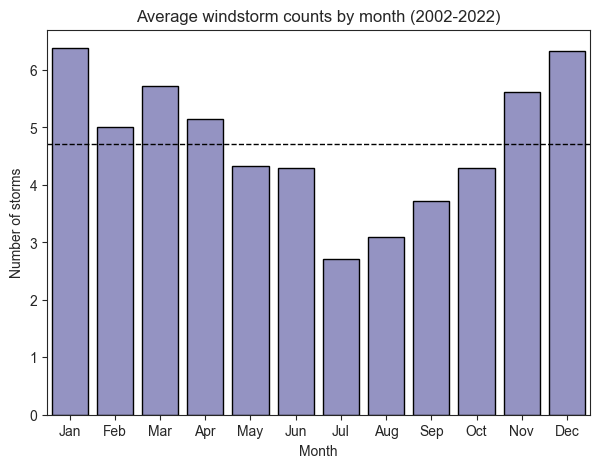

In [261]:
plt.figure(figsize=(7, 5))
sns.barplot(
    data=dfm, x="Month", y="Number of storms", 
    label="Observations", color='#8c8bca', edgecolor='black') 
# plt.xlabel(f"Month")
plt.axhline((np.array(monthly_storms)/len(years)).mean(), color='k', linestyle='dashed', linewidth=1)
plt.xticks(ticks = np.arange(0,12,1), labels=month_names)
plt.title(f"Average windstorm counts by month (2002-2022)")
plt.savefig(f'avg_monthly_windstorm_distribution.pdf')

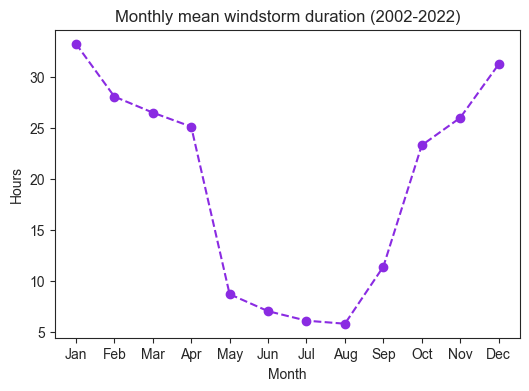

In [265]:
plt.figure(figsize=(6,4))
plt.plot(months, storm_durations_monthly,'o--', color='blueviolet', label='Monthly observations')
# plt.axhline(storm_durations_monthly.mean(), color='k', linestyle='dashed', linewidth=1)
plt.xlabel(f"Month")
plt.ylabel("Hours")
plt.xticks(ticks = months, labels=month_names)
# plt.legend(loc="best",prop={'size': 12}) 
plt.title(f"Monthly mean windstorm duration (2002-2022)")
plt.savefig(f'fin_monthly_windstorm_durations.pdf')
plt.show()

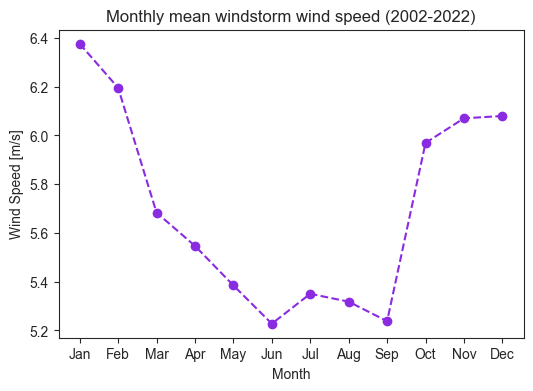

In [264]:
plt.figure(figsize=(6,4))
plt.plot(months, storm_speeds_monthly,'o--', color='blueviolet', label='Monthly observations')
# plt.axhline(storm_speeds_monthly.mean(), color='k', linestyle='dashed', linewidth=1)
plt.xlabel(f"Month")
plt.ylabel("Wind Speed [m/s]")
plt.xticks(ticks = months, labels=month_names)
# plt.legend(loc="best",prop={'size': 12}) 
plt.title(f"Monthly mean windstorm wind speed (2002-2022)")
plt.savefig(f'fin_monthly_windstorm_speeds.pdf')
plt.show()

In [518]:
month_abbrev = ['J','F','M','A','M','J','J','A','S','O','N','D']
months

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

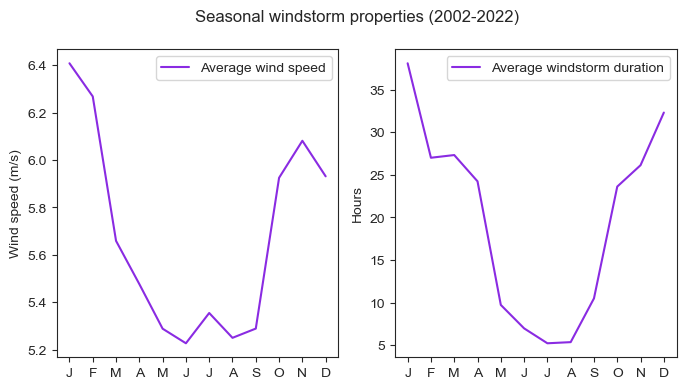

In [658]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
fig.suptitle('Seasonal windstorm properties (2002-2022)')
ax1.plot(storm_speeds_monthly, color='blueviolet', label='Average wind speed')
ax1.legend(loc='upper right')
ax1.set_xticks(ticks = np.arange(0,12), labels = month_abbrev)
ax1.set_ylabel("Wind speed (m/s)")

ax2.plot(storm_durations_monthly, color='blueviolet', label='Average windstorm duration')
ax2.set_xticks(ticks = np.arange(0,12), labels = month_abbrev)
ax2.set_ylabel("Hours")
ax2.legend(loc='upper right')

fig.savefig('windstorm_property_comparison.pdf')

### Break into full time series - prep for deseasonalizing

In [91]:
subset = ['Year', 'DOY', 'MST', f'Avg Wind Speed @ {height} [m/s]', f'Avg Wind Direction @ {height} [deg]', 'Temperature @ 2m [deg C]', 'Relative Humidity [%]']
yearly_monthly_storms = [] 

for i in np.arange(2002,2023,1): 
    year = i

    df = pd.read_csv(f'/Users/serena/Documents/Research/Data/{year}_data.csv', usecols=lambda x: x in subset)
    df.insert(2, 'Date (MM/DD/YYYY)', df['DOY'].apply(doy_to_date, args=(year,))) 
    df = df.replace(-99999.0, np.nan)
    df['Date (MM/DD/YYYY)'] = pd.to_datetime(df['Date (MM/DD/YYYY)'], format='%m/%d/%Y') # convert date column to DateTime
    df.set_index('Date (MM/DD/YYYY)')
    
    sort = list(df.groupby(df['Date (MM/DD/YYYY)'].dt.month))
    monthly_data = []
    
    for k in range(len(sort)): #12
        monthly_data.append(sort[k][1])    
    
    monthly_storms = np.zeros(12)

    for j in range(len(monthly_data)): #12
        monthly_data[j] = monthly_data[j].reset_index()
        monthly_data[j] = monthly_data[j].rename(columns={'index': 'Overall index'})
        storms_with_lulls = [storm                                                       
                     for storm in                                                
                     WindstormWithLulls.storms_by_threshold(monthly_data[j], 4.5, 12*60, [247, 337])         
                     if storm.duration >= 60 and np.median(storm.speed) >= 4.5 and np.mean(storm.speed) >= 4.5]   
        
        # monthly_storms[j] = len(storms_with_lulls)    
        yearly_monthly_storms.append(len(storms_with_lulls))
    
    print(f'Finished {year}')

Finished 2002
Finished 2003
Finished 2004
Finished 2005
Finished 2006
Finished 2007
Finished 2008
Finished 2009
Finished 2010
Finished 2011
Finished 2012
Finished 2013
Finished 2014
Finished 2015
Finished 2016
Finished 2017
Finished 2018
Finished 2019
Finished 2020
Finished 2021
Finished 2022


In [89]:
full_months = np.arange(1,253,1)
len(full_months)
# len(yearly_monthly_storms)

252

In [266]:
d_d = {'Month': full_months, 'Windstorms': yearly_monthly_storms}

df_d = pd.DataFrame(data=d_d)
df_d.to_csv(r'full_monthly_storms.csv', index=False)

df_d

,Month,Windstorms
0,1,9
1,2,9
2,3,10
3,4,8
4,5,5
...,...,...
247,248,2
248,249,5
249,250,4
250,251,6


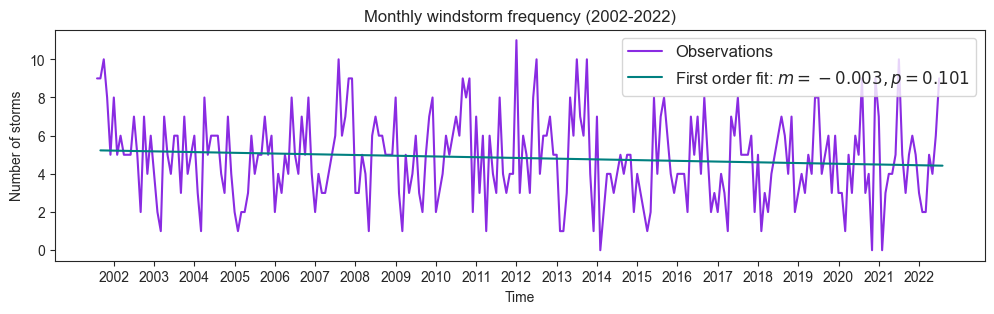

Slope of best fit: -0.0031895755956036615


In [92]:
y = yearly_monthly_storms
x = np.arange(len(y))
x = sm.add_constant(x)

mod = sm.OLS(y, x)
result = mod.fit()

plt.figure(figsize=(12,3)) # alternate colors with every other year for visibility? https://stackoverflow.com/questions/37787632/different-color-for-line-depending-on-corresponding-values-in-pyplot
plt.plot(yearly_monthly_storms,'-', color='blueviolet', label='Observations')

trend = np.polyfit(full_months,yearly_monthly_storms, 1)
trendpoly = np.poly1d(trend) 

plt.plot(full_months,trendpoly(full_months), color='teal',label=f'First order fit: $m={np.round(trend[0],3)}, p={np.round(result.pvalues[1],3)}$')
plt.xlabel(f"Time")
plt.ylabel("Number of storms")
plt.xticks(ticks = (years-2002)*12+5, labels=years)
plt.legend(loc="best",prop={'size': 12}) 
plt.title(f"Monthly windstorm frequency (2002-2022)")
# plt.savefig(f'full_monthly_windstorms.pdf',bbox_inches='tight')
plt.show()
print(f'Slope of best fit: {trend[0]}')

In [98]:
scipy.stats.spearmanr(full_months, yearly_monthly_storms) 

SignificanceResult(statistic=-0.11087595129305708, pvalue=0.07895685001727085)

In [94]:
y = yearly_monthly_storms
x = np.arange(len(y))
x = sm.add_constant(x)

mod = sm.OLS(y, x)
result = mod.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     2.713
Date:                Fri, 03 Mar 2023   Prob (F-statistic):              0.101
Time:                        12:13:23   Log-Likelihood:                -559.37
No. Observations:                 252   AIC:                             1123.
Df Residuals:                     250   BIC:                             1130.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.2297      0.281     18.618      0.0

In [95]:
mod = sm.GLS(y, x)
result = mod.fit()
print(result.summary())

                            GLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.011
Model:                            GLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     2.713
Date:                Fri, 03 Mar 2023   Prob (F-statistic):              0.101
Time:                        12:13:23   Log-Likelihood:                -559.37
No. Observations:                 252   AIC:                             1123.
Df Residuals:                     250   BIC:                             1130.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.2297      0.281     18.618      0.0

In [96]:
x = full_months
y = yearly_monthly_storms

# Fit the Negative Binomial Regression model
nb_model = sm.GLM(y, sm.add_constant(x), family=sm.families.NegativeBinomial())
nb_results = nb_model.fit()

# Print the summary of the model
print(nb_results.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                  252
Model:                            GLM   Df Residuals:                      250
Model Family:        NegativeBinomial   Df Model:                            1
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -673.05
Date:                Fri, 03 Mar 2023   Deviance:                       58.422
Time:                        12:22:18   Pearson chi2:                     44.8
No. Iterations:                     4   Pseudo R-squ. (CS):           0.001891
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.6563      0.138     11.970      0.0

In [97]:
x = full_months
y = yearly_monthly_storms

# Fit the Poisson Regression model
p_model = sm.GLM(y, sm.add_constant(x), family=sm.families.Poisson())
p_results = p_model.fit()

# Print the summary of the model
print(p_results.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                  252
Model:                            GLM   Df Residuals:                      250
Model Family:                 Poisson   Df Model:                            1
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -557.25
Date:                Fri, 03 Mar 2023   Deviance:                       281.17
Time:                        12:23:57   Pearson chi2:                     260.
No. Iterations:                     4   Pseudo R-squ. (CS):            0.01109
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.6571      0.056     29.413      0.0

In [100]:
np.mean(yearly_monthly_storms)

4.829365079365079

In [102]:
(np.std(yearly_monthly_storms))**2

5.014534517510709

In [112]:
import statsmodels.api as sm
import scipy.stats as stats

# Fit Poisson GLM model
model = sm.GLM(y, x, family=sm.families.Poisson()).fit()

# Calculate Pearson chi-square test statistic and p-value
pearson_chi2 = model.pearson_chi2
pearson_df = model.df_resid
pearson_p = 1 - stats.chi2.cdf(pearson_chi2, pearson_df)

# Print results
if pearson_p < 0.05:
    print(f"Observed deviance is significantly larger than expected, indicating overdispersion (Pearson chi-square test: chi2 = {pearson_chi2}, df = {pearson_df}, p = {pearson_p})")
else:
    print(f"Observed deviance is not significantly different from expected (Pearson chi-square test: chi2 = {pearson_chi2}, df = {pearson_df}, p = {pearson_p})")


Observed deviance is significantly larger than expected, indicating overdispersion (Pearson chi-square test: chi2 = 1523.11324511997, df = 251, p = 0.0)


In [269]:
storms_df = {'Month': np.concatenate([months]*21).ravel(), 'Year': np.repeat((years), 12), 'Windstorms': yearly_monthly_storms}
storms_df = pd.DataFrame(data=storms_df)
storms_df

,Month,Year,Windstorms
0,1,2002,9
1,2,2002,9
2,3,2002,10
3,4,2002,8
4,5,2002,5
...,...,...,...
247,8,2022,2
248,9,2022,5
249,10,2022,4
250,11,2022,6


### FFT

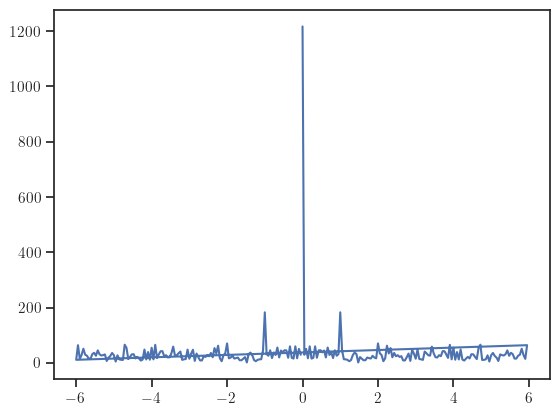

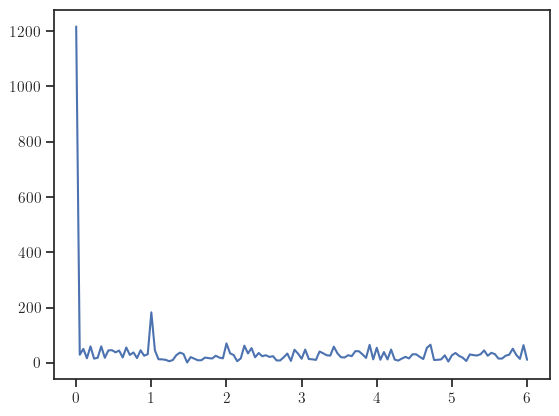

In [2160]:
from scipy.fft import fft, fftfreq

# Number of samples in normalized_tone
N = len(yearly_monthly_storms)

yf = fft(yearly_monthly_storms)
xf = fftfreq(N, 1 / 12)

plt.plot(xf, np.abs(yf))
plt.show()

from scipy.fft import rfft, rfftfreq

# Note the extra 'r' at the front
yf = rfft(yearly_monthly_storms)
xf = rfftfreq(N, 1 / 12)

plt.plot(xf, np.abs(yf))
plt.show()

In [2264]:
def create_normalized_redfit(data_length,Te):
    freq = np.arange(0,(data_length/2)+1,1)/float(data_length) # to Nyquist
    red_fit = (2 * Te)/(1 + ((2*np.pi*freq)**2)*(Te**2)) # After Hartmann 6.64, 6.91
    return red_fit/np.sum(red_fit)
def create_f_bounds(alpha,dof,red_fit_n):
    f_ratio = stats.f.ppf(alpha,dof,200) # Note: 200 = large degree of freedom for red noise
    return f_ratio*red_fit_n

## Calculate the power spectrum of red noise with lag1_r to use for significance testing
alpha = 0.95 ## set statistical significance level
data = yearly_monthly_storms
var_str = "Windstorm events"

### step 1: calculate lag-1 autocorrelation (lag1_r, rho) and the associated p value (lag1_p)
lag1_r,lag1_p = stats.pearsonr(data[0:len(data)-1],data[1:len(data)])

### step 2: Calculate e-folding time for a red-noise process with this lag-1 autocorrelation
Te = -1./np.log(lag1_r) # After Hartman 6.62 with delta t = 1
print(var_str,'lag-1 autocorrelation =',round(lag1_r,2),'and Te =',round(Te,0))

## calculate the power spectrum of red noise with lag1_r to use for significance testing
red_fit_n = create_normalized_redfit(len(data),Te)
dof_entirewindow=2 ### note dof=2 because using whole record for FFT with no chunking
f_bounds = create_f_bounds(alpha,dof_entirewindow,red_fit_n)  ## using f-test for variance, see function

## multiple DOF by 1.2 to account for extra smoothing Hanning (Barnes Ch. 4 Eq. 59)
f_bounds_hanning = create_f_bounds(alpha,dof_entirewindow*1.2,red_fit_n)  

## Method #1: Numpy Method - Calculate Power Spectrum
freq = np.fft.rfftfreq(len(data),d=1.)  ### 
#print(freq)
A = np.fft.rfft(data) ### r = real
ps = (np.abs(A)**2)/2.
ps_n = (np.abs(A)**2)/np.sum(np.abs(A)**2)  ## normalizing - calculate percent of the total  

Windstorm events lag-1 autocorrelation = 0.18 and Te = 1.0


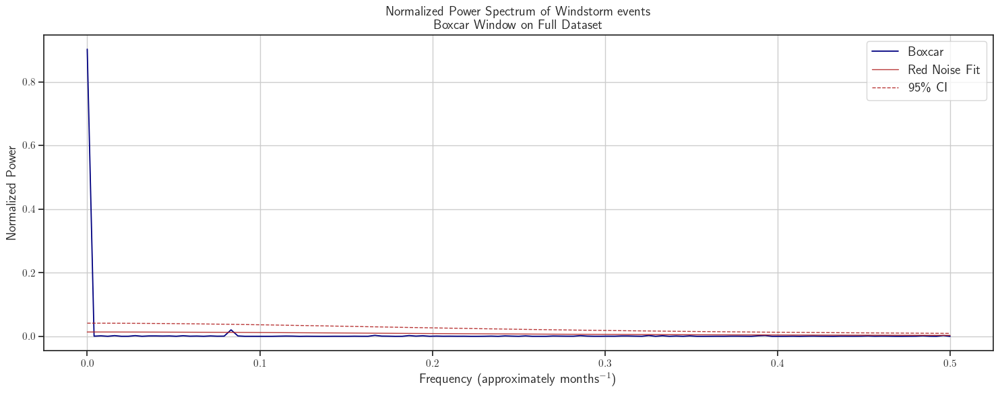

In [2244]:
### Plot the results -- replicate a figure from a paper in Science that has 6000+ citations (Petit et al. 1999)
fig = plt.figure(figsize=(15,6))
method_str = "Boxcar Window on Full Dataset"
plt.plot(freq,ps_n, color='navy', lw=1.3, label='Boxcar')
plt.plot(freq,red_fit_n, color='firebrick', lw=1, alpha=0.9, label='Red Noise Fit') # freq plots 0...0.5
plt.plot(freq,f_bounds, color='firebrick', lw=1, ls='--', alpha=0.9, label=str(int(alpha*100))+'\% CI')
# plt.ylim(0.0,0.3)
# plt.xlim(0.0,0.06)
plt.xlabel("Frequency (approximately months$^{-1}$)",fontsize=14)
plt.ylabel("Normalized Power",fontsize=14)
plt.title("Normalized Power Spectrum of "+var_str+"\n"+method_str,fontsize=14)
plt.legend(loc='upper right',fontsize=14)
plt.grid()
fig.tight_layout()

In [2252]:
# Find the significant spectral peaks
for i in range(len(ps_n)):
    if (ps_n[i] - f_bounds[i]) > 0:
        print('Found a spectral peak that exceeds red noise:')
        print('exceeds by...',ps_n[i]-f_bounds[i])
        print('at frequency....',freq[i])
        # print('which in years is...',(1.0/(freq[i]))/12.0)

Found a spectral peak that exceeds red noise:
exceeds by... 0.8615803236433132
at frequency.... 0.0


In [2250]:
print('* For reference *')
print('monthly in frequency:',round(1/1,3))
print('seasonally in frequency:',round(1/3,3))
print('yearly in frequency:',round(1/12,3))
print('every 4 years in frequency:',round(1/(12*4),3))
print('every 8 years in frequency:',round(1/(12*8),5))  

* For reference *
monthly in frequency: 1.0
seasonally in frequency: 0.333
yearly in frequency: 0.083
every 4 years in frequency: 0.021
every 8 years in frequency: 0.01042


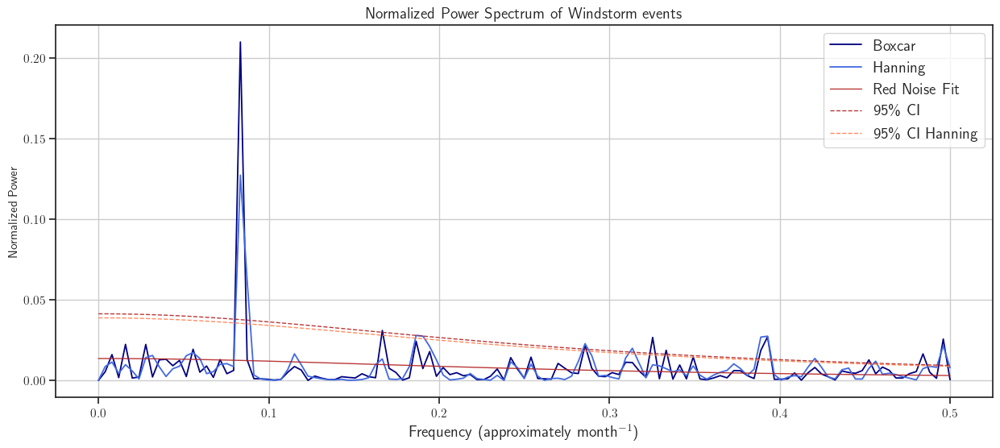

In [2246]:
import scipy.signal as signal #for signal processing

# Scipy Method... Compare Boxcar (sqaure) Window with a Hanning (tapered) Window.

## Use Boxcar Window
f,Pxx = signal.periodogram(data,fs=1.,window='boxcar',nfft=None,return_onesided=True,scaling='spectrum')
Pxx_n = Pxx/np.sum(Pxx)

## Use Hanning Window
f_h,Pxx_h = signal.periodogram(data,fs=1.,window='hann',nfft=None,return_onesided=True,scaling='spectrum')
Pxx_h_n = Pxx_h/np.sum(Pxx_h)

fig = plt.figure(figsize=(15,6))
plt.plot(f,Pxx_n, color='navy', lw=1.3, label='Boxcar')
plt.plot(f_h,Pxx_h_n, color='royalblue', lw=1.3, label='Hanning')
plt.plot(freq,red_fit_n, color='firebrick', lw=1, alpha=0.9, label='Red Noise Fit')
plt.plot(freq,f_bounds, color='firebrick', lw=1, ls='--', alpha=0.9, label=str(int(alpha*100))+'\% CI')
plt.plot(freq,f_bounds_hanning, color='coral', lw=1, ls='--', alpha=0.9, label=str(int(alpha*100))+'\% CI Hanning')
# plt.ylim(0.0,0.3)
# plt.xlim(0.0,0.06)
plt.xlabel("Frequency (approximately month$^{-1}$)",fontsize=14)
plt.ylabel("Normalized Power",fontsize=11)
plt.title("Normalized Power Spectrum of "+var_str,fontsize=14)
plt.legend(loc='upper right',fontsize=14)
plt.grid()

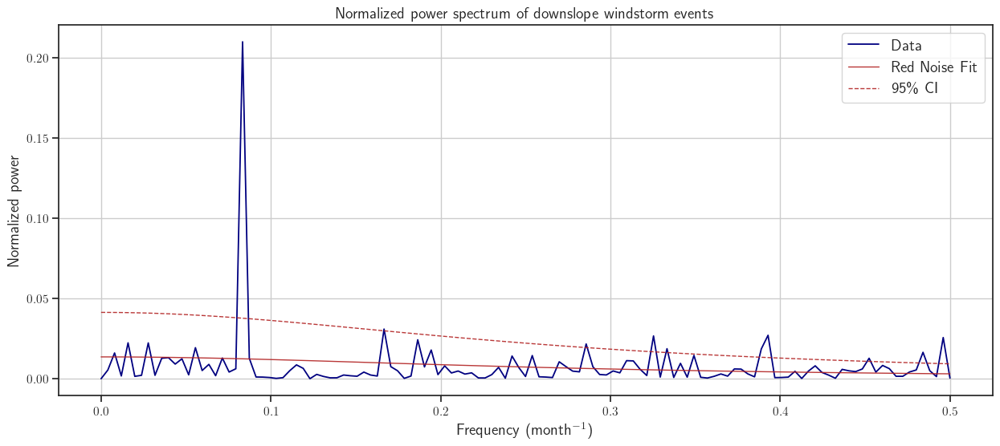

In [2269]:
## Use Boxcar Window
alpha_level = 0.95 ## set statistical significance level

f,Pxx = signal.periodogram(data,fs=1.,window='boxcar',nfft=None,return_onesided=True,scaling='spectrum')
Pxx_n = Pxx/np.sum(Pxx)

fig = plt.figure(figsize=(15,6))
plt.plot(f,Pxx_n, color='navy', lw=1.3, label='Data')
plt.plot(freq,red_fit_n, color='firebrick', lw=1, alpha=0.9, label='Red Noise Fit')
plt.plot(freq,f_bounds, color='firebrick', lw=1, ls='--', alpha=0.9, label=str(int(alpha_level*100))+'\% CI')
# plt.ylim(0.0,0.3)
# plt.xlim(0.0,0.06)
plt.xlabel("Frequency (month$^{-1}$)",fontsize=14)
plt.ylabel("Normalized power",fontsize=14)
plt.title("Normalized power spectrum of downslope windstorm events",fontsize=14)
plt.legend(loc='upper right',fontsize=14)
plt.grid()
plt.savefig('spectral_analysis.pdf',bbox_inches='tight')
# power over total power, 20% of total variance, 
# also plot in total power units esp for comparing to other datasets
# barnes notes for explaining, asking amplitude of sin/cos wave what's the reg coef at each frequency to recreate the data
# pair this plot with the data

In [2255]:
# Find the significant spectral peaks
for i in range(len(Pxx)):
    if (Pxx[i] - f[i]) > 1e-03:
        print('\nFound a spectral peak that exceeds red noise:')
        print('exceeds by...',np.round(Pxx[i]-f[i],5))
        print('at frequency....',np.round(freq[i],5))
        print('which in years is...',np.round((1.0/(freq[i]))/12.0,2))


Found a spectral peak that exceeds red noise:
exceeds by... 0.0231
at frequency.... 0.00397
which in years is... 21.0

Found a spectral peak that exceeds red noise:
exceeds by... 0.07247
at frequency.... 0.00794
which in years is... 10.5

Found a spectral peak that exceeds red noise:
exceeds by... 0.09621
at frequency.... 0.01587
which in years is... 5.25

Found a spectral peak that exceeds red noise:
exceeds by... 0.08407
at frequency.... 0.02778
which in years is... 3.0

Found a spectral peak that exceeds red noise:
exceeds by... 0.02817
at frequency.... 0.03571
which in years is... 2.33

Found a spectral peak that exceeds red noise:
exceeds by... 0.02615
at frequency.... 0.03968
which in years is... 2.1

Found a spectral peak that exceeds red noise:
exceeds by... 0.01468
at frequency.... 0.04762
which in years is... 1.75

Found a spectral peak that exceeds red noise:
exceeds by... 0.04138
at frequency.... 0.05556
which in years is... 1.5

Found a spectral peak that exceeds red nois

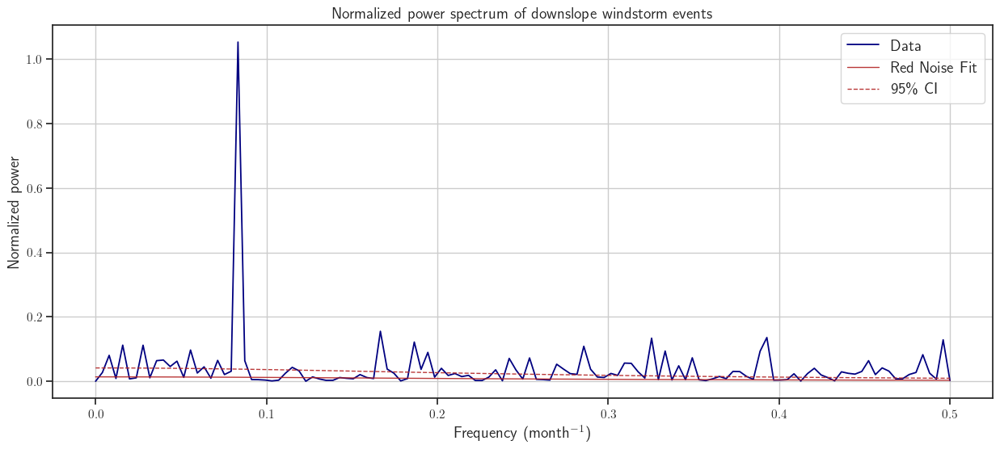

In [2304]:
## Not normalized
alpha_level = 0.95 ## set statistical significance level

f,Pxx = signal.periodogram(data,fs=1.,window='boxcar',nfft=None,return_onesided=True,scaling='spectrum')
# Pxx_n = Pxx/np.sum(Pxx)

fig = plt.figure(figsize=(15,6))
plt.plot(f,Pxx, color='navy', lw=1.3, label='Data')
plt.plot(freq,red_fit_n, color='firebrick', lw=1, alpha=0.9, label='Red Noise Fit')
plt.plot(freq,f_bounds, color='firebrick', lw=1, ls='--', alpha=0.9, label=str(int(alpha_level*100))+'\% CI')
# plt.ylim(0.0,0.3)
# plt.xlim(0.0,0.06)
plt.xlabel("Frequency (month$^{-1}$)",fontsize=14)
plt.ylabel("Normalized power",fontsize=14)
plt.title("Normalized power spectrum of downslope windstorm events",fontsize=14)
plt.legend(loc='upper right',fontsize=14)
plt.grid()
plt.savefig('spectral_analysis_nn.pdf',bbox_inches='tight')
# power over total power, 20% of total variance, 
# also plot in total power units esp for comparing to other datasets
# barnes notes for explaining, asking amplitude of sin/cos wave what's the reg coef at each frequency to recreate the data
# pair this plot with the data

### Deseasonalizing

In [270]:
from statsmodels.tsa.seasonal import seasonal_decompose
analysis = storms_df[['Windstorms']].copy()

s_dec_additive = seasonal_decompose(analysis, model = "additive", period=12, extrapolate_trend='freq')

observed_sd = s_dec_additive.observed
trend_sd = s_dec_additive.trend
seasonal_sd = s_dec_additive.seasonal
residual_sd = s_dec_additive.resid

decomposed_df = pd.DataFrame({"Observed":observed_sd, "Trend":trend_sd, "Seasonal":seasonal_sd, "Residual":residual_sd})
decomposed_df

,Observed,Trend,Seasonal,Residual
0,9.0,7.428127,1.056916,0.514956
1,9.0,7.234800,0.413345,1.351855
2,10.0,7.041472,1.001916,1.956612
3,8.0,6.848145,0.584535,0.567320
4,5.0,6.654817,-0.263402,-1.391415
...,...,...,...,...
247,2.0,4.568279,-1.872376,-0.695902
248,5.0,4.562014,-0.850253,1.288238
249,4.0,4.555750,-0.455113,-0.100637
250,6.0,4.549485,0.930106,0.520409


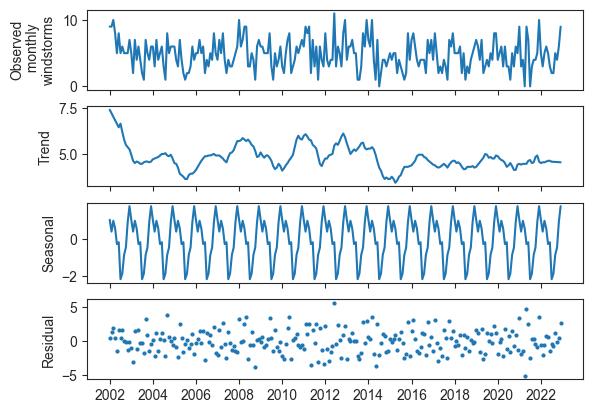

In [271]:
fig, ax = plt.subplots(4, 
           sharex='col', sharey='row')

ax[0].plot(decomposed_df['Observed'])
ax[0].set(ylabel='Observed\n monthly\nwindstorms')

ax[1].plot(decomposed_df['Trend'])
ax[1].set(ylabel='Trend')

ax[2].plot(decomposed_df['Seasonal'])
ax[2].set(ylabel='Seasonal')
# ax[2].set_ylim([-2.5, 3])

ax[3].plot(decomposed_df['Residual'], 'o', markersize=2)
ax[3].set(ylabel='Residual')
ax[3].set_xticks(np.arange(0,252,24))
ax[3].set_xticklabels(np.arange(2002,2023,2), fontsize=10)

plt.show()

# fig.savefig("MFA_figures/detrended.pdf",bbox_inches="tight")

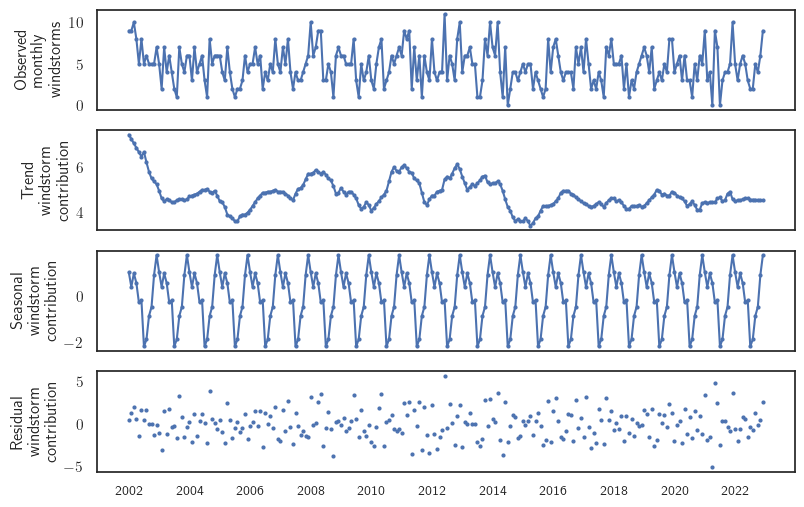

In [1577]:
fig, ax = plt.subplots(4, 
           sharex='col', sharey='row', figsize=(9,6))

ax[0].plot(decomposed_df['Observed'],'o-',markersize=2)
ax[0].set(ylabel='Observed\n monthly\nwindstorms')

ax[1].plot(decomposed_df['Trend'],'o-',markersize=2)
ax[1].set(ylabel='Trend\nwindstorm\ncontribution')

ax[2].plot(decomposed_df['Seasonal'],'o-',markersize=2)
ax[2].set(ylabel='Seasonal\nwindstorm\ncontribution')
# ax[2].set_ylim([-2.5, 3])

ax[3].plot(decomposed_df['Residual'], 'o', markersize=2)
ax[3].set(ylabel='Residual\nwindstorm\ncontribution')
ax[3].set_xticks(np.arange(0,252,24))
ax[3].set_xticklabels(np.arange(2002,2023,2), fontsize=10)

plt.show()

fig.savefig("detrended.pdf",bbox_inches="tight")

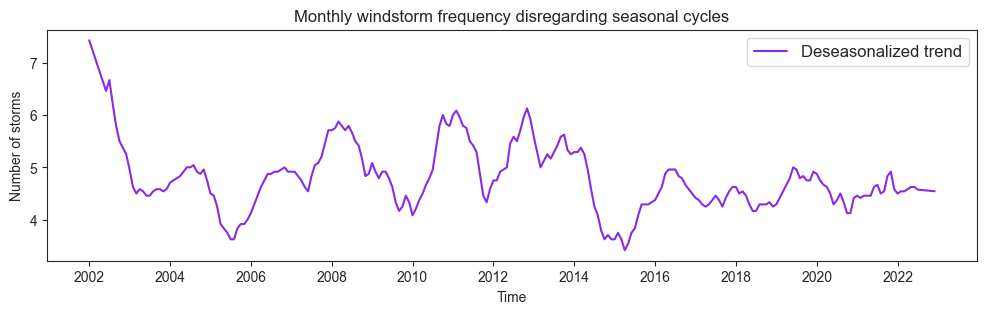

Slope of best fit: -0.0030268492545865284


In [274]:
windstorm_trend = trend_sd
y = windstorm_trend
x = np.arange(len(y))
x = sm.add_constant(x)

mod = sm.OLS(y, x)
result = mod.fit()

plt.figure(figsize=(12,3))
plt.plot(windstorm_trend, color='blueviolet', label='Deseasonalized trend')

trend = np.polyfit(x=np.arange(0,252,1) , y=windstorm_trend, deg=1)
trendpoly = np.poly1d(trend) 

# plt.plot(np.arange(0,252,1),trendpoly(np.arange(0,252,1)), color='teal',label=f'First order fit: $m={np.round(trend[0],3)}, p={np.round(result.pvalues[1],7)}$')
plt.xlabel(f"Time")
plt.ylabel("Number of storms")
plt.xticks(np.arange(0,252,24),np.arange(2002,2023,2))
plt.legend(loc="best",prop={'size': 12}) 
plt.title(f"Monthly windstorm frequency disregarding seasonal cycles")
# plt.savefig(f'full_des_windstorms.pdf',bbox_inches='tight')
plt.show()
print(f'Slope of best fit: {trend[0]}')

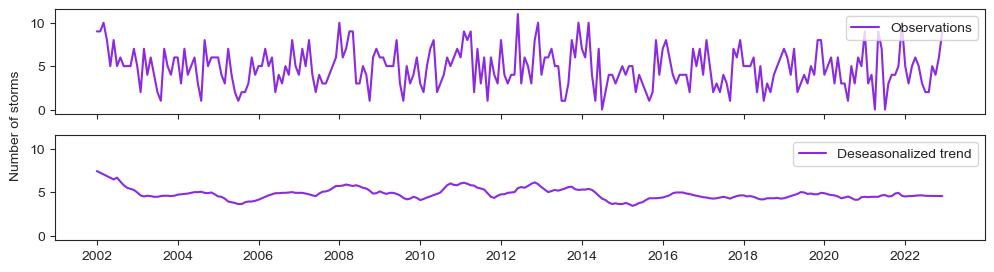

In [702]:
fig, ax = plt.subplots(2, sharex=True, sharey=True, figsize=(12,3))

ax[0].plot(yearly_monthly_storms, color='blueviolet', label='Observations')
ax[1].plot(windstorm_trend, color='blueviolet', label='Deseasonalized trend')

ax[0].set_xticks(ticks = np.arange(0,253,24), labels=np.arange(2002,2023,2))
# ax[0].set_ylabel("Number of storms")
ax[0].tick_params(axis="y")
ax[0].legend(loc='upper right')

ax[1].set_ylabel("Number of storms")
ax[1].yaxis.set_label_coords(-0.035, 1.1)
ax[1].tick_params(axis="y")
ax[1].legend(loc='upper right')
# fig.supylabel('Number of storms')

# fig.suptitle("Deseasonalized trends: windstorms vs time over threshold")
# fig.savefig('full_monthly_comparison.pdf')

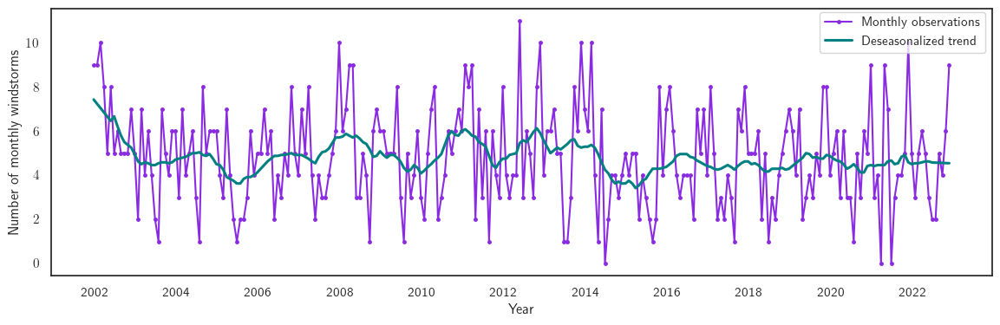

In [1582]:
fig, ax1 = plt.subplots(figsize=(14,4))

ax1.plot(yearly_monthly_storms, 'o-', markersize=2.5, color='blueviolet', label='Monthly observations')
ax1.plot(windstorm_trend, color='teal', linewidth=2.2, label='Deseasonalized trend')

ax1.set_xlabel("Year")
ax1.set_xticks(ticks = np.arange(0,253,24), labels=np.arange(2002,2023,2))
ax1.set_ylabel("Number of monthly windstorms")
ax1.tick_params(axis="y")

fig.legend(loc='upper right', bbox_to_anchor=(0.9, 0.89))

# ax1.set_title("Windstorms with deseasonalized trend")
fig.savefig('deseas_smoothed.pdf',bbox_inches="tight")

In [1585]:
scipy.stats.spearmanr(full_months, windstorm_trend) 

SignificanceResult(statistic=-0.31691190096111166, pvalue=2.7638235205122146e-07)

## Time over threshold

### Yearly

In [7]:
height='10m'
yearly_minutes_over_threshold = np.zeros(len(years))
yearly_hours_over_threshold = np.zeros(len(years))
subset = ['Year', 'DOY', 'MST', f'Avg Wind Speed @ {height} [m/s]', f'Avg Wind Direction @ {height} [deg]', 'Temperature @ 2m [deg C]', 'Relative Humidity [%]']

for i in np.arange(2002,2023,1): 
    year = i

    df = pd.read_csv(f'/Users/serena/Documents/Research/Data/{year}_data.csv', usecols=lambda x: x in subset)
    df.insert(2, 'Date', df['DOY'].apply(doy_to_date, args=(year,))) 
    df = df.replace(-99999.0, np.nan)
    df['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%Y') # convert date column to DateTime
    df.set_index('Date')

    yearly_minutes_over_threshold[int(year)-2002] = count_over_thresholds(df['Avg Wind Speed @ 10m [m/s]'], 4.5, df['Avg Wind Direction @ 10m [deg]'], [247, 337])
    yearly_hours_over_threshold[int(year)-2002] = yearly_minutes_over_threshold[int(year)-2002]/60
    
    print(f"Hours over threshold in {year}: {yearly_hours_over_threshold[int(year)-2002]}")

Hours over threshold in 2002: 1467.0333333333333
Hours over threshold in 2003: 1497.4166666666667
Hours over threshold in 2004: 1340.9833333333333
Hours over threshold in 2005: 1406.15
Hours over threshold in 2006: 1770.7
Hours over threshold in 2007: 1255.8833333333334
Hours over threshold in 2008: 1744.4833333333333
Hours over threshold in 2009: 1405.6
Hours over threshold in 2010: 1064.3833333333334
Hours over threshold in 2011: 1627.3666666666666
Hours over threshold in 2012: 1542.7
Hours over threshold in 2013: 1524.35
Hours over threshold in 2014: 1503.2
Hours over threshold in 2015: 1148.4666666666667
Hours over threshold in 2016: 1396.6166666666666
Hours over threshold in 2017: 1160.0333333333333
Hours over threshold in 2018: 1151.6666666666667
Hours over threshold in 2019: 1147.5333333333333
Hours over threshold in 2020: 1352.4166666666667
Hours over threshold in 2021: 1262.5333333333333
Hours over threshold in 2022: 1341.3666666666666


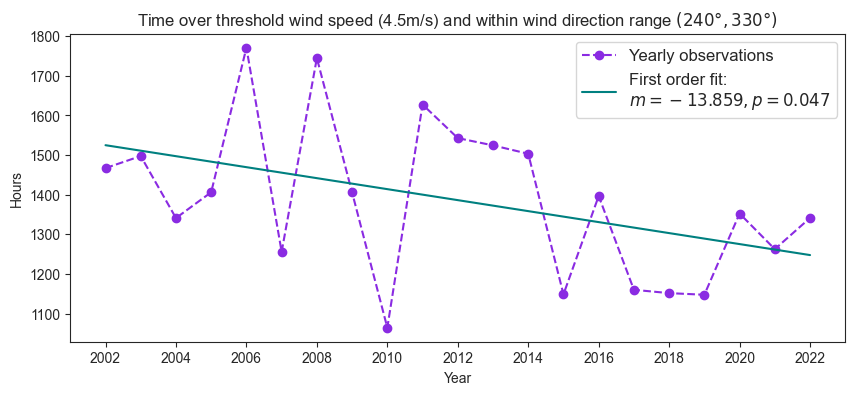

Slope of best fit: -13.858658008658562


In [131]:
y = yearly_hours_over_threshold
x = np.arange(len(y))
x = sm.add_constant(x)

mod = sm.GLS(y, x)
result = mod.fit()

yearly_hours_over_threshold = yearly_minutes_over_threshold/60

plt.figure(figsize=(10,4))
plt.plot(years, yearly_hours_over_threshold,'o--', color='blueviolet', label='Yearly observations')

trend = np.polyfit(years,yearly_hours_over_threshold, 1)
trendpoly = np.poly1d(trend) 

plt.plot(years,trendpoly(years), color='teal',label=f'First order fit: \n$m={np.round(trend[0],3)}, p={np.round(result.pvalues[1],3)}$')
plt.xlabel(f"Year")
plt.ylabel("Hours")
plt.xticks(years[::2])
plt.legend(loc="best",prop={'size': 12}) 
plt.title(f"Time over threshold wind speed (4.5m/s) and within wind direction range $(240\degree, 330\degree)$")
# plt.savefig(f'MFA_figures/{height}_time_over_thr.pdf')
plt.show()
print(f'Slope of best fit: {trend[0]}')

In [2270]:
yearly_hours_over_threshold

array([1467.03333333, 1497.41666667, 1340.98333333, 1406.15      ,
       1770.7       , 1255.88333333, 1744.48333333, 1405.6       ,
       1064.38333333, 1627.36666667, 1542.7       , 1524.35      ,
       1503.2       , 1148.46666667, 1396.61666667, 1160.03333333,
       1151.66666667, 1147.53333333, 1352.41666667, 1262.53333333,
       1341.36666667])

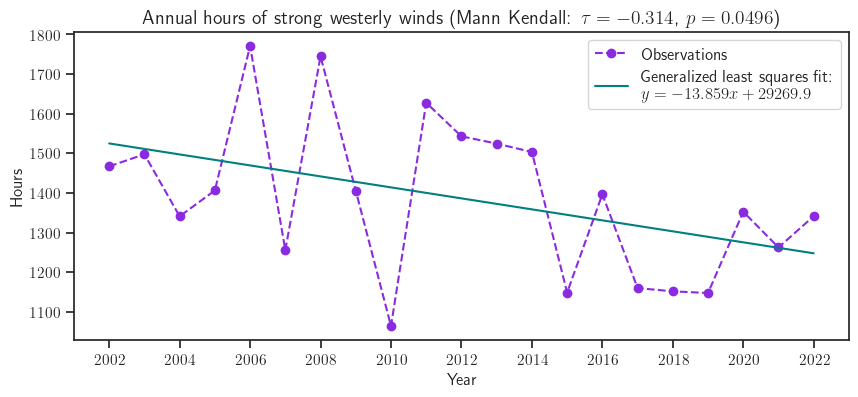

In [2302]:
x = years
y = yearly_hours_over_threshold
# y = windstorms_1min

gls_model = sm.GLS(y, sm.add_constant(x))
gls_result = gls_model.fit()
gls_params = gls_result.params

nb_model = sm.GLM(y, sm.add_constant(x), family=sm.families.NegativeBinomial())
nb_results = nb_model.fit()
nb_params = nb_results.params

plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(years, yearly_hours_over_threshold,'o--', color='blueviolet', label='Observations')

X = years
# trendpoly = np.exp(nb_params[1]*X+nb_params[0])
trendpoly2 = gls_params[0]+X*gls_params[1]

# plt.plot(years,trendpoly,'-',color='orange',label=f'Negative binomial model fit: \n$y = exp({np.round(nb_params[1],3)}x +{np.round(nb_params[0],3)})$')
plt.plot(years,trendpoly2,'-',color='teal',label=f'Generalized least squares fit: \n$y = {np.round(gls_params[1],3)}x +{np.round(gls_params[0],1)}$')
plt.xlabel(f"Year",fontsize=12)
plt.ylabel("Hours",fontsize=12)
plt.xticks(years[::2])
plt.legend(loc="best",prop={'size': 12}) 
plt.title(r"Annual hours of strong westerly winds (Mann Kendall: $\tau=-0.314$, $p=0.0496$)",fontsize=14)
plt.savefig(f'{height}_toth.pdf',bbox_inches='tight')
plt.show()

In [2272]:
mk_result = "Mann_Kendall_Test(trend='decreasing', h=True, p=0.049669425323142224, z=-1.9627999354560155, Tau=-0.3142857142857143, s=-66.0, var_s=1096.6666666666667, slope=-13.720924908186815, intercept=1533.8259157518683)"
print(mk_result)

Mann_Kendall_Test(trend='decreasing', h=True, p=0.049669425323142224, z=-1.9627999354560155, Tau=-0.3142857142857143, s=-66.0, var_s=1096.6666666666667, slope=-13.720924908186815, intercept=1533.8259157518683)


In [1727]:
print(gls_result.summary())

                            GLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.192
Model:                            GLS   Adj. R-squared:                  0.149
Method:                 Least Squares   F-statistic:                     4.502
Date:                Thu, 30 Mar 2023   Prob (F-statistic):             0.0472
Time:                        22:17:40   Log-Likelihood:                -137.94
No. Observations:                  21   AIC:                             279.9
Df Residuals:                      19   BIC:                             282.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.927e+04   1.31e+04      2.227      0.0

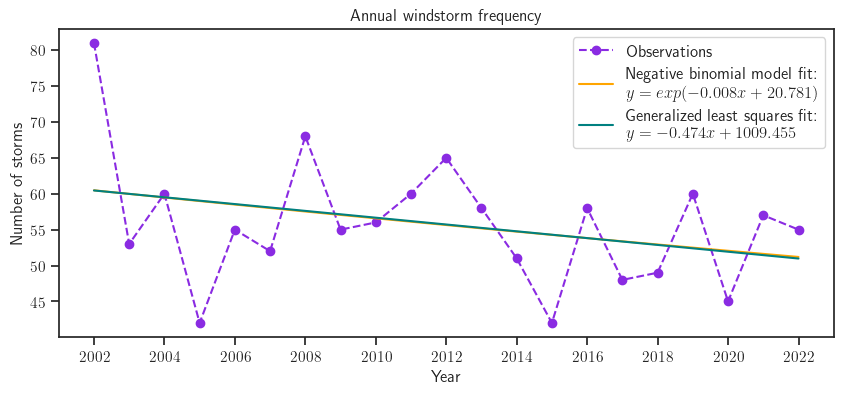

In [1729]:
x = years
y = windstorms_1min

gls_model = sm.GLS(y, sm.add_constant(x))
gls_result = gls_model.fit()
gls_params = gls_result.params

nb_model = sm.GLM(y, sm.add_constant(x), family=sm.families.NegativeBinomial())
nb_results = nb_model.fit()
nb_params = nb_results.params

plt.figure(figsize=(10,4))
sns.set_style("ticks")
plt.plot(years, windstorms_1min,'o--', color='blueviolet', label='Observations')

X = years
trendpoly = np.exp(nb_params[1]*X+nb_params[0])
trendpoly2 = gls_params[0]+X*gls_params[1]

plt.plot(years,trendpoly,'-',color='orange',label=f'Negative binomial model fit: \n$y = exp({np.round(nb_params[1],3)}x +{np.round(nb_params[0],3)})$')
plt.plot(years,trendpoly2,'-',color='teal',label=f'Generalized least squares fit: \n$y = {np.round(gls_params[1],3)}x +{np.round(gls_params[0],3)}$')
plt.xlabel(f"Year")
plt.ylabel("Number of storms")
plt.xticks(years[::2])
plt.legend(loc="best",prop={'size': 12}) 
plt.title(f"Annual windstorm frequency")
# plt.savefig(f'{height}_windstorms_new.pdf')
plt.show()

In [393]:
windstorm_residuals = windstorms_1min-trendpoly2 #gls
windstorm_residuals2 = windstorms_1min-trendpoly #nb

In [1753]:
toth_residuals_gls = yearly_hours_over_threshold-trendpoly2 #gls
# toth_residuals2_nb = yearly_hours_over_threshold-trendpoly

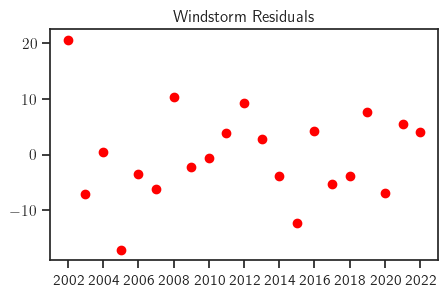

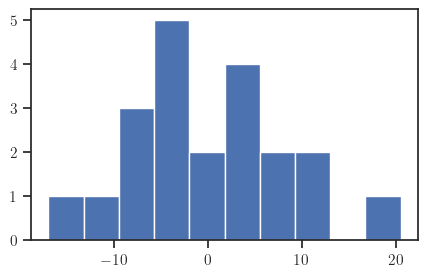

In [1769]:
plt.figure(figsize=(5,3))
plt.plot(windstorm_residuals, 'o',color='red')
plt.xticks(np.arange(0,22,2),years[::2])
plt.title(f"Windstorm Residuals")
plt.show()
plt.figure(figsize=(5,3))
plt.hist(windstorm_residuals)
plt.show()

In [1732]:
from scipy.stats import shapiro

# conduct the  Shapiro-Wilk Test
shapiro(windstorm_residuals)

ShapiroResult(statistic=0.979795515537262, pvalue=0.9223672747612)

the p-value is 0.92 which is more than the threshold (0.05) which is the alpha (0.05) so we fail to reject the null hypothesis i.e. we do not have sufficient evidence to say that sample does not come from a normal distribution

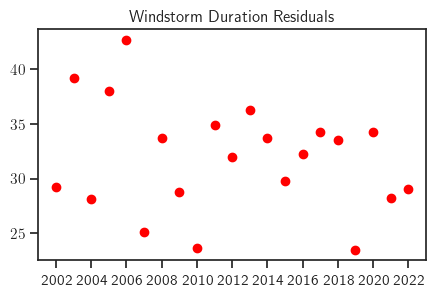

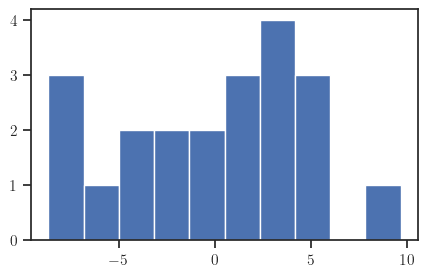

ShapiroResult(statistic=0.9710302352905273, pvalue=0.7557416558265686)

In [1778]:
x = years
y = storm_durations_mean

gls_model = sm.GLS(y, sm.add_constant(x))
gls_result = gls_model.fit()
gls_params = gls_result.params
trendpoly = gls_params[0]+x*gls_params[1]
dur_residuals = storm_durations_mean-trendpoly #gls

plt.figure(figsize=(5,3))
sns.set_style("ticks")
plt.plot(years, storm_durations_mean,'o', color='red', label='Observations')
plt.xticks(np.arange(2002,2023,2),years[::2])
plt.title(f"Windstorm Duration Residuals")
plt.show()

plt.figure(figsize=(5,3))
plt.hist(dur_residuals)
plt.show()

# conduct the  Shapiro-Wilk Test on the residuals to test for normal distribution
shapiro(dur_residuals)

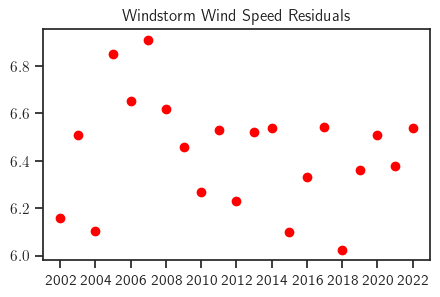

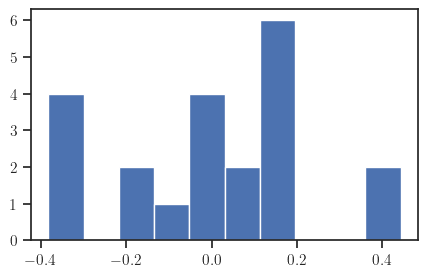

ShapiroResult(statistic=0.9471225142478943, pvalue=0.300203800201416)

In [1777]:
x = years
y = storm_speeds_mean

gls_model = sm.GLS(y, sm.add_constant(x))
gls_result = gls_model.fit()
gls_params = gls_result.params
spd_residuals = storm_speeds_mean-trendpoly #gls
trendpoly = gls_params[0]+x*gls_params[1]

plt.figure(figsize=(5,3))
sns.set_style("ticks")
plt.plot(years, storm_speeds_mean,'o', color='red', label='Observations')
plt.xticks(np.arange(2002,2023,2),years[::2])
plt.title(f"Windstorm Wind Speed Residuals")
plt.show()

plt.figure(figsize=(5,3))
plt.hist(spd_residuals)
plt.show()

# conduct the  Shapiro-Wilk Test on the residuals to test for normal distribution
shapiro(spd_residuals)

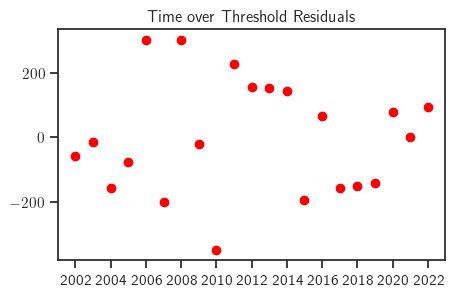

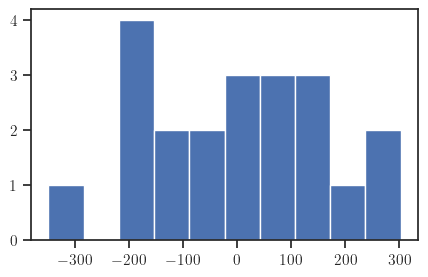

ShapiroResult(statistic=0.9693241119384766, pvalue=0.7180253863334656)

In [1783]:
plt.figure(figsize=(5,3))
plt.plot(toth_residuals_gls, 'o',color='red')
plt.xticks(np.arange(0,22,2),years[::2])
plt.title(f"Time over Threshold Residuals")
plt.show()

plt.figure(figsize=(5,3))
plt.hist(toth_residuals_gls)
plt.show()
shapiro(toth_residuals_gls) 

In [404]:
np.mean(yearly_monthly_storms)

4.829365079365079

In [405]:
np.std(yearly_monthly_storms)

2.2393156359724524

In [406]:
np.std(yearly_monthly_storms)/np.mean(yearly_monthly_storms) *1 # the standard deviation is 0.15 as large as the mean

0.46368737901812496

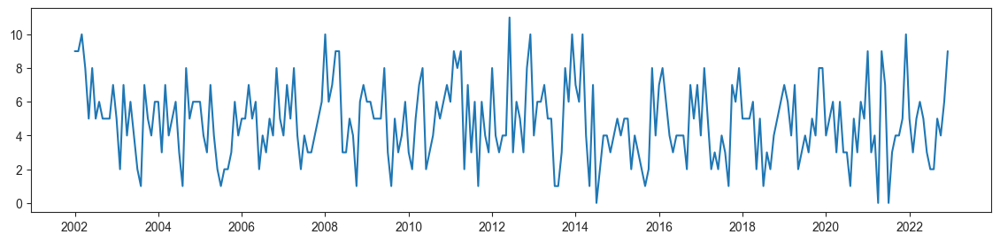

In [420]:
plt.figure(figsize=(14,3))
plt.plot(yearly_monthly_storms)
plt.xticks(np.arange(0,253,24),np.arange(2002,2023,2))
plt.show()

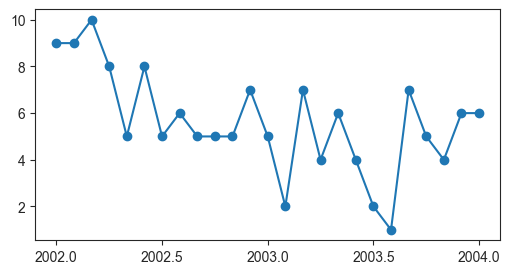

In [432]:
plt.figure(figsize=(6,3))
plt.plot(yearly_monthly_storms[0:25],'o-')
plt.xticks(np.arange(0,25,6),np.arange(2002,2004.5,0.5))
plt.show()

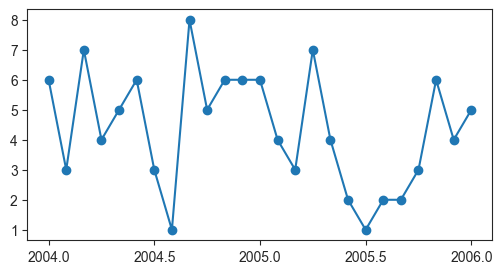

In [431]:
plt.figure(figsize=(6,3))
plt.plot(yearly_monthly_storms[24:49],'o-')
plt.xticks(np.arange(0,25,6),np.arange(2004,2006.5,0.5))
plt.show()

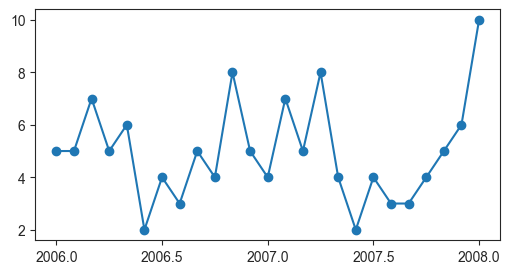

In [433]:
plt.figure(figsize=(6,3))
plt.plot(yearly_monthly_storms[48:73],'o-')
plt.xticks(np.arange(0,25,6),np.arange(2006,2008.5,0.5))
plt.show()

In [463]:
y = yearly_hours_over_threshold
x = years

model = sm.GLS(y, sm.add_constant(x))
results = model.fit()

# Print the summary of the model
print(results.summary())

#e.g. r-squared of 60% reveals that 60% of the variability observed in the target variable is explained by the regression model

                            GLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.192
Model:                            GLS   Adj. R-squared:                  0.149
Method:                 Least Squares   F-statistic:                     4.502
Date:                Sat, 18 Mar 2023   Prob (F-statistic):             0.0472
Time:                        18:42:53   Log-Likelihood:                -137.94
No. Observations:                  21   AIC:                             279.9
Df Residuals:                      19   BIC:                             282.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.927e+04   1.31e+04      2.227      0.0

In [462]:
y = yearly_hours_over_threshold
x = years

# Fit the Negative Binomial Regression model
nb_model = sm.GLM(y, sm.add_constant(x), family=sm.families.NegativeBinomial())
nb_results = nb_model.fit()

# Print the summary of the model
print(nb_results.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                   21
Model:                            GLM   Df Residuals:                       19
Model Family:        NegativeBinomial   Df Model:                            1
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -172.89
Date:                Sat, 18 Mar 2023   Deviance:                      0.32265
Time:                        18:42:51   Pearson chi2:                    0.318
No. Iterations:                     3   Pseudo R-squ. (CS):           0.003709
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         27.6303     72.534      0.381      0.7

In [329]:
y = yearly_hours_over_threshold
x = years

# Fit the Negative Binomial Regression model
model = sm.GLS(y, sm.add_constant(x))
results = model.fit()

# Print the summary of the model
print(results.summary())

                            GLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.192
Model:                            GLS   Adj. R-squared:                  0.149
Method:                 Least Squares   F-statistic:                     4.502
Date:                Sat, 11 Mar 2023   Prob (F-statistic):             0.0472
Time:                        07:32:00   Log-Likelihood:                -137.94
No. Observations:                  21   AIC:                             279.9
Df Residuals:                      19   BIC:                             282.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.927e+04   1.31e+04      2.227      0.0

In [11]:
np.mean(yearly_hours_over_threshold)

1386.2325396825397

In [12]:
np.var(yearly_hours_over_threshold)

36766.43556815318

In [10]:
y = yearly_hours_over_threshold
x = years

# Fit the Negative Binomial Regression model
p_model = sm.GLM(y, sm.add_constant(x), family=sm.families.Poisson())
p_results = p_model.fit()

# Print the summary of the model
print(p_results.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                   21
Model:                            GLM   Df Residuals:                       19
Model Family:                 Poisson   Df Model:                            1
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -319.02
Date:                Sat, 25 Feb 2023   Deviance:                       447.73
Time:                        10:21:09   Pearson chi2:                     446.
No. Iterations:                     4   Pseudo R-squ. (CS):             0.9938
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         27.3620      1.949     14.037      0.0

In [250]:
# # Extract the model parameters
# adj_nb_params = adj_nb_results.params

# # Print the model equation
# print("y = exp({:.3f} + {:.3f}*x)".format(adj_nb_params[0], adj_nb_params[1]))

y = exp(9.615 + -0.003*x)


In [ ]:
y = yearly_hours_over_threshold
x = np.arange(len(y))
x = sm.add_constant(x)

mod = sm.OLS(y, x)
result = mod.fit()

yearly_hours_over_threshold = yearly_minutes_over_threshold/60

plt.figure(figsize=(10,4))
plt.plot(years, yearly_hours_over_threshold,'o--', color='blueviolet', label='Yearly observations')

trend = np.polyfit(years,yearly_hours_over_threshold, 1)
trendpoly = np.poly1d(trend) 

plt.plot(years,trendpoly(years), color='teal',label=f'First order fit: \n$m={np.round(trend[0],4)}, p={np.round(result.pvalues[1],4)}$')
plt.xlabel(f"Year")
plt.ylabel("Hours")
plt.xticks(years[::2])
plt.legend(loc="best",prop={'size': 12}) 
plt.title(f"Time over threshold wind speed (4.5m/s) and within wind direction range $(240\degree, 330\degree)$")
# plt.savefig(f'{height}_time_over_thr.pdf')
plt.show()
print(f'Slope of best fit: {trend[0]}')

In [464]:
scipy.stats.pearsonr(windstorms_1min, yearly_hours_over_threshold) 

PearsonRResult(statistic=0.39590867202515573, pvalue=0.07563357947062485)

In [465]:
scipy.stats.spearmanr(windstorms_1min, yearly_hours_over_threshold) 

SignificanceResult(statistic=0.35049045873902346, pvalue=0.1193072003666325)

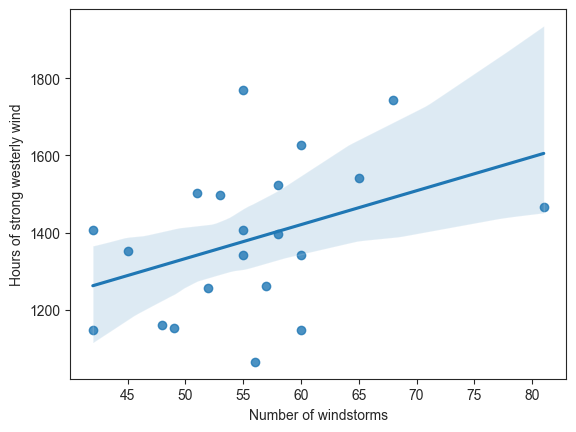

In [562]:
sns.regplot(x=windstorms_1min, y=yearly_hours_over_threshold,n_boot=100,robust=True) 
plt.xlabel('Number of windstorms')
plt.ylabel('Hours of strong westerly wind')
plt.show()

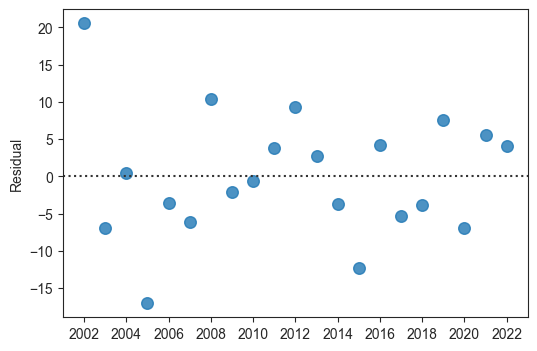

In [532]:
plt.figure(figsize=(6,4))
sns.residplot(x=years, y=windstorms_1min,
              scatter_kws={"s": 70});
plt.xticks(years[::2])
plt.ylabel('Residual')
# plt.legend()
plt.show()

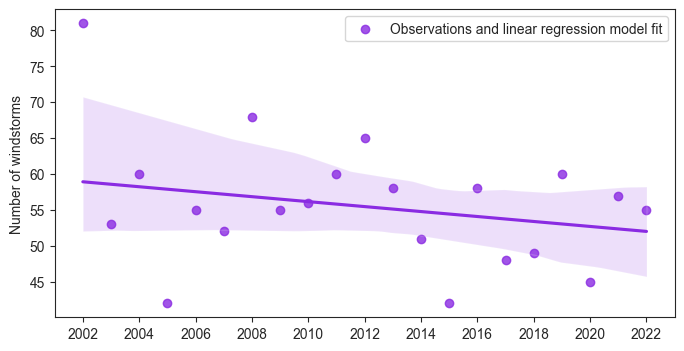

In [538]:
plt.figure(figsize=(8,4))
sns.regplot(years,windstorms_1min,n_boot=100,robust=True,x_ci=95,color='blueviolet',label='Observations and linear regression model fit') 
plt.xticks(years[::2])
plt.ylabel('Number of windstorms')
plt.legend()
plt.show()

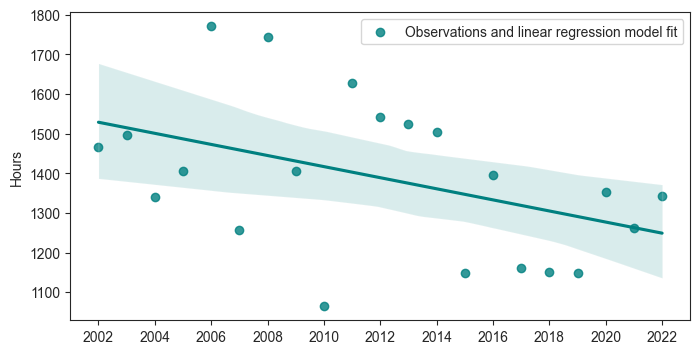

In [536]:
plt.figure(figsize=(8,4))
sns.regplot(years,yearly_hours_over_threshold,n_boot=100,robust=True,x_ci=95,color='teal',label='Observations and linear regression model fit') 
plt.xticks(years[::2])
plt.ylabel('Hours')
plt.legend()
plt.show()

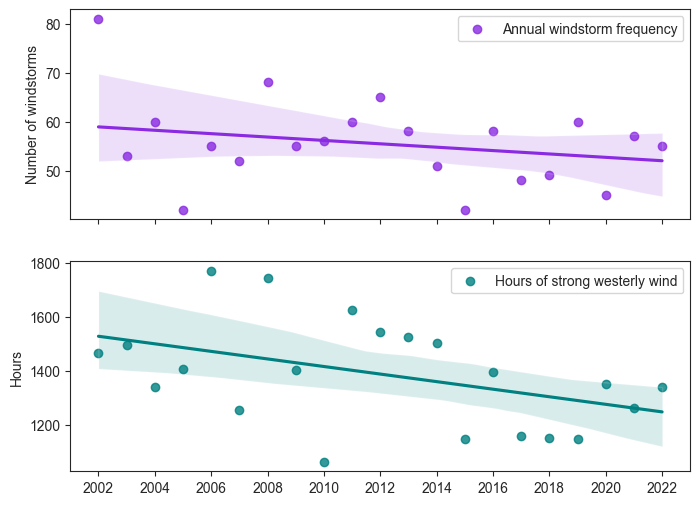

In [550]:
fig, ax = plt.subplots(2, sharex=True, figsize=(8,6))

sns.regplot(x=years,y=windstorms_1min,n_boot=100,robust=True,x_ci=95,color='blueviolet',label='Annual windstorm frequency', ax=ax[0]) 
ax[0].set_xticks(years[::2])
ax[0].set_ylabel('Number of windstorms')
ax[0].legend(loc='upper right')

sns.regplot(x=years,y=yearly_hours_over_threshold,n_boot=100,robust=True,x_ci=95,color='teal',label='Hours of strong westerly wind', ax=ax[1]) 
ax[1].set_ylabel("Hours")
ax[1].tick_params(axis="y")
ax[1].legend(loc='upper right')

# fig.suptitle("Yearly windstorms vs time over threshold")
fig.savefig('confidence_intervals.pdf')

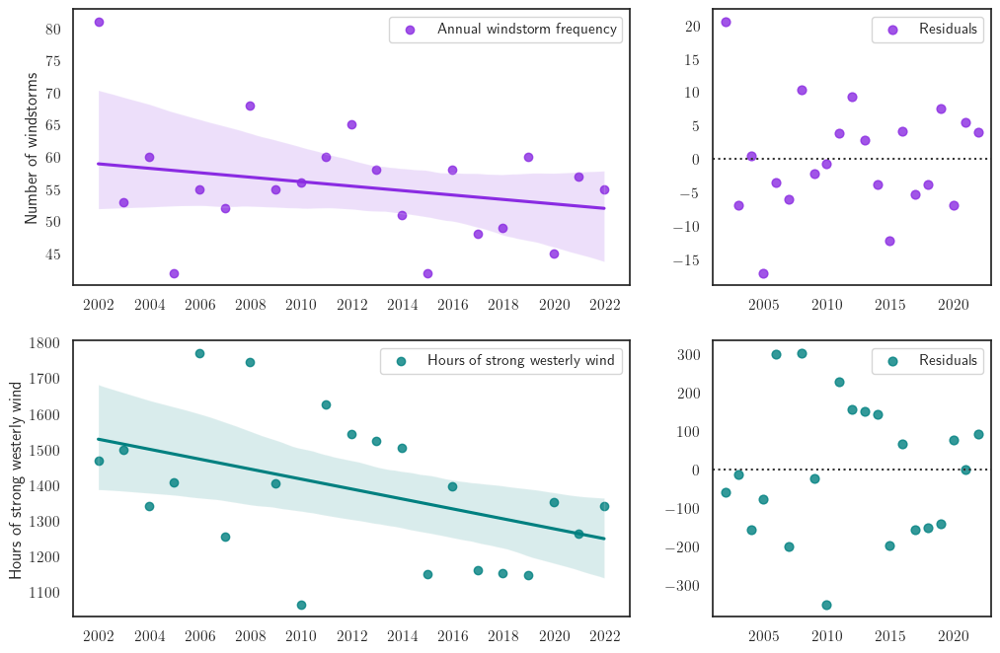

In [1602]:
fig, ax = plt.subplots(2, 2, figsize=(12,8), gridspec_kw={'width_ratios': [2, 1]})

sns.regplot(x=years,y=windstorms_1min,n_boot=500,robust=True,x_ci=95,color='blueviolet',label='Annual windstorm frequency', ax=ax[0,0]) 
ax[0,0].set_xticks(years[::2])
ax[0,0].set_ylabel('Number of windstorms')
ax[0,0].legend(loc='upper right')

sns.residplot(x=years, y=windstorms_1min, scatter_kws={"s": 40}, color='blueviolet', label='Residuals', ax=ax[0,1]);
ax[0,1].legend(loc='upper right')

sns.regplot(x=years,y=yearly_hours_over_threshold,n_boot=500,robust=True,x_ci=95,color='teal',label='Hours of strong westerly wind', ax=ax[1,0]) 
ax[1,0].set_xticks(years[::2])
ax[1,0].set_ylabel('Hours of strong westerly wind')
ax[1,0].legend(loc='upper right')

sns.residplot(x=years, y=yearly_hours_over_threshold, scatter_kws={"s": 40}, color='teal', label='Residuals', ax=ax[1,1]);
ax[1,1].legend(loc='upper right')

# for ax in axs.flat:
#     ax.set(xlabel='x-label', ylabel='y-label')

# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()
    
fig.savefig('confidence_intervals_residuals.pdf')

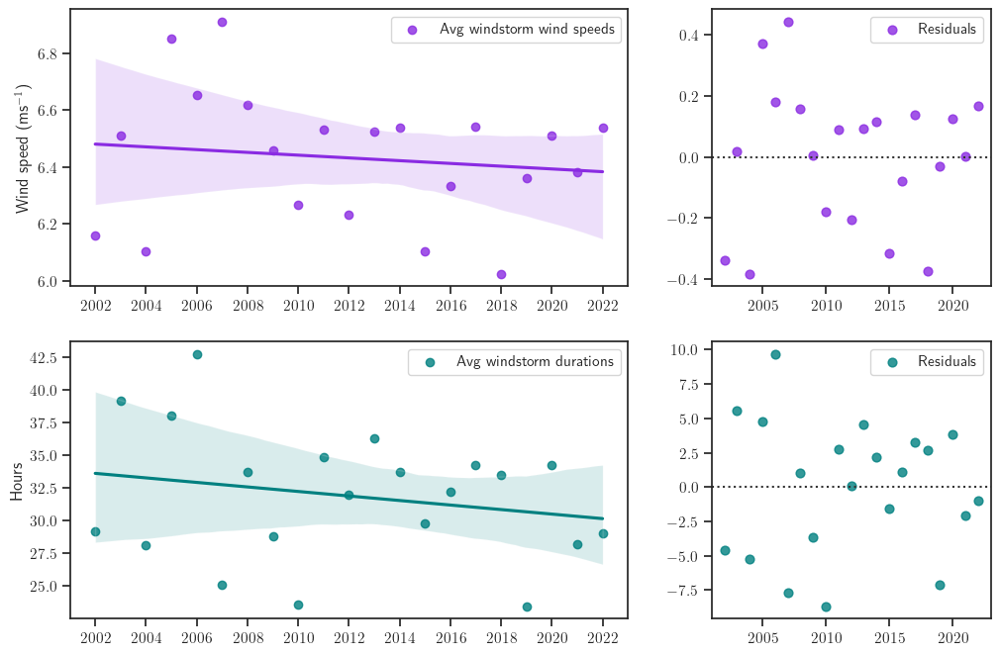

In [1649]:
fig, ax = plt.subplots(2, 2, figsize=(12,8), gridspec_kw={'width_ratios': [2, 1]})

sns.regplot(x=years,y=storm_speeds_mean,n_boot=500,robust=True,x_ci=95,color='blueviolet',label='Avg windstorm wind speeds', ax=ax[0,0]) 
ax[0,0].set_xticks(years[::2])
ax[0,0].set_ylabel(r'Wind speed (ms$^{-1}$)')
ax[0,0].legend(loc='upper right')

sns.residplot(x=years, y=storm_speeds_mean, scatter_kws={"s": 40}, color='blueviolet', label='Residuals', ax=ax[0,1]);
ax[0,1].legend(loc='upper right')

sns.regplot(x=years,y=storm_durations_mean,n_boot=500,robust=True,x_ci=95,color='teal',label='Avg windstorm durations', ax=ax[1,0]) 
ax[1,0].set_xticks(years[::2])
ax[1,0].set_ylabel('Hours')
ax[1,0].legend(loc='upper right')

sns.residplot(x=years, y=storm_durations_mean, scatter_kws={"s": 40}, color='teal', label='Residuals', ax=ax[1,1]);
ax[1,1].legend(loc='upper right')

# for ax in axs.flat:
#     ax.set(xlabel='x-label', ylabel='y-label')

# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()
    
fig.savefig('confidence_intervals_residuals2.pdf')

In [2275]:
# storm_durations: Mann_Kendall_Test(trend='no trend', h=False, p=0.3811873049877583, z=-0.8757107404342224, Tau=-0.14285714285714285, s=-30.0, var_s=1096.6666666666667, slope=-0.23312530004166698, intercept=34.572632310416665)

In [2276]:
# storm_speeds: Mann_Kendall_Test(trend='no trend', h=False, p=0.6077081401081053, z=-0.5133476754269579, Tau=-0.08571428571428572, s=-18.0, var_s=1096.6666666666667, slope=-0.006193449761904771, intercept=6.570868757619048)

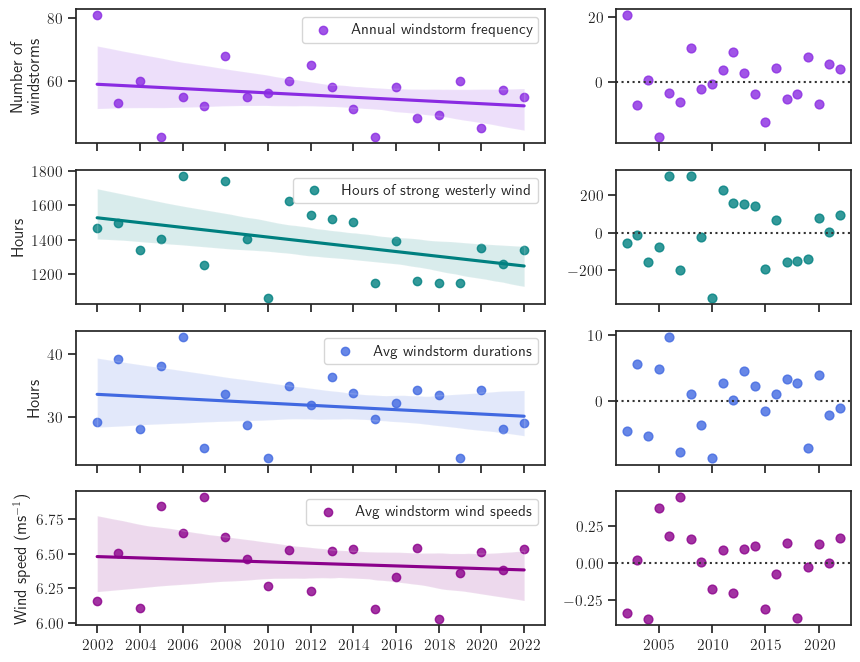

In [1678]:
fig, ax = plt.subplots(4, 2, figsize=(10,8), sharex='col', gridspec_kw={'width_ratios': [2, 1]})

sns.regplot(x=years,y=windstorms_1min,n_boot=500,robust=True,x_ci=95,color='blueviolet',label='Annual windstorm frequency', ax=ax[0,0]) 
ax[0,0].set_xticks(years[::2])
ax[0,0].set_ylabel('Number of\nwindstorms')
ax[0,0].legend(loc='upper right')

sns.residplot(x=years, y=windstorms_1min, scatter_kws={"s": 40}, color='blueviolet', label='Residuals', ax=ax[0,1]);
# ax[0,1].legend(loc='upper right')

sns.regplot(x=years,y=yearly_hours_over_threshold,n_boot=500,robust=True,x_ci=95,color='teal',label='Hours of strong westerly wind', ax=ax[1,0]) 
ax[1,0].set_xticks(years[::2])
ax[1,0].set_ylabel('Hours')
ax[1,0].legend(loc='upper right')

sns.residplot(x=years, y=yearly_hours_over_threshold, scatter_kws={"s": 40}, color='teal', label='Residuals', ax=ax[1,1]);
# ax[1,1].legend(loc='upper right')

sns.regplot(x=years,y=storm_speeds_mean,n_boot=500,robust=True,x_ci=95,color='darkmagenta',label='Avg windstorm wind speeds', ax=ax[3,0]) 
ax[3,0].set_xticks(years[::2])
ax[3,0].set_ylabel(r'Wind speed (ms$^{-1}$)')
ax[3,0].legend(loc='upper right')

sns.residplot(x=years, y=storm_speeds_mean, scatter_kws={"s": 40}, color='darkmagenta',label='Residuals', ax=ax[3,1]);
# ax[3,1].legend(loc='upper right')

sns.regplot(x=years,y=storm_durations_mean,n_boot=500,robust=True,x_ci=95, color='royalblue', label='Avg windstorm durations', ax=ax[2,0]) 
ax[2,0].set_xticks(years[::2])
ax[2,0].set_ylabel('Hours')
ax[2,0].legend(loc='upper right')

sns.residplot(x=years, y=storm_durations_mean, scatter_kws={"s": 40}, color='royalblue', label='Residuals', ax=ax[2,1]);
# ax[2,1].legend(loc='upper right')

# for ax in axs.flat:
#     ax.set(xlabel='x-label', ylabel='y-label')

# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()
    
fig.savefig('confidence_intervals_residuals3.pdf')

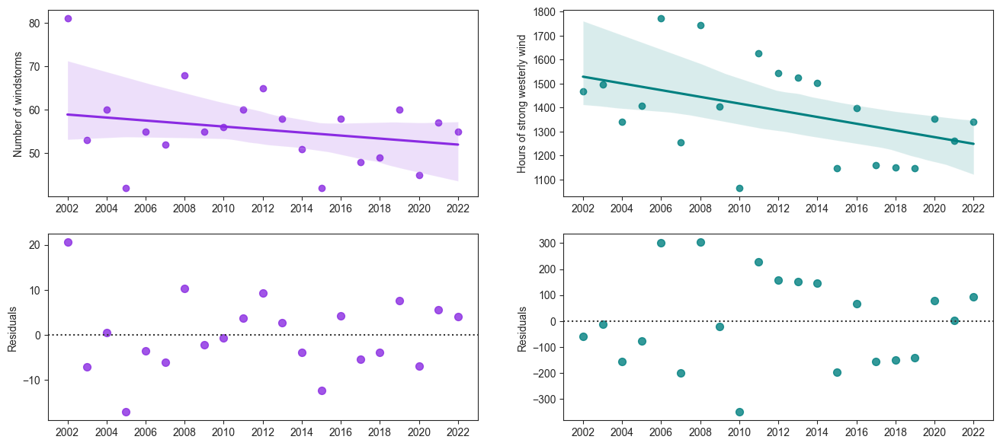

In [601]:
fig, ax = plt.subplots(2, 2, figsize=(16,7))

sns.regplot(x=years,y=windstorms_1min,n_boot=100,robust=True,x_ci=95,color='blueviolet',label='Annual windstorm frequency', ax=ax[0,0]) 
ax[0,0].set_xticks(years[::2])
ax[0,0].set_ylabel('Number of windstorms')
# ax[0,0].legend(loc='upper right')

sns.residplot(x=years, y=windstorms_1min, scatter_kws={"s": 50}, color='blueviolet', label='Residuals', ax=ax[1,0]);
ax[1,0].set_xticks(years[::2])
# ax[1,0].legend(loc='upper right')
ax[1,0].set_ylabel('Residuals')

sns.regplot(x=years,y=yearly_hours_over_threshold,n_boot=100,robust=True,x_ci=95,color='teal',label='Hours of strong westerly wind', ax=ax[0,1]) 
ax[0,1].set_xticks(years[::2])
ax[0,1].set_ylabel('Hours of strong westerly wind')
# ax[0,1].legend(loc='upper right')

sns.residplot(x=years, y=yearly_hours_over_threshold, scatter_kws={"s": 50}, color='teal', label='Residuals', ax=ax[1,1]);
ax[1,1].set_xticks(years[::2])
# ax[1,1].legend(loc='upper right')
ax[1,1].set_ylabel('Residuals')

# plt.subplots_adjust(wspace=0.2, hspace=0)
    
fig.savefig('confidence_intervals_residuals2.pdf', bbox_inches='tight')

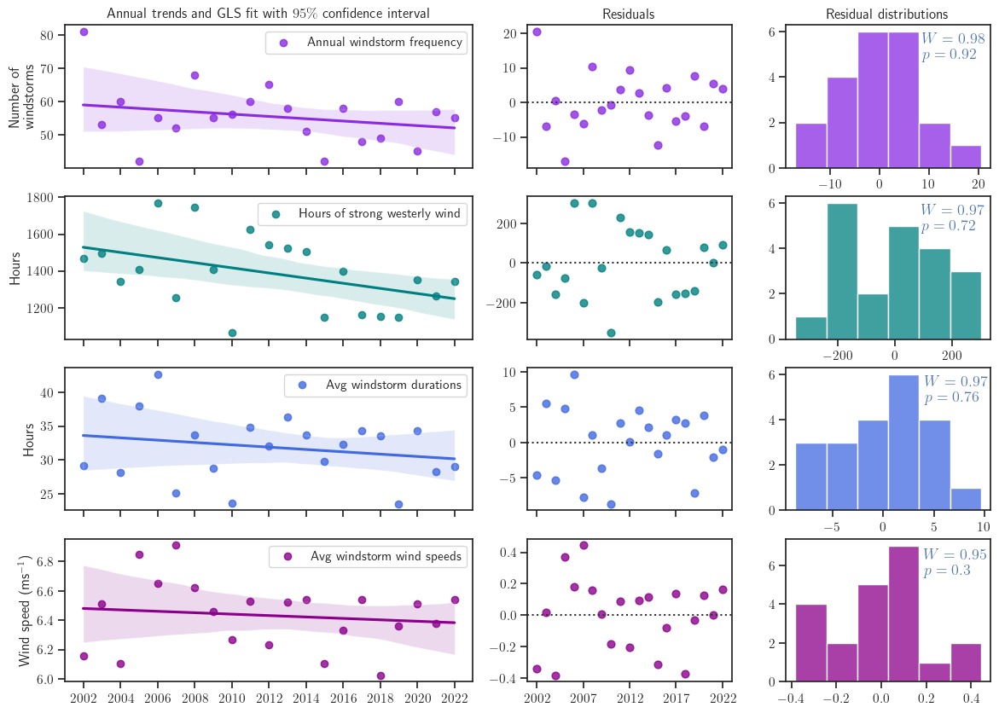

In [1893]:
fig, ax = plt.subplots(4, 3, figsize=(14,10), gridspec_kw={'width_ratios': [2, 1, 1]})

sns.regplot(x=years,y=windstorms_1min,n_boot=500,robust=True,x_ci=95,color='blueviolet',label='Annual windstorm frequency', ax=ax[0,0]) 
ax[0,0].set_xticks(years[::2],[])
ax[0,0].set_ylabel('Number of\nwindstorms')
ax[0,0].legend(loc='upper right')
ax[0,0].set_title(r'Annual trends and GLS fit with $95\%$ confidence interval')
sns.residplot(x=years, y=windstorms_1min, scatter_kws={"s": 40}, color='blueviolet', label='Residuals', ax=ax[0,1]);
ax[0,1].set_xticks(years[::5],[])
ax[0,1].set_title('Residuals')
sns.histplot(windstorm_residuals, color='blueviolet', ax=ax[0,2]);
ax[0,2].set_ylabel('')
ax[0,2].set_title('Residual distributions')

eq = f"$W={np.round(w_s,2)}$\n$p={np.round(w_p,2)}$"
ax[0,2].text(8.5, 4.8, eq, {'color': 'C0', 'fontsize': 13})
# eq = r"$\begin{eqnarray*}W&={np.round(w_s,2)}\\ p&={np.round(w_p,2)}\end{eqnarray*}$"

sns.regplot(x=years,y=yearly_hours_over_threshold,n_boot=500,robust=True,x_ci=95,color='teal',label='Hours of strong westerly wind', ax=ax[1,0]) 
ax[1,0].set_xticks(years[::2],[])
ax[1,0].set_ylabel('Hours')
ax[1,0].legend(loc='upper right')
sns.residplot(x=years, y=yearly_hours_over_threshold, scatter_kws={"s": 40}, color='teal', label='Residuals', ax=ax[1,1]);
ax[1,1].set_xticks(years[::5],[])
sns.histplot(toth_residuals_gls, color='teal', ax=ax[1,2]);
ax[1,2].set_ylabel('')

eq2 = f"$W={np.round(t_s,2)}$\n$p={np.round(t_p,2)}$"
ax[1,2].text(90, 4.8, eq2, {'color': 'C0', 'fontsize': 13})

sns.regplot(x=years,y=storm_durations_mean,n_boot=500,robust=True,x_ci=95, color='royalblue', label='Avg windstorm durations', ax=ax[2,0]) 
ax[2,0].set_xticks(years[::2],[])
ax[2,0].set_ylabel('Hours')
ax[2,0].legend(loc='upper right')
sns.residplot(x=years, y=storm_durations_mean, scatter_kws={"s": 40}, color='royalblue', label='Residuals', ax=ax[2,1]);
ax[2,1].set_xticks(years[::5],[])
sns.histplot(dur_residuals, color='royalblue', ax=ax[2,2]);
ax[2,2].set_ylabel('')

eq3 = f"$W={np.round(d_s,2)}$\n$p={np.round(d_p,2)}$"
ax[2,2].text(4, 4.8, eq3, {'color': 'C0', 'fontsize': 13})

sns.regplot(x=years,y=storm_speeds_mean,n_boot=500,robust=True,x_ci=95,color='darkmagenta',label='Avg windstorm wind speeds', ax=ax[3,0]) 
ax[3,0].set_xticks(years[::2])
ax[3,0].set_ylabel(r'Wind speed (ms$^{-1}$)')
ax[3,0].legend(loc='upper right')
sns.residplot(x=years, y=storm_speeds_mean, scatter_kws={"s": 40}, color='darkmagenta',label='Residuals', ax=ax[3,1]);
ax[3,1].set_xticks(years[::5])
sns.histplot(spd_residuals, color='darkmagenta', ax=ax[3,2]);
ax[3,2].set_ylabel('')

eq4 = f"$W={np.round(s_s,2)}$\n$p={np.round(s_p,2)}$"
ax[3,2].text(0.185, 5.5, eq4, {'color': 'C0', 'fontsize': 13})

fig.savefig('full_GLS.pdf',bbox_inches='tight')

In [1823]:
t_s, t_p = shapiro(toth_residuals_gls) 
s_s, s_p = shapiro(spd_residuals) 
d_s, d_p = shapiro(dur_residuals) 
w_s, w_p = shapiro(windstorm_residuals) 

In [1825]:
shapiro(windstorm_residuals) 

ShapiroResult(statistic=0.979795515537262, pvalue=0.9223672747612)

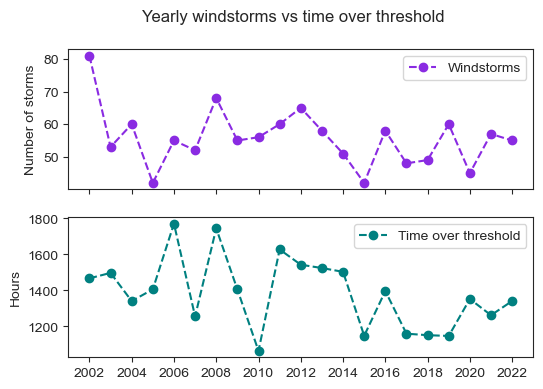

In [765]:
fig, ax = plt.subplots(2, sharex=True, figsize=(6,4))

ax[0].plot(windstorms_1min, 'o--', color='blueviolet', label='Windstorms')
ax[1].plot(yearly_hours_over_threshold, 'o--', color='teal', label='Time over threshold')

ax[0].set_xticks(ticks = np.arange(0,22,2), labels = np.arange(2002,2023,2))
ax[0].set_ylabel("Number of storms")
ax[0].tick_params(axis="y")
ax[0].legend(loc='upper right')

ax[1].set_ylabel("Hours")
ax[1].tick_params(axis="y")
ax[1].legend(loc='upper right')

fig.suptitle("Yearly windstorms vs time over threshold")
fig.savefig('yearly_comparison.pdf')

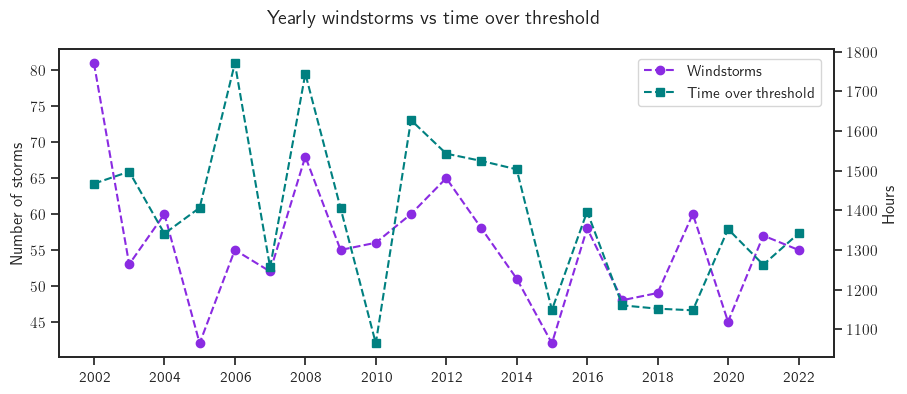

In [1721]:
fig, ax1 = plt.subplots(figsize=(10, 4))
ax2 = ax1.twinx()

ax1.plot(windstorms_1min,'o--', color='blueviolet', label='Windstorms')
ax2.plot(yearly_hours_over_threshold,'s--', color='teal', label='Time over threshold')

# ax1.set_xlabel("Year")
ax1.set_xticks(ticks = np.arange(0,22,2), labels = np.arange(2002,2023,2))
ax1.set_ylabel("Number of storms")
ax1.tick_params(axis="y")

ax2.set_ylabel("Hours")
ax2.tick_params(axis="y")
fig.legend(loc='upper right', bbox_to_anchor=(0.895, 0.875))

fig.suptitle("Yearly windstorms vs time over threshold")
fig.savefig('yearly_comparison.pdf')

In [1974]:
scipy.stats.pearsonr(windstorms_1min, yearly_hours_over_threshold) 

PearsonRResult(statistic=0.39590867202515573, pvalue=0.07563357947062485)

In [19]:
df = pd.read_csv(r'yearly_windstorms_data.csv')
windstorms = df.Windstorms

ShapiroResult(statistic=0.9706686735153198, pvalue=0.7689327001571655)

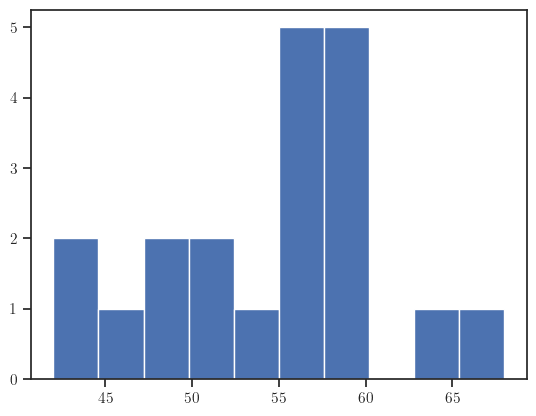

In [1991]:
plt.hist(windstorms_1min_adj)
shapiro(windstorms_1min_adj)

/Users/serena/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<Axes: >

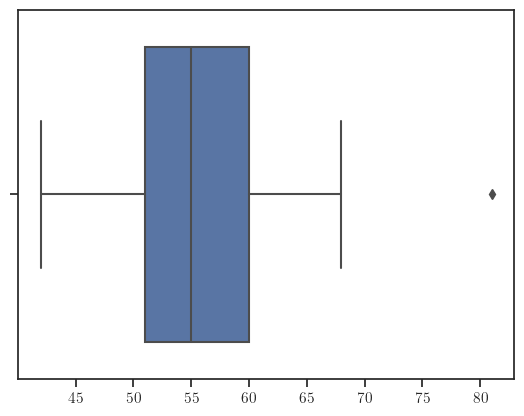

In [1979]:
sns.boxplot(windstorms_1min)

In [1986]:
windstorms_1min_adj = np.delete(windstorms_1min,0,None)
windstorms_1min_adj

array([53., 60., 42., 55., 52., 68., 55., 56., 60., 65., 58., 51., 42.,
       58., 48., 49., 60., 45., 57., 55.])

ShapiroResult(statistic=0.958858847618103, pvalue=0.5213109254837036)

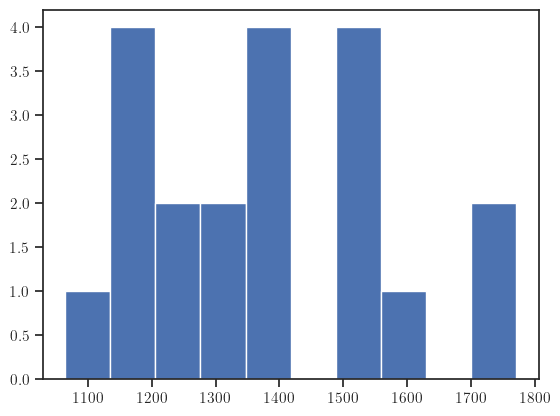

In [1992]:
plt.hist(yearly_hours_over_threshold_adj)
shapiro(yearly_hours_over_threshold_adj)

/Users/serena/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<Axes: >

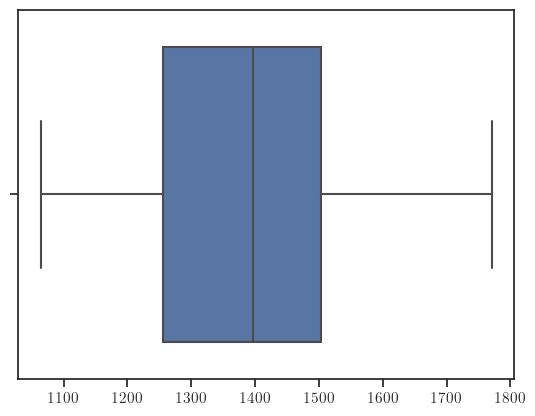

In [1980]:
sns.boxplot(yearly_hours_over_threshold)

In [1988]:
yearly_hours_over_threshold_adj = np.delete(yearly_hours_over_threshold,0,None)
yearly_hours_over_threshold_adj

array([1497.41666667, 1340.98333333, 1406.15      , 1770.7       ,
       1255.88333333, 1744.48333333, 1405.6       , 1064.38333333,
       1627.36666667, 1542.7       , 1524.35      , 1503.2       ,
       1148.46666667, 1396.61666667, 1160.03333333, 1151.66666667,
       1147.53333333, 1352.41666667, 1262.53333333, 1341.36666667])

In [1997]:
scipy.stats.spearmanr(windstorms_1min_adj, yearly_hours_over_threshold_adj) 

SignificanceResult(statistic=0.3267947796079957, pvalue=0.15962577835479666)

In [1998]:
scipy.stats.pearsonr(windstorms_1min_adj, yearly_hours_over_threshold_adj) 

PearsonRResult(statistic=0.4427086622654478, pvalue=0.05061201293215346)

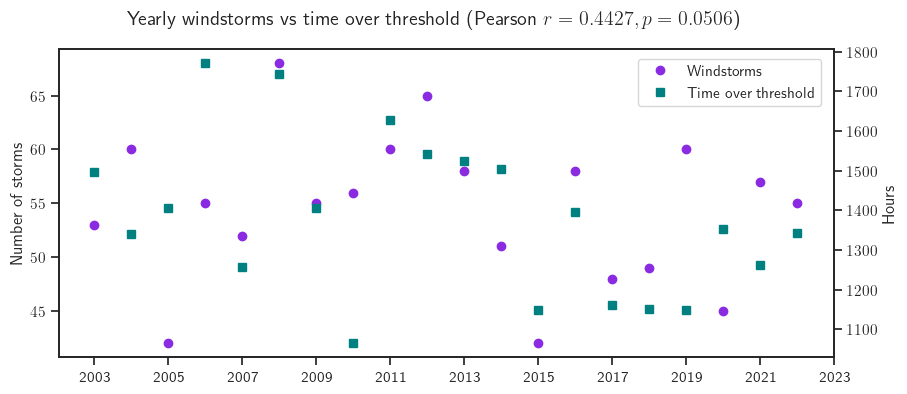

In [1999]:
fig, ax1 = plt.subplots(figsize=(10, 4))
ax2 = ax1.twinx()

ax1.plot(windstorms_1min_adj,'o', color='blueviolet', label='Windstorms')
ax2.plot(yearly_hours_over_threshold_adj,'s', color='teal', label='Time over threshold')

# ax1.set_xlabel("Year")
ax1.set_xticks(ticks = np.arange(0,21,2), labels = np.arange(2003,2024,2))
ax1.set_ylabel("Number of storms")
ax1.tick_params(axis="y")

ax2.set_ylabel("Hours")
ax2.tick_params(axis="y")
fig.legend(loc='upper right', bbox_to_anchor=(0.895, 0.875))

fig.suptitle(r"Yearly windstorms vs time over threshold (Pearson $r=0.4427,p=0.0506$)")
fig.savefig('yearly_comparison_adj2.pdf')

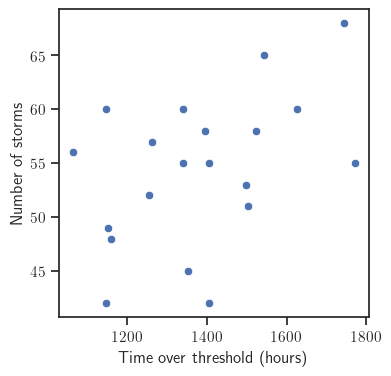

In [2007]:
plt.figure(figsize=(4,4))
sns.scatterplot(x=yearly_hours_over_threshold_adj,y=windstorms_1min_adj);
plt.xlabel('Time over threshold (hours)')
plt.ylabel('Number of storms')
plt.savefig('comparison_scatterplot.pdf',bbox_inches='tight')
plt.show()

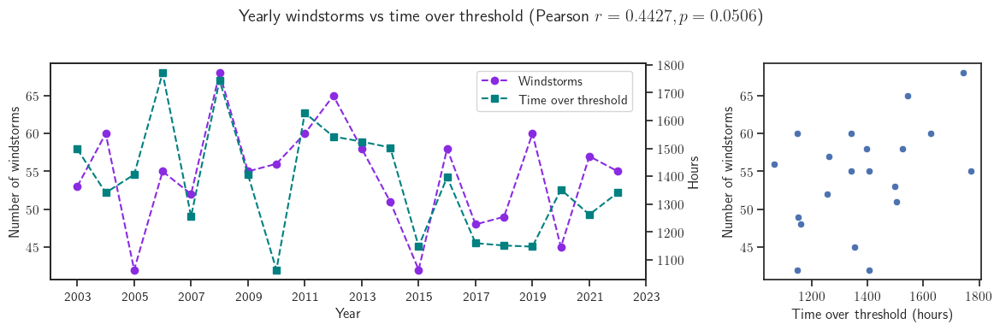

In [2072]:
fig, ax = plt.subplots(1, 2, figsize=(12,4), gridspec_kw={'width_ratios': [2.75, 1]})
ax2 = ax[0].twinx()

# sns.regplot(x=years,y=windstorms_1min,n_boot=500,robust=True,x_ci=95,color='blueviolet',label='Annual windstorm frequency', ax=ax[0,0]) 
ax[0].plot(windstorms_1min_adj,'o--', color='blueviolet', label='Windstorms')
ax2.plot(yearly_hours_over_threshold_adj,'s--', color='teal', label='Time over threshold')
ax[0].set_ylabel('Number of windstorms')
ax[0].set_xlabel('Year')
ax[0].set_xticks(ticks = np.arange(0,21,2), labels = np.arange(2003,2024,2))
ax2.set_ylabel('Hours')
fig.legend(loc='upper right', bbox_to_anchor=(0.635, 0.815))

# sns.residplot(x=years, y=windstorms_1min, scatter_kws={"s": 40}, color='blueviolet', label='Residuals', ax=ax[0,1]);

sns.scatterplot(x=yearly_hours_over_threshold_adj,y=windstorms_1min_adj, ax=ax[1]);
ax[1].set_xlabel('Time over threshold (hours)')
ax[1].set_ylabel('Number of windstorms')

fig.suptitle(r"Yearly windstorms vs time over threshold (Pearson $r=0.4427,p=0.0506$)")
fig.tight_layout(pad=1.5)
fig.savefig('yearly_comparison_w_scatterplot.pdf',bbox_inches='tight')

### Monthly

In [217]:
full_monthly_minutes_over_threshold = []
subset = ['Year', 'DOY', 'MST', f'Avg Wind Speed @ {height} [m/s]', f'Avg Wind Direction @ {height} [deg]', 'Temperature @ 2m [deg C]', 'Relative Humidity [%]']
# yearly_monthly_storms = [] #timeseries of windstorms computed monthly from 2002-2021 - may want to change shape to separate years later?

for i in np.arange(2002,2023,1): 
    year = i

    df = pd.read_csv(f'/Users/serena/Documents/Research/Data/{year}_data.csv', usecols=lambda x: x in subset)
    df.insert(2, 'Date', df['DOY'].apply(doy_to_date, args=(year,))) 
    df = df.replace(-99999.0, np.nan)
    df['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%Y') # convert date column to DateTime
    df.set_index('Date')
    
    sort = list(df.groupby(df['Date'].dt.month))
    monthly_data = []
    
    for k in range(len(sort)): #12
        monthly_data.append(sort[k][1])    

    for j in range(len(monthly_data)): #12
        monthly_data[j] = monthly_data[j].reset_index()
        monthly_data[j] = monthly_data[j].rename(columns={'index': 'Overall index'})
        
        # monthly_minutes_over_threshold.append(count_over_threshold(monthly_data[j]['Avg Wind Speed @ 10m [m/s]'], 4.5))
        full_monthly_minutes_over_threshold.append(count_over_thresholds(monthly_data[j]['Avg Wind Speed @ 10m [m/s]'], 4.5, monthly_data[j]['Avg Wind Direction @ 10m [deg]'], [247, 337]))

    print(f'Finished {year}')

Finished 2002
Finished 2003
Finished 2004
Finished 2005
Finished 2006
Finished 2007
Finished 2008
Finished 2009
Finished 2010
Finished 2011
Finished 2012
Finished 2013
Finished 2014
Finished 2015
Finished 2016
Finished 2017
Finished 2018
Finished 2019
Finished 2020
Finished 2021
Finished 2022


In [215]:
# 2022 only
full_monthly_hours_over_threshold = np.array(full_monthly_minutes_over_threshold)/60

full_monthly_hours_over_threshold

array([154.26666667, 156.3       , 106.71666667, 166.33333333,
        70.88333333,  61.45      ,  66.15      ,  65.25      ,
        43.16666667, 122.56666667,  68.95      , 259.33333333])

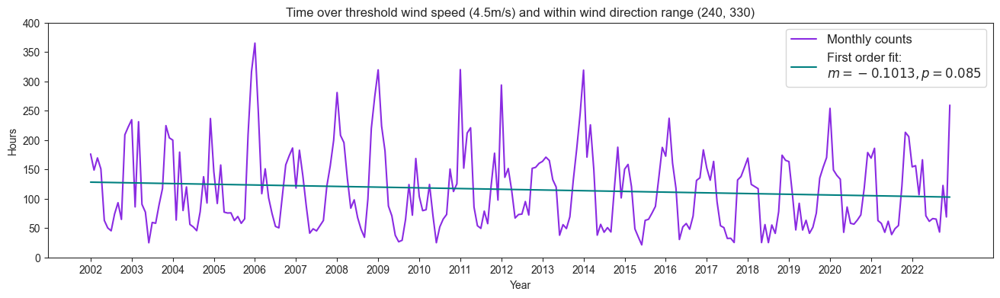

Slope of best fit: -0.10131571711772679


In [218]:
full_monthly_hours_over_threshold = np.array(full_monthly_minutes_over_threshold)/60

y = full_monthly_hours_over_threshold
x = np.arange(len(y))

mod = sm.OLS(y, sm.add_constant(x))
result = mod.fit()

plt.figure(figsize=(16,4))
plt.plot(x, full_monthly_hours_over_threshold,'-', color='blueviolet', label='Monthly counts')

trend = np.polyfit(x,full_monthly_hours_over_threshold, 1)
trendpoly = np.poly1d(trend) 

plt.plot(x,trendpoly(x), color='teal',label=f'First order fit: \n$m={np.round(trend[0],4)}, p={np.round(result.pvalues[1],4)}$')
plt.xlabel(f"Year")
plt.ylabel("Hours")
plt.xticks(ticks = (years-2002)*12, labels=years)
plt.yticks(ticks=plt.yticks()[0], labels=plt.yticks()[0].astype(int))
plt.legend(loc="best",prop={'size': 12}) 
plt.title(f"Time over threshold wind speed (4.5m/s) and within wind direction range (240, 330)")
# plt.savefig('full_monthly_timeoverthr.pdf')
plt.show()
print(f'Slope of best fit: {trend[0]}')

In [224]:
full_monthly_hours_over_threshold

array([176.2       , 148.78333333, 169.53333333, 150.65      ,
        63.01666667,  50.23333333,  45.31666667,  73.98333333,
        93.2       ,  64.71666667, 208.93333333, 222.46666667,
       234.61666667,  86.06666667, 231.16666667,  90.41666667,
        77.16666667,  24.95      ,  59.55      ,  58.15      ,
        89.75      , 117.38333333, 224.5       , 203.7       ,
       199.86666667,  63.61666667, 179.36666667,  79.9       ,
       120.1       ,  56.2       ,  51.88333333,  45.53333333,
        77.75      , 137.46666667,  92.66666667, 236.63333333,
       145.7       ,  91.88333333, 157.41666667,  77.15      ,
        75.61666667,  75.88333333,  62.81666667,  69.7       ,
        58.06666667,  65.7       , 209.71666667, 316.5       ,
       365.11666667, 246.38333333, 108.55      , 150.9       ,
       101.48333333,  74.68333333,  52.8       ,  50.33333333,
       103.35      , 157.68333333, 172.98333333, 186.43333333,
       118.18333333, 182.61666667, 138.98333333,  87.3 

In [230]:
np.mean(full_monthly_hours_over_threshold[0::12])

210.72460317460315

In [227]:
np.mean(full_monthly_hours_over_threshold[1::12])

152.94603174603176

In [231]:
average_hours_over_threshold = np.zeros(12)

for i in range(12):
    average_hours_over_threshold[i] = np.mean(full_monthly_hours_over_threshold[i::12])

In [232]:
average_hours_over_threshold

array([210.72460317, 152.94603175, 148.53015873, 115.63968254,
        64.90555556,  55.45952381,  50.87460317,  56.72222222,
        64.1952381 , 116.21111111, 157.63571429, 192.38809524])

#### Some regression stuff

In [206]:
(np.std(full_monthly_hours_over_threshold))**2

4641.440907981288

In [207]:
np.mean(full_monthly_hours_over_threshold)

115.70631944444446

In [118]:
x = full_months
y = full_monthly_hours_over_threshold

# Fit the Negative Binomial Regression model
nb_model = sm.GLM(y, sm.add_constant(x), family=sm.families.NegativeBinomial())
nb_results = nb_model.fit()

# Print the summary of the model
print(nb_results.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                  252
Model:                            GLM   Df Residuals:                      250
Model Family:        NegativeBinomial   Df Model:                            1
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1449.4
Date:                Fri, 03 Mar 2023   Deviance:                       87.043
Time:                        14:39:42   Pearson chi2:                     84.3
No. Iterations:                     5   Pseudo R-squ. (CS):           0.004083
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.8598      0.127     38.302      0.0

In [119]:
x = full_months
y = full_monthly_hours_over_threshold

# Fit the Poisson Regression model
p_model = sm.GLM(y, sm.add_constant(x), family=sm.families.Poisson())
p_results = p_model.fit()

# Print the summary of the model
print(p_results.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                  252
Model:                            GLM   Df Residuals:                      250
Model Family:                 Poisson   Df Model:                            1
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -5512.3
Date:                Fri, 03 Mar 2023   Deviance:                       9408.7
Time:                        14:39:42   Pearson chi2:                 9.84e+03
No. Iterations:                     4   Pseudo R-squ. (CS):             0.3753
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.8584      0.011    424.516      0.0

In [127]:
x = full_months
y = full_monthly_hours_over_threshold

# Fit the GLS model
glm_model = sm.GLS(y, sm.add_constant(x))
glm_results = glm_model.fit()

# Print the summary of the model
print(glm_results.summary())

                            GLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.012
Model:                            GLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     2.991
Date:                Fri, 03 Mar 2023   Prob (F-statistic):             0.0850
Time:                        14:42:50   Log-Likelihood:                -1418.6
No. Observations:                 252   AIC:                             2841.
Df Residuals:                     250   BIC:                             2848.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        128.3358      8.548     15.013      0.0

#### Plotting

In [220]:
months = np.arange(1,13)
month_names = ["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"]

monthly_minutes_over_threshold = np.zeros(12)
for i in range(len(monthly_data)): 
    monthly_data[i] = monthly_data[i].reset_index()
    monthly_data[i] = monthly_data[i].rename(columns={'index': 'Overall index'})
    
    monthly_minutes_over_threshold[i] = count_over_thresholds(monthly_data[i]['Avg Wind Speed @ 10m [m/s]'], 4.5, monthly_data[i]['Avg Wind Direction @ 10m [deg]'], [240, 330])
                                                           
    print(f'Total hours over threshold in month {i+1}: {monthly_minutes_over_threshold[i]/60}')
    
monthly_hours_over_threshold = np.array(monthly_minutes_over_threshold)/60

Total hours over threshold in month 1: 153.81666666666666
Total hours over threshold in month 2: 155.6
Total hours over threshold in month 3: 106.38333333333334
Total hours over threshold in month 4: 166.71666666666667
Total hours over threshold in month 5: 71.45
Total hours over threshold in month 6: 60.11666666666667
Total hours over threshold in month 7: 64.16666666666667
Total hours over threshold in month 8: 63.15
Total hours over threshold in month 9: 41.4
Total hours over threshold in month 10: 124.2
Total hours over threshold in month 11: 69.35
Total hours over threshold in month 12: 262.75


Text(0.5, 0.98, 'Monthly windstorms vs time over threshold (2002-2022)')

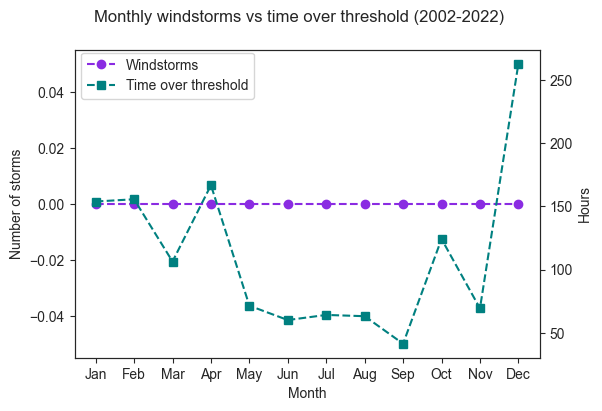

In [194]:
fig, ax1 = plt.subplots(figsize=(6, 4))
ax2 = ax1.twinx()

ax1.plot(months, monthly_storms,'o--', color='blueviolet', label='Windstorms')
ax2.plot(months, monthly_hours_over_threshold,'s--', color='teal', label='Time over threshold')

ax1.set_xlabel("Month")
ax1.set_xticks(ticks = months,labels=month_names)
ax1.set_ylabel("Number of storms")
ax1.tick_params(axis="y")

ax2.set_ylabel("Hours")
ax2.tick_params(axis="y")
fig.legend(loc='upper left', bbox_to_anchor=(0.125, 0.89))

fig.suptitle("Monthly windstorms vs time over threshold (2002-2022)")
# fig.savefig('MFA_figures_monthly_comparison.pdf')

In [195]:
# 2002-2022
dfm = {'Month': months, 'Number of hours': monthly_hours_over_threshold}
dfm = pd.DataFrame(data=dfm)
# dfm = dfm.set_index('Month')
dfm

,Month,Number of hours
0,1,153.816667
1,2,155.600000
2,3,106.383333
3,4,166.716667
4,5,71.450000
5,6,60.116667
6,7,64.166667
7,8,63.150000
8,9,41.400000
9,10,124.200000


In [209]:
# 2002-2021
dfm = {'Month': months, 'Number of hours': monthly_hours_over_threshold}
dfm = pd.DataFrame(data=dfm)
# dfm = dfm.set_index('Month')
dfm

,Month,Number of hours
0,1,165.633333
1,2,185.633333
2,3,63.233333
3,4,55.966667
4,5,38.500000
5,6,60.133333
6,7,36.716667
7,8,48.566667
8,9,53.400000
9,10,119.500000


In [233]:
# correct averages
dfm = {'Month': months, 'Number of hours': average_hours_over_threshold}
dfm = pd.DataFrame(data=dfm)
# dfm = dfm.set_index('Month')
dfm

,Month,Number of hours
0,1,210.724603
1,2,152.946032
2,3,148.530159
3,4,115.639683
4,5,64.905556
5,6,55.459524
6,7,50.874603
7,8,56.722222
8,9,64.195238
9,10,116.211111


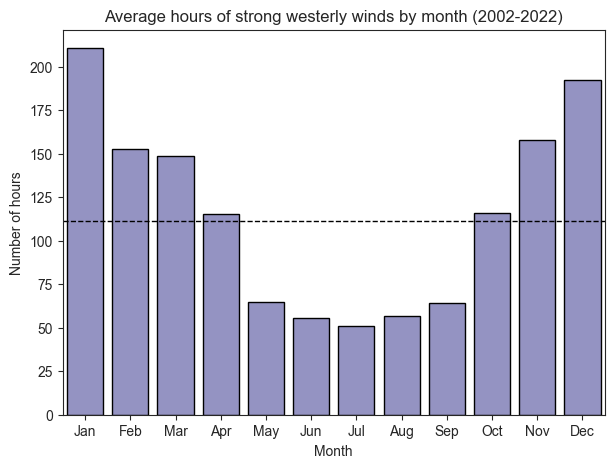

In [236]:
plt.figure(figsize=(7, 5))
sns.barplot(
    data=dfm, x="Month", y="Number of hours", 
    label="Observations", color='#8c8bca', edgecolor='black') 
# plt.xlabel(f"Month")
plt.axhline(monthly_hours_over_threshold.mean(), color='k', linestyle='dashed', linewidth=1)
plt.xticks(ticks = np.arange(0,12,1), labels=month_names)
plt.title(f"Average hours of strong westerly winds by month (2002-2022)")
plt.savefig(f'monthly_toth_barplot.pdf')

In [ ]:
average_hours_over_threshold

#### Deseasonalizing

In [772]:
toth_df = {'Month': np.concatenate([months]*21).ravel(), 'Year': np.repeat((years), 12), 'Time over threshold': full_monthly_hours_over_threshold}
toth_df = pd.DataFrame(data=toth_df)
toth_df

,Month,Year,Time over threshold
0,1,2002,176.200000
1,2,2002,148.783333
2,3,2002,169.533333
3,4,2002,150.650000
4,5,2002,63.016667
...,...,...,...
247,8,2022,65.250000
248,9,2022,43.166667
249,10,2022,122.566667
250,11,2022,68.950000


In [773]:
analysis = toth_df[['Time over threshold']].copy()

s_dec_additive = seasonal_decompose(analysis, model = "additive", period=12, extrapolate_trend='freq')

observed_sd_toth = s_dec_additive.observed
trend_sd_toth = s_dec_additive.trend
seasonal_sd_toth = s_dec_additive.seasonal
residual_sd_toth = s_dec_additive.resid

decomposed_df_toth = pd.DataFrame({"Observed":observed_sd_toth, "Trend":trend_sd_toth, "Seasonal":seasonal_sd_toth, "Residual":residual_sd_toth})
decomposed_df_toth

,Observed,Trend,Seasonal,Residual
0,176.200000,123.943714,95.215422,-42.959135
1,148.783333,123.898834,37.414979,-12.530481
2,169.533333,123.853955,33.117844,12.561534
3,150.650000,123.809076,0.213996,26.626928
4,63.016667,123.764197,-50.355031,-10.392499
...,...,...,...,...
247,65.250000,125.786743,-58.929782,-1.606961
248,43.166667,127.390589,-51.423418,-32.800505
249,122.566667,128.994436,0.609600,-7.037369
250,68.950000,130.598282,41.911104,-103.559385


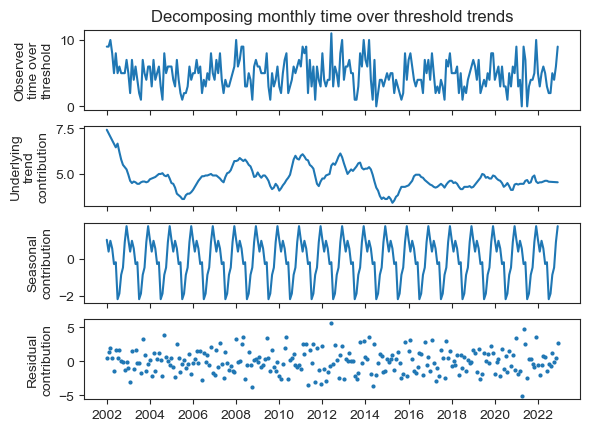

In [774]:
fig, ax = plt.subplots(4, 
           sharex='col', sharey='row')

ax[0].plot(decomposed_df['Observed'])
ax[0].set(title='Decomposing monthly time over threshold trends',
          ylabel='Observed\ntime over\nthreshold')

ax[1].plot(decomposed_df['Trend'])
ax[1].set(ylabel='Underlying\ntrend\ncontribution')

ax[2].plot(decomposed_df['Seasonal'])
ax[2].set(ylabel='Seasonal\ncontribution')

ax[3].plot(decomposed_df['Residual'], 'o', markersize=2)
ax[3].set(ylabel='Residual\ncontribution')
ax[3].set_xticks(np.arange(0,252,24))
ax[3].set_xticklabels(np.arange(2002,2023,2), fontsize=10)

plt.show()

fig.savefig("detrended_timeoverthr.pdf",bbox_inches="tight")

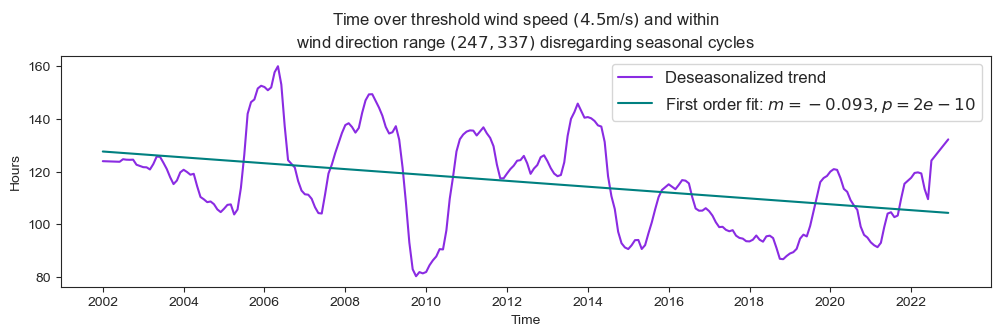

Slope of best fit: -0.09265228634133987


In [775]:
y = trend_sd_toth
x = np.arange(len(y))
x = sm.add_constant(x)

mod = sm.OLS(y, x)
result = mod.fit()

plt.figure(figsize=(12,3))
plt.plot(trend_sd_toth, color='blueviolet', label='Deseasonalized trend')

trend = np.polyfit(x=np.arange(0,252,1) , y=trend_sd_toth, deg=1)
trendpoly = np.poly1d(trend) 

plt.plot(np.arange(0,252,1),trendpoly(np.arange(0,252,1)), color='teal',label=f'First order fit: $m={np.round(trend[0],3)}, p={np.round(result.pvalues[1],10)}$')
plt.xlabel("Time")
plt.ylabel("Hours")
plt.xticks(ticks = np.arange(0,253,24), labels=np.arange(2002,2023,2))
plt.legend(loc="best",prop={'size': 12}) 
plt.title(f"Time over threshold wind speed $(4.5$m/s$)$ and within\nwind direction range $(247, 337)$ disregarding seasonal cycles")
plt.savefig(f'des_timeoverthr.pdf',bbox_inches="tight")
plt.show()
print(f'Slope of best fit: {trend[0]}')

In [794]:
scipy.stats.pearsonr(full_months, trend_sd_toth) 

PearsonRResult(statistic=-0.3858655486224325, pvalue=2.2637002796016573e-10)

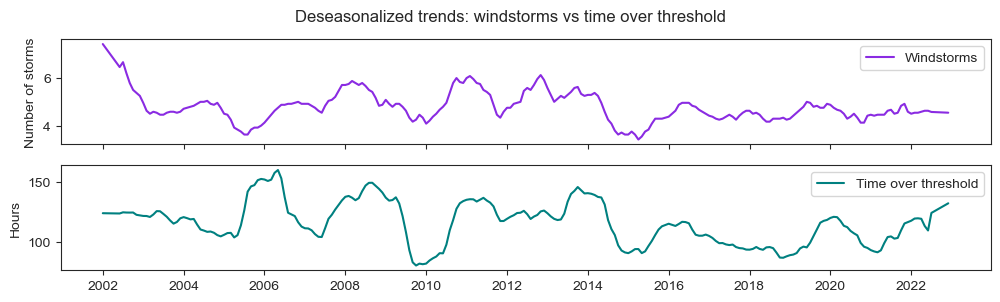

In [806]:
fig, ax = plt.subplots(2, sharex=True, figsize=(12,3))

ax[0].plot(windstorm_trend, color='blueviolet', label='Windstorms')
ax[1].plot(trend_sd_toth, color='teal', label='Time over threshold')

ax[0].set_xticks(ticks = np.arange(0,253,24), labels=np.arange(2002,2023,2))
ax[0].set_ylabel("Number of storms")
ax[0].tick_params(axis="y")
ax[0].legend(loc='upper right')

ax[1].set_ylabel("Hours")
ax[1].tick_params(axis="y")
ax[1].legend(loc='upper right')

fig.suptitle("Deseasonalized trends: windstorms vs time over threshold")
fig.savefig('full_des_comparison.pdf',bbox_inches='tight')

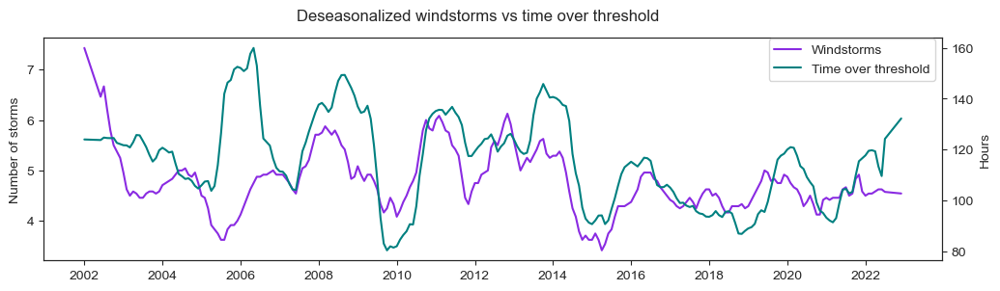

In [777]:
fig, ax1 = plt.subplots(figsize=(12, 3))
ax2 = ax1.twinx()

ax1.plot(windstorm_trend, color='blueviolet', label='Windstorms')
ax2.plot(trend_sd_toth, color='teal', label='Time over threshold')

ax1.set_xticks(ticks = np.arange(0,253,24), labels=np.arange(2002,2023,2))
ax1.set_ylabel("Number of storms")
ax1.tick_params(axis="y")

ax2.set_ylabel("Hours")
ax2.tick_params(axis="y")
fig.legend(loc='upper right', bbox_to_anchor=(0.9, 0.9))

fig.suptitle("Deseasonalized windstorms vs time over threshold")
fig.savefig('full_des_comparison2.pdf')

In [802]:
scipy.stats.spearmanr(windstorm_trend, trend_sd_toth) 

SpearmanrResult(correlation=0.5798811193180082, pvalue=4.846572817649325e-24)

In [803]:
scipy.stats.kendalltau(windstorm_trend, trend_sd_toth) 

KendalltauResult(correlation=0.42003481915469093, pvalue=5.0504928051726e-23)

In [804]:
scipy.stats.pearsonr(windstorm_trend, trend_sd_toth) 

PearsonRResult(statistic=0.4724919731631878, pvalue=2.030432955162836e-15)

## Figures for paper

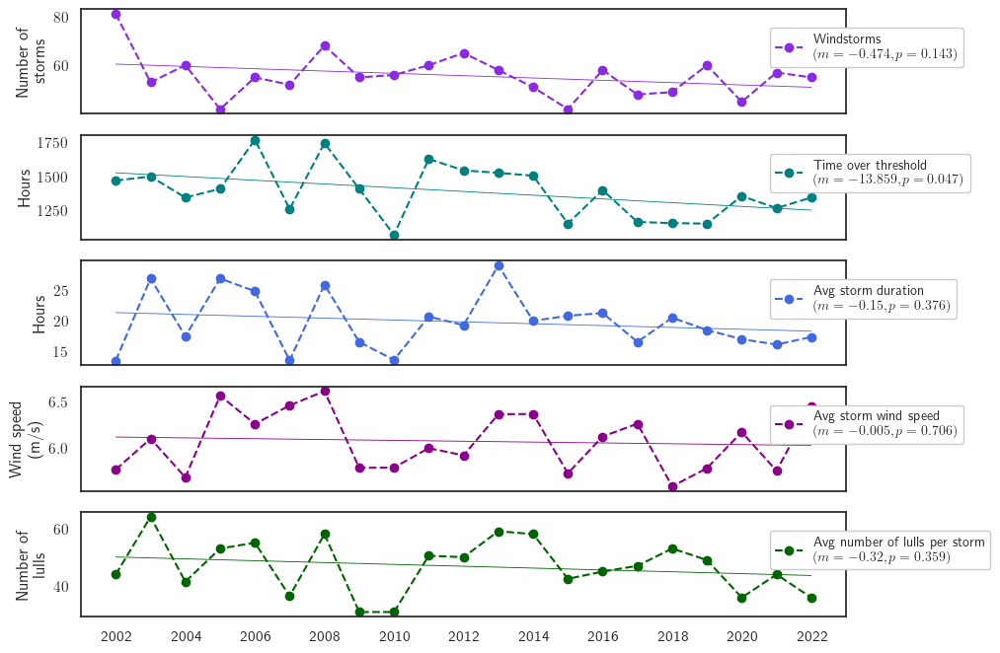

In [1588]:
y = windstorms_1min
x = np.arange(len(y))
x = sm.add_constant(x)
mod = sm.OLS(y, x)
result = mod.fit()

y2 = yearly_hours_over_threshold
x2 = np.arange(len(y2))
x2 = sm.add_constant(x2)
mod2 = sm.OLS(y2, x2)
result2 = mod2.fit()

y3 = storm_durations_median
x3 = np.arange(len(y3))
x3 = sm.add_constant(x3)
mod3 = sm.OLS(y3, x3)
result3 = mod3.fit()

y4 = storm_speeds_median
x4 = np.arange(len(y4))
x4 = sm.add_constant(x4)
mod4 = sm.OLS(y4, x4)
result4 = mod4.fit()

y5 = lulls_perstorm_median
x5 = np.arange(len(y5))
x5 = sm.add_constant(x5)
mod5 = sm.OLS(y5, x5)
result5 = mod5.fit()

trend = np.polyfit(years,windstorms_1min, 1)
trendpoly = np.poly1d(trend) 
trend2 = np.polyfit(years,yearly_hours_over_threshold, 1)
trendpoly2 = np.poly1d(trend2) 
trend3 = np.polyfit(years,storm_durations_median, 1)
trendpoly3 = np.poly1d(trend3) 
trend4 = np.polyfit(years,storm_speeds_median, 1)
trendpoly4 = np.poly1d(trend4) 
trend5 = np.polyfit(years,lulls_perstorm_median, 1)
trendpoly5 = np.poly1d(trend5) 

fig, ax = plt.subplots(5, sharex=True, figsize=(10,8))

ax[0].plot(windstorms_1min, 'o--', color='blueviolet', label=f'Windstorms\n$(m={np.round(trend[0],3)}, p={np.round(result.pvalues[1],3)})$')
ax[0].plot(trendpoly(years), linewidth=0.6, color='blueviolet')
ax[0].set_xticks(ticks=np.arange(0,22,2),labels=years[::2])
ax[0].set_ylabel("Number of\nstorms")
ax[0].tick_params(axis="y")
ax[0].legend(prop={'size': 10},loc=(.9, .45),fancybox=True, framealpha=1) 

ax[1].plot(yearly_hours_over_threshold, 'o--', color='teal', label=f'Time over threshold\n$(m={np.round(trend2[0],3)}, p={np.round(result2.pvalues[1],3)})$')
ax[1].plot(trendpoly2(years), linewidth=0.6, color='teal')
ax[1].set_ylabel("Hours")
ax[1].tick_params(axis="y")
ax[1].legend(prop={'size': 10},loc=(.9, .45),fancybox=True, framealpha=1) 

ax[2].plot(storm_durations_median, 'o--', color='royalblue', label=f'Avg storm duration\n$(m={np.round(trend3[0],3)}, p={np.round(result3.pvalues[1],3)})$')
ax[2].plot(trendpoly3(years), linewidth=0.6, color='royalblue')
ax[2].set_ylabel("Hours")
ax[2].tick_params(axis="y")
ax[2].legend(prop={'size': 10},loc=(.9, .45),fancybox=True, framealpha=1) 

ax[3].plot(storm_speeds_median, 'o--', color='darkmagenta', label=f'Avg storm wind speed\n$(m={np.round(trend4[0],3)}, p={np.round(result4.pvalues[1],3)})$')
ax[3].plot(trendpoly4(years), linewidth=0.6, color='darkmagenta')
ax[3].set_ylabel("Wind speed \n(m/s)")
ax[3].tick_params(axis="y")
ax[3].legend(prop={'size': 10},loc=(.9, .45),fancybox=True, framealpha=1) 

ax[4].plot(lulls_perstorm_median, 'o--', color='darkgreen', label=f'Avg number of lulls per storm\n$(m={np.round(trend5[0],3)}, p={np.round(result5.pvalues[1],3)})$')
ax[4].plot(trendpoly5(years), linewidth=0.6, color='darkgreen')
ax[4].set_ylabel("Number of\nlulls")
ax[4].tick_params(axis="y")
ax[4].legend(prop={'size': 10},loc=(.9, .45),fancybox=True, framealpha=1) 


# fig.suptitle("")
# fig.savefig('f_trends3.pdf',bbox_inches='tight')

In [1590]:
gls_params[0]+x*gls_params[1]

array([60.45454545, 59.98051948, 59.50649351, 59.03246753, 58.55844156,
       58.08441558, 57.61038961, 57.13636364, 56.66233766, 56.18831169,
       55.71428571, 55.24025974, 54.76623377, 54.29220779, 53.81818182,
       53.34415584, 52.87012987, 52.3961039 , 51.92207792, 51.44805195,
       50.97402597])

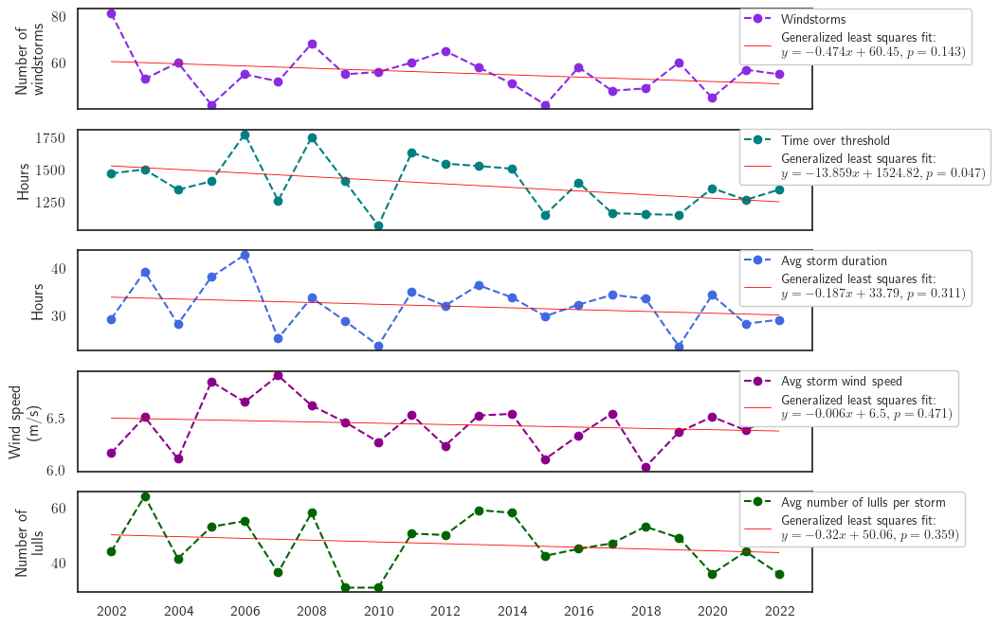

In [1600]:
y = windstorms_1min
x = np.arange(len(y))
mod = sm.GLS(y, sm.add_constant(x))
result = mod.fit()
gls_params = result.params
trendpoly = gls_params[0]+x*gls_params[1]

y2 = yearly_hours_over_threshold
x2 = np.arange(len(y2))
mod2 = sm.GLS(y2, sm.add_constant(x2))
result2 = mod2.fit()
gls_params2 = result2.params
trendpoly2 = gls_params2[0]+x*gls_params2[1]

y3 = storm_durations_mean
x3 = np.arange(len(y3))
mod3 = sm.GLS(y3, sm.add_constant(x3))
result3 = mod3.fit()
gls_params3 = result3.params
trendpoly3 = gls_params3[0]+x*gls_params3[1]

y4 = storm_speeds_mean
x4 = np.arange(len(y4))
mod4 = sm.GLS(y4, sm.add_constant(x4))
result4 = mod4.fit()
gls_params4 = result4.params
trendpoly4 = gls_params4[0]+x*gls_params4[1]

y5 = lulls_perstorm_median
x5 = np.arange(len(y5))
mod5 = sm.GLS(y5, sm.add_constant(x5))
result5 = mod5.fit()
gls_params5 = result5.params
trendpoly5 = gls_params5[0]+x*gls_params5[1]

fig, ax = plt.subplots(5, sharex=True, figsize=(10,8))

ax[0].plot(windstorms_1min, 'o--', color='blueviolet', label=f'Windstorms')
ax[0].plot(trendpoly, linewidth=0.6, color='red',label=f'Generalized least squares fit: \n$y = {np.round(gls_params[1],3)}x +{np.round(gls_params[0],2)}, \,p={np.round(result.pvalues[1],3)})$')
ax[0].set_xticks(ticks=np.arange(0,22,2),labels=years[::2])
ax[0].set_ylabel("Number of\nwindstorms")
ax[0].tick_params(axis="y")
ax[0].legend(prop={'size': 10},loc=(.9, .45),fancybox=True, framealpha=1) 

ax[1].plot(yearly_hours_over_threshold, 'o--', color='teal', label=f'Time over threshold')
ax[1].plot(trendpoly2, linewidth=0.6, color='red',label=f'Generalized least squares fit: \n$y = {np.round(gls_params2[1],3)}x +{np.round(gls_params2[0],2)}, \,p={np.round(result2.pvalues[1],3)})$')
ax[1].set_ylabel("Hours")
ax[1].tick_params(axis="y")
ax[1].legend(prop={'size': 10},loc=(.9, .45),fancybox=True, framealpha=1) 

ax[2].plot(storm_durations_mean, 'o--', color='royalblue', label=f'Avg storm duration')
ax[2].plot(trendpoly3, linewidth=0.6, color='red',label=f'Generalized least squares fit: \n$y = {np.round(gls_params3[1],3)}x +{np.round(gls_params3[0],2)}, \,p={np.round(result3.pvalues[1],3)})$')
ax[2].set_ylabel("Hours")
ax[2].tick_params(axis="y")
ax[2].legend(prop={'size': 10},loc=(.9, .45),fancybox=True, framealpha=1) 

ax[3].plot(storm_speeds_mean, 'o--', color='darkmagenta', label=f'Avg storm wind speed')
ax[3].plot(trendpoly4, linewidth=0.6, color='red',label=f'Generalized least squares fit: \n$y = {np.round(gls_params4[1],3)}x +{np.round(gls_params4[0],2)}, \,p={np.round(result4.pvalues[1],3)})$')
ax[3].set_ylabel("Wind speed \n(m/s)")
ax[3].tick_params(axis="y")
ax[3].legend(prop={'size': 10},loc=(.9, .45),fancybox=True, framealpha=1) 

ax[4].plot(lulls_perstorm_median, 'o--', color='darkgreen', label=f'Avg number of lulls per storm')
ax[4].plot(trendpoly5, linewidth=0.6, color='red',label=f'Generalized least squares fit: \n$y = {np.round(gls_params5[1],3)}x +{np.round(gls_params5[0],2)}, \,p={np.round(result5.pvalues[1],3)})$')
ax[4].set_ylabel("Number of\nlulls")
ax[4].tick_params(axis="y")
ax[4].legend(prop={'size': 10},loc=(.9, .45),fancybox=True, framealpha=1) 


# fig.suptitle("")
fig.savefig('annual_trends.pdf',bbox_inches='tight')

In [18]:
y = windstorms_1min
x = np.arange(len(y))
x = sm.add_constant(x)
mod = sm.OLS(y, x)
result = mod.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.109
Model:                            OLS   Adj. R-squared:                  0.062
Method:                 Least Squares   F-statistic:                     2.329
Date:                Fri, 10 Feb 2023   Prob (F-statistic):              0.143
Time:                        14:43:01   Log-Likelihood:                -73.979
No. Observations:                  21   AIC:                             152.0
Df Residuals:                      19   BIC:                             154.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         60.4545      3.631     16.650      0.0

In [1900]:
y = windstorms_1min
x = np.arange(len(y))

GLS_model = sm.GLS(y, sm.add_constant(x))
result = GLS_model.fit()
print(result.summary())

gls_params = result.params
gls_trendpoly = gls_params[0]+x*gls_params[1]

                            GLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.109
Model:                            GLS   Adj. R-squared:                  0.062
Method:                 Least Squares   F-statistic:                     2.329
Date:                Fri, 31 Mar 2023   Prob (F-statistic):              0.143
Time:                        17:28:35   Log-Likelihood:                -73.979
No. Observations:                  21   AIC:                             152.0
Df Residuals:                      19   BIC:                             154.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         60.4545      3.631     16.650      0.0

In [1901]:
y = windstorms_1min
x = years

poisson_model = sm.GLM(y, sm.add_constant(x), family=sm.families.Poisson())
result = poisson_model.fit()

print(result.summary())

poisson_params = result.params
poisson_trendpoly = np.exp(poisson_params[1]*X+poisson_params[0])

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                   21
Model:                            GLM   Df Residuals:                       19
Model Family:                 Poisson   Df Model:                            1
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -73.674
Date:                Fri, 31 Mar 2023   Deviance:                       24.507
Time:                        17:30:32   Pearson chi2:                     24.5
No. Iterations:                     4   Pseudo R-squ. (CS):             0.1375
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         21.1465      9.720      2.175      0.0

In [1907]:
y = windstorms_1min
x = years

nb_model = sm.GLM(y, sm.add_constant(x), family=sm.families.NegativeBinomial())
result = nb_model.fit()

print(result.summary())

nb_params = result.params
nb_trendpoly = np.exp(nb_params[1]*x+nb_params[0])

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                   21
Model:                            GLM   Df Residuals:                       19
Model Family:        NegativeBinomial   Df Model:                            1
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -105.59
Date:                Fri, 31 Mar 2023   Deviance:                      0.42563
Time:                        17:31:40   Pearson chi2:                    0.421
No. Iterations:                     4   Pseudo R-squ. (CS):           0.002550
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         20.7814     73.158      0.284      0.7

In [1908]:
nb_trendpoly

array([60.47616798, 59.97441866, 59.47683217, 58.98337399, 58.49400985,
       58.00870579, 57.52742813, 57.05014346, 56.57681865, 56.10742085,
       55.64191748, 55.18027622, 54.72246504, 54.26845215, 53.81820605,
       53.37169548, 52.92888945, 52.48975722, 52.05426832, 51.62239252,
       51.19409983])

In [1911]:
from sklearn.metrics import mean_squared_error
  
# Given values
Y_true = windstorms_1min 
  
# calculated values
Y_pred1 = gls_trendpoly
Y_pred2 = poisson_trendpoly
Y_pred3 = nb_trendpoly
  
# Calculation of Mean Squared Error (MSE)
print(mean_squared_error(Y_true,Y_pred1))
print(mean_squared_error(Y_true,Y_pred2))
print(mean_squared_error(Y_true,Y_pred3))

67.20315398886828
67.01210006590725
67.02377008258794


In [1913]:
print(mean_squared_error(Y_true,Y_pred1)/np.var(Y_true))
print(mean_squared_error(Y_true,Y_pred2)/np.var(Y_true))
print(mean_squared_error(Y_true,Y_pred3)/np.var(Y_true))

0.890790228707271
0.8882577736418723
0.8884124618701917


In [24]:
windstorms_1min.astype(int)

array([81, 53, 60, 42, 55, 52, 68, 55, 56, 60, 65, 58, 51, 42, 58, 48, 49,
       60, 45, 57, 55])

In [ ]:
with open('windstorms.txt', 'w') as f:
    f.write('\n'.join([' '.join(l2) for l2 in l1]))

In [889]:
scipy.stats.pearsonr(windstorms_1min, yearly_hours_over_threshold) 

PearsonRResult(statistic=0.39590867202515573, pvalue=0.07563357947062485)

In [890]:
scipy.stats.pearsonr(windstorms_1min, storm_durations_median) 

PearsonRResult(statistic=-0.1704493309620961, pvalue=0.460089313928681)

In [891]:
scipy.stats.pearsonr(windstorms_1min, storm_speeds_median) 

PearsonRResult(statistic=-0.1711634690037001, pvalue=0.4581834762103872)

In [892]:
scipy.stats.pearsonr(windstorms_1min, lulls_perstorm_median) 

PearsonRResult(statistic=0.06751628163476973, pvalue=0.7712159395297056)

NameError: name 'month_abbrev' is not defined

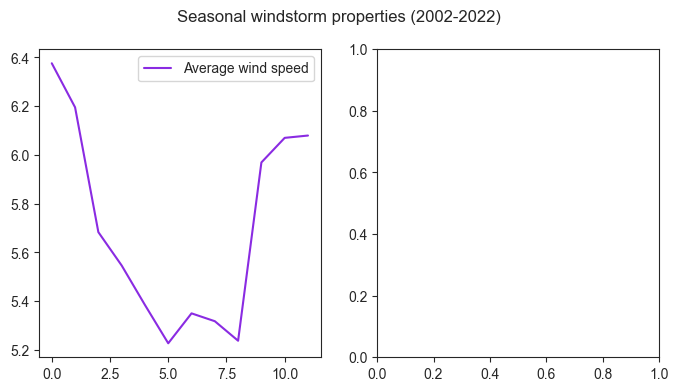

In [602]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
fig.suptitle('Seasonal windstorm properties (2002-2022)')
ax1.plot(storm_speeds_monthly, color='blueviolet', label='Average wind speed')
ax1.legend(loc='upper right')
ax1.set_xticks(ticks = np.arange(0,12), labels = month_abbrev)
ax1.set_ylabel("Wind speed (m/s)")

ax2.plot(storm_durations_monthly, color='blueviolet', label='Average windstorm duration')
ax2.set_xticks(ticks = np.arange(0,12), labels = month_abbrev)
ax2.set_ylabel("Hours")
ax2.legend(loc='upper right')

# fig.savefig('windstorm_property_comparison.pdf')

Text(0.5, 0.98, 'Monthly windstorms vs time over threshold (2002-2022)')

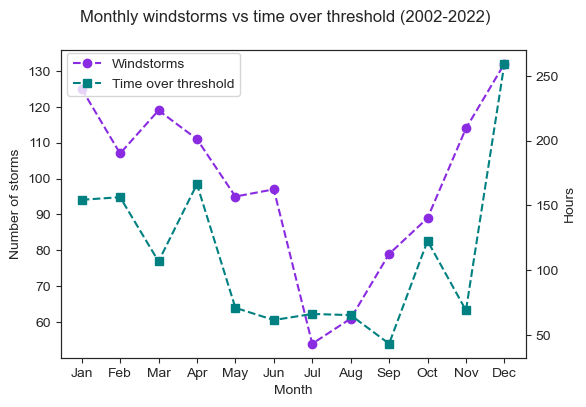

In [894]:
fig, ax1 = plt.subplots(figsize=(6, 4))
ax2 = ax1.twinx()

ax1.plot(months, monthly_storms,'o--', color='blueviolet', label='Windstorms')
ax2.plot(months, monthly_hours_over_threshold,'s--', color='teal', label='Time over threshold')

ax1.set_xlabel("Month")
ax1.set_xticks(ticks = months,labels=month_names)
ax1.set_ylabel("Number of storms")
ax1.tick_params(axis="y")

ax2.set_ylabel("Hours")
ax2.tick_params(axis="y")
fig.legend(loc='upper left', bbox_to_anchor=(0.125, 0.89))

fig.suptitle("Monthly windstorms vs time over threshold (2002-2022)")
# fig.savefig('monthly_comparison.pdf')

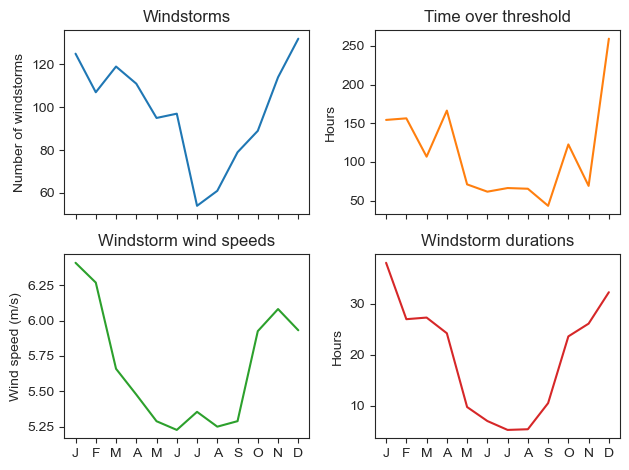

In [910]:
fig, axs = plt.subplots(2, 2,sharex=True)
axs[0, 0].plot(monthly_storms)
axs[0, 0].set_title('Windstorms')
axs[0, 0].set_ylabel('Number of windstorms')

axs[0, 1].plot(monthly_hours_over_threshold, 'tab:orange')
axs[0, 1].set_title('Time over threshold')
axs[0, 1].set_ylabel('Hours')

axs[1, 0].plot(storm_speeds_monthly, 'tab:green')
axs[1, 0].set_title('Windstorm wind speeds')
axs[1, 0].set_ylabel('Wind speed (m/s)')

axs[1, 1].plot(storm_durations_monthly, 'tab:red')
axs[1, 1].set_title('Windstorm durations')
axs[1, 1].set_ylabel('Hours')

axs[0,0].set_xticks(ticks = np.arange(0,12,1),labels=month_abbrev)
    
fig.tight_layout()
fig.savefig('f_seasonal.pdf')

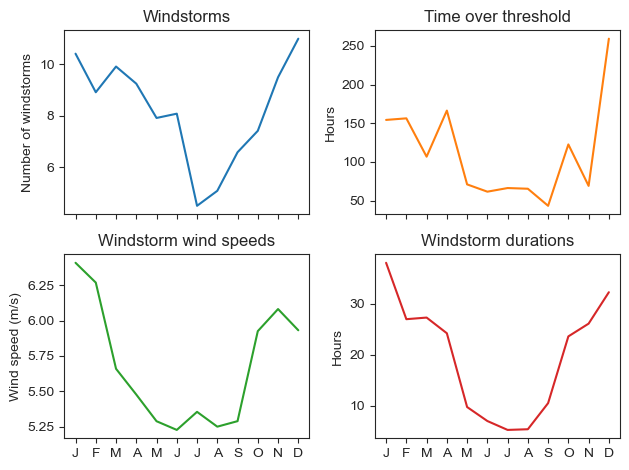

In [923]:
fig, axs = plt.subplots(2, 2,sharex=True)
axs[0, 0].plot(monthly_storms/12)
axs[0, 0].set_title('Windstorms')
axs[0, 0].set_ylabel('Number of windstorms')

axs[0, 1].plot(monthly_hours_over_threshold, 'tab:orange')
axs[0, 1].set_title('Time over threshold')
axs[0, 1].set_ylabel('Hours')

axs[1, 0].plot(storm_speeds_monthly, 'tab:green')
axs[1, 0].set_title('Windstorm wind speeds')
axs[1, 0].set_ylabel('Wind speed (m/s)')

axs[1, 1].plot(storm_durations_monthly, 'tab:red')
axs[1, 1].set_title('Windstorm durations')
axs[1, 1].set_ylabel('Hours')

axs[0,0].set_xticks(ticks = np.arange(0,12,1),labels=month_abbrev)
    
fig.tight_layout()
fig.savefig('f_seasonal2.pdf')

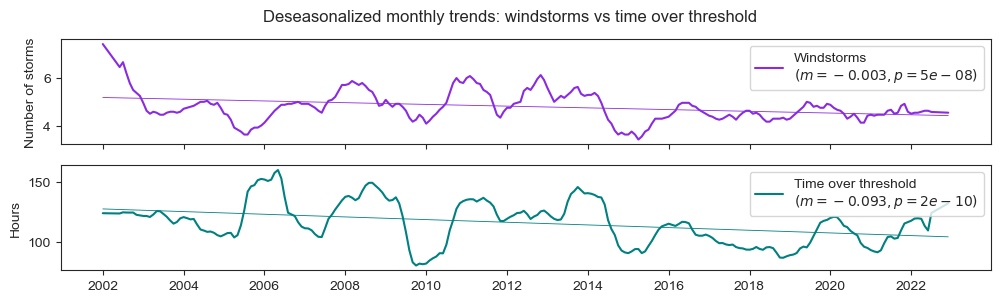

In [944]:
y = trend_sd
x = np.arange(len(y))
x = sm.add_constant(x)
mod = sm.OLS(y, x)
result = mod.fit()

y1 = trend_sd_toth
x1 = np.arange(len(y1))
x1 = sm.add_constant(x1)
mod1 = sm.OLS(y1, x1)
result1 = mod1.fit()

trend = np.polyfit(x=np.arange(0,252,1) , y=trend_sd, deg=1)
trendpoly = np.poly1d(trend) 
trend1 = np.polyfit(x=np.arange(0,252,1) , y=trend_sd_toth, deg=1)
trendpoly1 = np.poly1d(trend1) 

fig, ax = plt.subplots(2, sharex=True, figsize=(12,3))

ax[0].plot(windstorm_trend, color='blueviolet', label=f'Windstorms\n$(m={np.round(trend[0],3)}, p={np.round(result.pvalues[1],8)})$')
ax[0].plot(trendpoly(full_months), linewidth=0.6, color='blueviolet')
ax[0].set_xticks(ticks = np.arange(0,253,24), labels=np.arange(2002,2023,2))
ax[0].set_ylabel("Number of storms")
ax[0].tick_params(axis="y")
ax[0].legend(loc='upper right')

ax[1].plot(trend_sd_toth, color='teal', label=f'Time over threshold\n$(m={np.round(trend1[0],3)}, p={np.round(result1.pvalues[1],10)})$')
ax[1].plot(trendpoly1(full_months), linewidth=0.6, color='teal')
ax[1].set_ylabel("Hours")
ax[1].tick_params(axis="y")
ax[1].legend(loc='upper right')

fig.suptitle("Deseasonalized monthly trends: windstorms vs time over threshold")
fig.savefig('f_full_des_comparison.pdf',bbox_inches='tight')

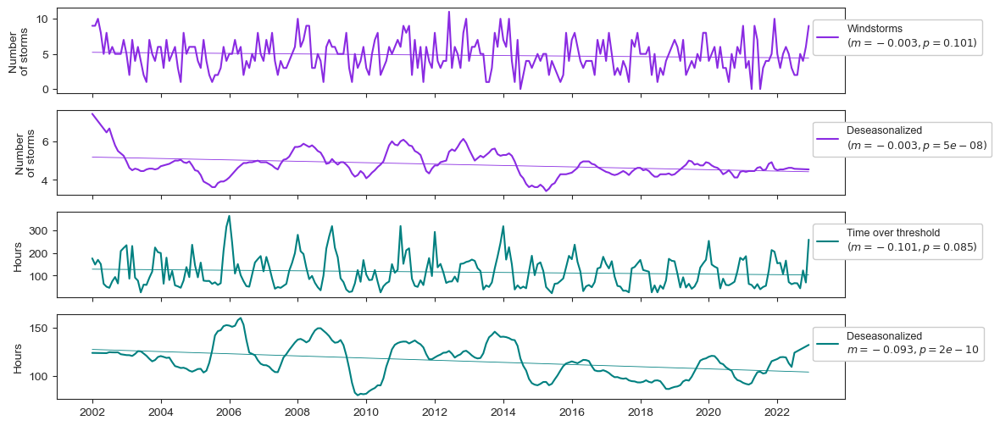

In [1007]:
y = yearly_monthly_storms
x = np.arange(len(y))
x = sm.add_constant(x)
mod = sm.OLS(y, x)
result = mod.fit()

y2 = trend_sd
x2 = np.arange(len(y2))
x2 = sm.add_constant(x2)
mod2 = sm.OLS(y2, x2)
result2 = mod2.fit()

y3 = full_monthly_hours_over_threshold
x3 = np.arange(len(y3))
x3 = sm.add_constant(x3)
mod3 = sm.OLS(y3, x3)
result3 = mod3.fit()

y4 = trend_sd_toth
x4 = np.arange(len(y4))
x4 = sm.add_constant(x4)
mod4 = sm.OLS(y4, x4)
result4 = mod4.fit()

trend = np.polyfit(x=np.arange(0,252,1) , y=yearly_monthly_storms, deg=1)
trendpoly = np.poly1d(trend) 
trend2 = np.polyfit(x=np.arange(0,252,1) , y=trend_sd, deg=1)
trendpoly2 = np.poly1d(trend2) 
trend3 = np.polyfit(x=np.arange(0,252,1) , y=full_monthly_hours_over_threshold, deg=1)
trendpoly3 = np.poly1d(trend3) 
trend4 = np.polyfit(x=np.arange(0,252,1) , y=trend_sd_toth, deg=1)
trendpoly4 = np.poly1d(trend4) 

fig, ax = plt.subplots(4, sharex=True, figsize=(12,6))

ax[0].plot(yearly_monthly_storms, color='blueviolet', label=f'Windstorms\n$(m={np.round(trend[0],3)}, p={np.round(result.pvalues[1],3)})$')
ax[0].plot(trendpoly(full_months), linewidth=0.6, color='blueviolet')
ax[0].set_xticks(ticks = np.arange(0,253,24), labels=np.arange(2002,2023,2))
ax[0].set_ylabel("Number\nof storms")
ax[0].tick_params(axis="y")
ax[0].legend(prop={'size': 9},loc=(.96, .45),fancybox=True, framealpha=1) 

ax[1].plot(trend_sd, color='blueviolet', label=f'Deseasonalized\n$(m={np.round(trend2[0],3)}, p={np.round(result2.pvalues[1],8)})$')
ax[1].plot(trendpoly2(full_months), linewidth=0.6, color='blueviolet')
ax[1].set_ylabel("Number\nof storms")
ax[1].tick_params(axis="y")
ax[1].legend(prop={'size': 9},loc=(.96, .45),fancybox=True, framealpha=1) 
             
ax[2].plot(full_monthly_hours_over_threshold, color='teal', label=f'Time over threshold\n$(m={np.round(trend3[0],3)}, p={np.round(result3.pvalues[1],3)})$')
ax[2].plot(trendpoly3(full_months), linewidth=0.6, color='teal')
ax[2].set_ylabel("Hours")
ax[2].tick_params(axis="y")
ax[2].legend(prop={'size': 9},loc=(.96, .45),fancybox=True, framealpha=1) 

ax[3].plot(trend_sd_toth, color='teal', label=f'Deseasonalized\n$m={np.round(trend4[0],3)}, p={np.round(result4.pvalues[1],10)}$')
ax[3].plot(trendpoly4(full_months), linewidth=0.6, color='teal')
ax[3].set_ylabel("Hours")
ax[3].tick_params(axis="y")
ax[3].legend(prop={'size': 9},loc=(.96, .45),fancybox=True, framealpha=1) 

# fig.suptitle("Deseasonalized monthly trends: windstorms vs time over threshold")
# fig.savefig('f_full_des_comparison2.pdf',bbox_inches='tight')

Text(0.5, 0.98, 'Deseasonalized trends: windstorms vs time over threshold')

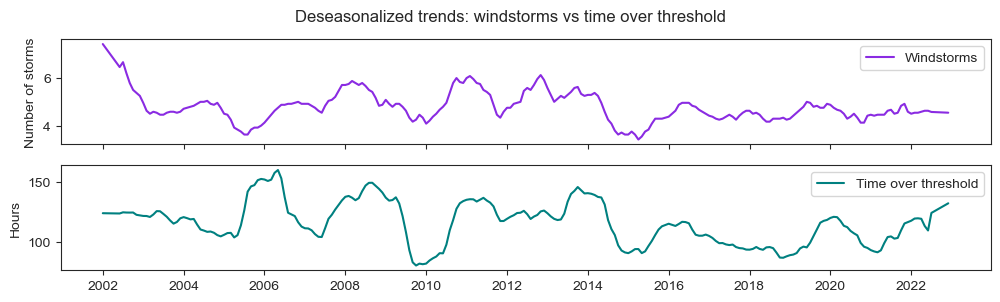

In [960]:
fig, ax = plt.subplots(2, sharex=True, figsize=(12,3))

ax[0].plot(windstorm_trend, color='blueviolet', label='Windstorms')
ax[1].plot(trend_sd_toth, color='teal', label='Time over threshold')

ax[0].set_xticks(ticks = np.arange(0,253,24), labels=np.arange(2002,2023,2))
ax[0].set_ylabel("Number of storms")
ax[0].tick_params(axis="y")
ax[0].legend(loc='upper right')

ax[1].set_ylabel("Hours")
ax[1].tick_params(axis="y")
ax[1].legend(loc='upper right')

fig.suptitle("Deseasonalized trends: windstorms vs time over threshold")
# fig.savefig('full_des_comparison.pdf',bbox_inches='tight')

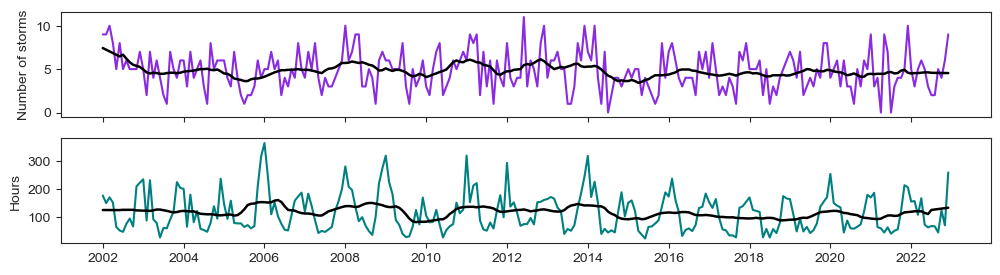

In [967]:
fig, ax = plt.subplots(2, sharex=True, figsize=(12,3))

ax[0].plot(yearly_monthly_storms, color='blueviolet', label='Observations')
ax[0].plot(windstorm_trend, color='black', linewidth=1.8, label='Deseasonalized trend')

ax[0].set_xticks(ticks = np.arange(0,253,24), labels=np.arange(2002,2023,2))
ax[0].set_ylabel("Number of storms")
ax[0].tick_params(axis="y")

ax[1].plot(full_monthly_hours_over_threshold, color='teal', label='Observations')
ax[1].plot(trend_sd_toth, color='black', linewidth=1.8, label='Deseasonalized trend')

ax[1].set_xticks(ticks = np.arange(0,253,24), labels=np.arange(2002,2023,2))
ax[1].set_ylabel("Hours")
ax[1].tick_params(axis="y")

# fig.suptitle("Deseasonalized trends: windstorms vs time over threshold")
# fig.savefig('full_des_comparison.pdf',bbox_inches='tight')

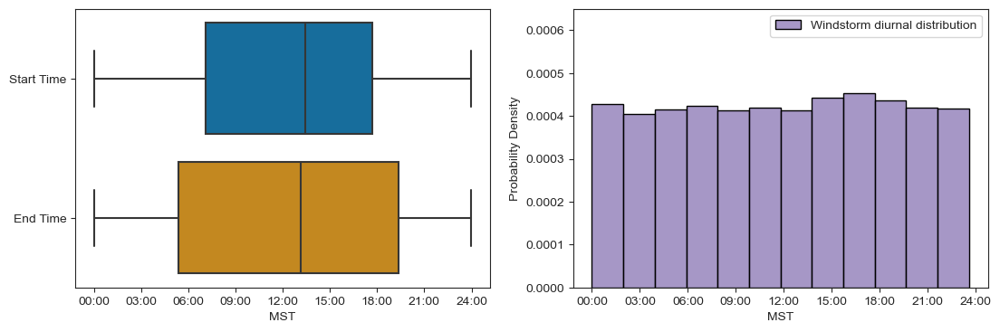

In [1064]:
plt.subplots(figsize=(13, 4))

plt.subplot(1, 2, 1)
d = {'Start Time': storm_starttimes_daily, 'End Time': storm_stoptimes_daily}
ddf = pd.DataFrame(data=d)

sns.boxplot(data=ddf[["Start Time", "End Time"]], orient="h", palette='colorblind')
plt.xlabel(f"MST")
plt.xticks(np.arange(0, 1441, 3*60), plot_hours[0::3])

plt.subplot(1, 2, 2)
sns.histplot(
    storm_times_daily, kde=False, bins=12, color = '#8874b4',
    stat="density", kde_kws=dict(cut=3), label='Windstorm diurnal distribution', edgecolor='black') 
plt.xlabel(f"MST")
plt.ylabel("Probability Density")
plt.legend(loc='upper right')
plt.ylim(0,0.00065)
plt.xticks(np.arange(0, 2401, 300), plot_hours[0::3])

plt.savefig('f_diurnal.pdf',bbox_inches='tight')

In [1029]:
sns.color_palette(palette='colorblind', n_colors=None, desat=None, as_cmap=False)

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]